##Data Preprocessing & Analysis

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
pd.read_csv("/content/Sleep_health_and_lifestyle_dataset.csv")

FileNotFoundError: [Errno 2] No such file or directory: '/content/Sleep_health_and_lifestyle_dataset.csv'

In [ ]:
df = pd.read_csv("/content/Sleep_health_and_lifestyle_dataset.csv")

In [ ]:
df.info()

In [ ]:
df.describe()

No missing data, some interesting variables that I want to correlate and maybe form a regression predictor, Quality of Sleep vs Sleep Duration, Stress Level vs Sleep Duration, and Heart Rate vs Sleep Duration

In [ ]:
df = df[["Age",	"Sleep Duration",	"Quality of Sleep","Physical Activity Level", "Stress Level",	"Heart Rate",	"Daily Steps"]]

NameError: name 'df' is not defined

In [ ]:
#80-20 partition
trainDf = df.iloc[:round(374*4/5), :]

In [ ]:
testDf = df.iloc[round(374*4/5):, :]

##Basic EDA and Graphing

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
x = np.array(trainDf["Sleep Duration"])
y = np.array(trainDf["Stress Level"])

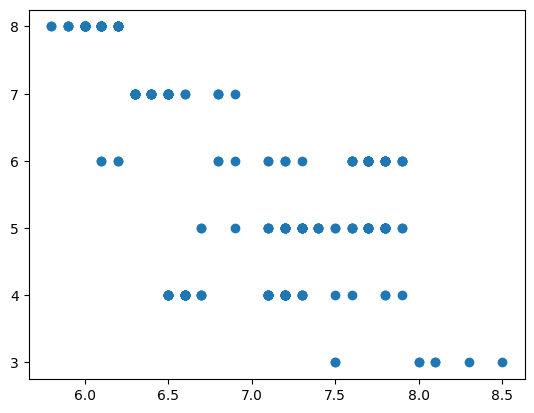

In [ ]:
plt.scatter(x,y)

Not really what I was looking for, lets try some others.

In [ ]:
x = np.array(trainDf["Sleep Duration"])
y = np.array(trainDf["Heart Rate"])

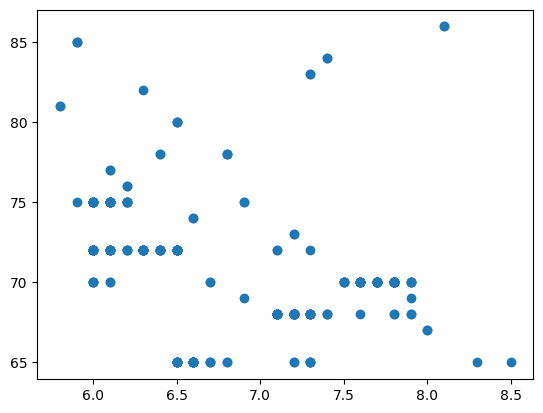

In [ ]:
plt.scatter(x,y)

Again, the data seems very blocky with a lot of fixation at every interval of 5.

In [ ]:
x = np.array(trainDf["Age"])
y = np.array(trainDf["Sleep Duration"])

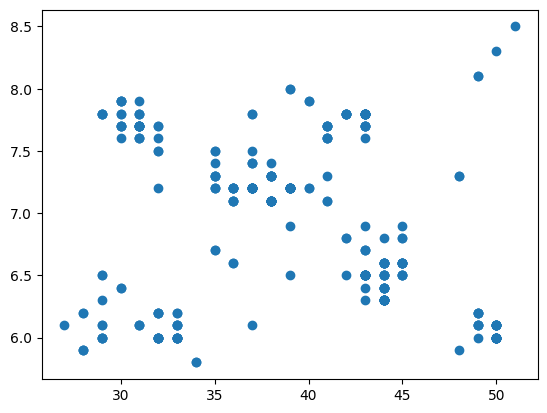

In [ ]:
plt.scatter(x,y)

Fascinating, clearly there is a negative correlation, but there are clusters of people in their 30-35s getting little sleep. This would be a fun graph to analyze + predict.

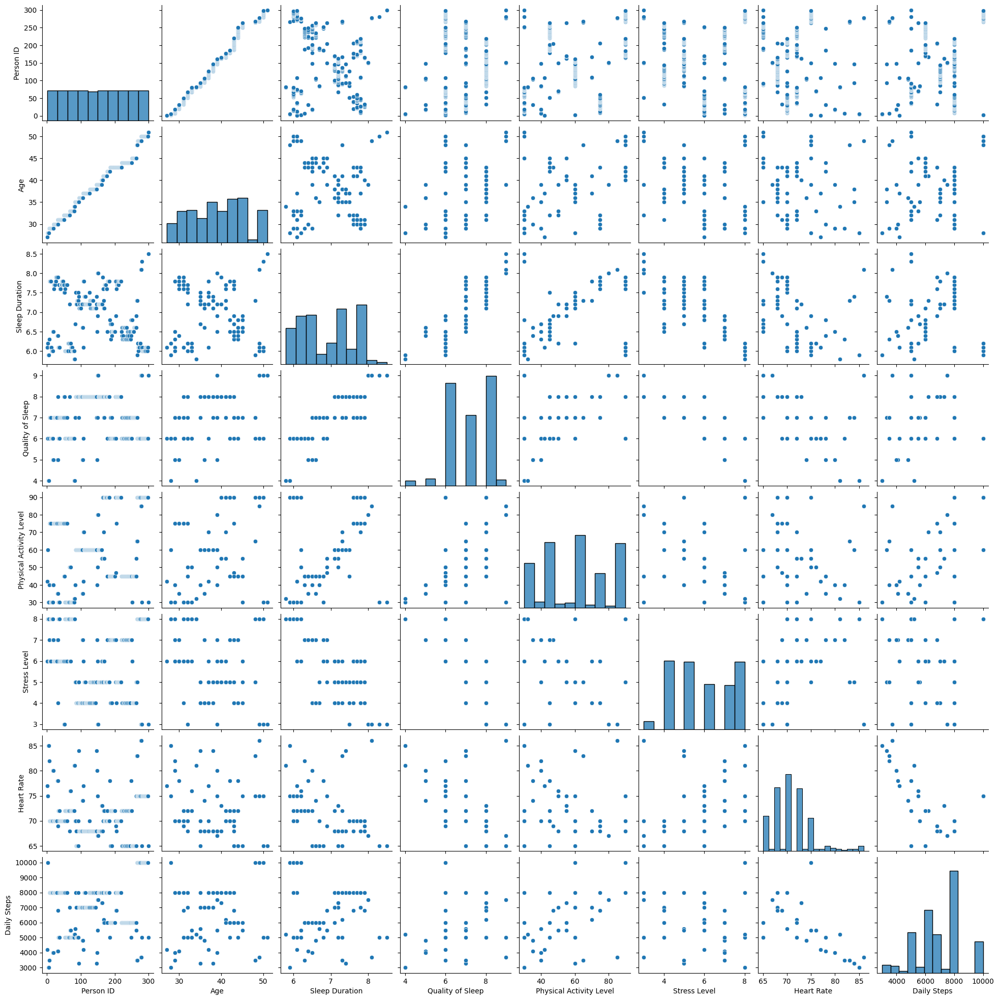

In [ ]:
sns.pairplot(trainDf)

Heart Rate and Daily steps have the most linearity.

##Loss Functions

In [ ]:
def rms(yList, yhatList):
  valueSum = 0
  for index in range(len(yList)):
    valueSum += (yList[0][index] - yhatList[0][index]) ** 2
  return valueSum/len(yList[0])

def rSqrt(yList, yhatList):
  meanDeviation = 0
  for index in range(len(yList[0])):
    meanDeviation += (yList[index] - sum(yList)/len(yList)) ** 2
  return 1 - rms(yList, yhatList) * len(yList)/meanDeviation

In [ ]:
#MAE and other loss functions add here.

In [ ]:
rSqrt([1,3,4,9], [1,3,4,9])

1.0

##Learning and Playing around


In [ ]:
#Crude linear regression gradient descent alg

In [ ]:
weights = np.random.rand(2,1)

In [ ]:
y = np.random.rand(2,1)

In [ ]:
y

array([[0.57744507],
       [0.51088161]])

In [ ]:
weights

array([[0.00264439],
       [0.78572376]])

In [ ]:
point = np.hstack((point, np.ones((point.shape[0], 1))))

In [ ]:
point

array([[5.04310258, 1.        ],
       [5.3161907 , 1.        ]])

In [ ]:
yhat = np.dot(point,weights)

In [ ]:
yhat

array([[0.79905969],
       [0.79978185]])

In [ ]:
y - yhat

array([[-0.22161462],
       [-0.28890023]])

In [ ]:
sum(y-yhat)

array([-0.51051486])

In [ ]:
x = np.array([trainDf["Daily Steps"]])

In [ ]:
x

array([[ 4200, 10000, 10000,  3000,  3000,  3000,  3500,  8000,  8000,
         8000,  8000,  8000,  8000,  8000,  8000,  8000,  4000,  8000,
         4000,  8000,  8000,  8000,  8000,  8000,  8000,  8000,  8000,
         8000,  8000,  8000,  4100,  4100,  6800,  5000,  8000,  5000,
         5000,  8000,  8000,  8000,  8000,  8000,  8000,  8000,  8000,
         8000,  8000,  8000,  8000,  8000,  8000,  8000,  5000,  8000,
         5000,  5000,  8000,  5000,  5000,  8000,  5000,  5000,  5000,
         5000,  5000,  5000,  7000,  5000,  5500,  5500,  5000,  5000,
         5000,  5000,  5000,  5000,  5000,  5000,  5000,  5000,  5200,
         5200,  5600,  5600,  8000,  7000,  5000,  5000,  5000,  5000,
         5000,  5000,  8000,  3300,  7000,  7000,  7000,  7000,  7000,
         7000,  7000,  7000,  7000,  4800,  7000,  4800,  4200,  7000,
         7000,  8000,  7000,  8000,  7000,  8000,  7000,  7000,  7000,
         7000,  7000,  7000,  7000,  7000,  7000,  7000,  7000,  8000,
      

In [ ]:
x.shape

(1, 299)

In [ ]:
x = np.transpose(x, (1,0))
x

array([[ 4200],
       [10000],
       [10000],
       [ 3000],
       [ 3000],
       [ 3000],
       [ 3500],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4100],
       [ 4100],
       [ 6800],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [

In [ ]:
y = np.transpose(np.array([trainDf["Heart Rate"]]),(1,0))

In [ ]:
y

array([[77],
       [75],
       [75],
       [85],
       [85],
       [85],
       [82],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [80],
       [70],
       [80],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [78],
       [78],
       [69],
       [72],
       [70],
       [72],
       [72],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [72],
       [70],
       [72],
       [72],
       [70],
       [72],
       [72],
       [70],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],
       [68],
       [72],
       [76],
       [76],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],

<Axes: >

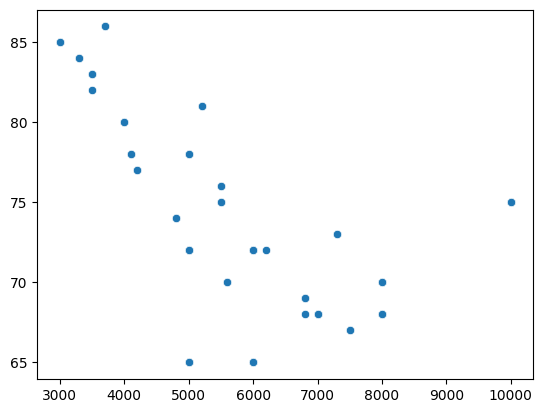

In [ ]:
sns.scatterplot(x=x[0],y=y[0])

In [ ]:
len(x)

299

In [ ]:
import math
import time

In [ ]:
def houdini(xN,y, batch, epoch, learningRate):
  x = np.hstack((xN, np.ones((xN.shape[0], 1))))
  weights = np.random.rand(2,1) * 1

  for cantUseX in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch+batch > len(x):
        yhat = np.dot(x[batchCount*batch: len(x),:],weights)
        print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
      else:
        print(x[batchCount*batch:batchCount*batch+batch, : ])
        print(weights)
        yhat = np.dot(x[batchCount*batch:batchCount*batch+batch, : ],weights)
        print(yhat)
        # print("RMS: ", sum((y[batchCount*batch: batchCount*batch+batch,:] - yhat) ** 2)[0])
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))



      # plt.scatter(xN,y)
      # plt.plot([3000, 10000], [weights[0] * 3000 + weights[1], weights[0] * 10000 + weights[1]], 'k-', color = 'r')
      # plt.show()

  return weights


In [ ]:
weights = houdini(x,y,20,10,0.000001)

Streaming output truncated to the last 5000 lines.
 [4.0e+03 1.0e+00]
 [5.5e+03 1.0e+00]
 [7.5e+03 1.0e+00]
 [7.5e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]]
[[ 0.01194216]
 [-0.11167829]]
[[83.48344624]
 [95.42560689]
 [83.48344624]
 [83.48344624]
 [95.42560689]
 [39.29745184]
 [95.42560689]
 [47.6569643 ]
 [65.57020527]
 [89.45452656]
 [89.45452656]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]
 [95.42560689]]
[[8.0e+03 1.0e+00]
 [7.3e+03 1.0e+00]
 [7.3e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [6.2e+03 1.0e+00]
 [6.0e+03 1.0e+00]
 [6.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [6.0e+03 1.0e+00]
 [8.0e+03 1.0e+00]
 [8.0e+0

In [ ]:
weights

array([[ 0.01134494],
       [-0.11227551]])

array([[ 4200],
       [10000],
       [10000],
       [ 3000],
       [ 3000],
       [ 3000],
       [ 3500],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4100],
       [ 4100],
       [ 6800],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [

In [ ]:
x.shape

(1, 299)

In [ ]:
gah = np.hstack((x, np.ones((x.shape[0], 1))))

In [ ]:
import numpy as np

In [ ]:
np.array([[1],[1],[2],[3]])

array([[1],
       [1],
       [2],
       [3]])

In [ ]:
sum((np.array([[1],[3],[2],[3]]) - np.array([[1],[1],[2],[3]])) ** 2)

array([4])

In [ ]:
sns.scatterplot(x=x[0],y=y[0])

In [ ]:
import matplotlib.pyplot as plt

<ipython-input-76-6b55db96ff96>:1: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([1, 1], [0, 1], 'k-', color = 'r')


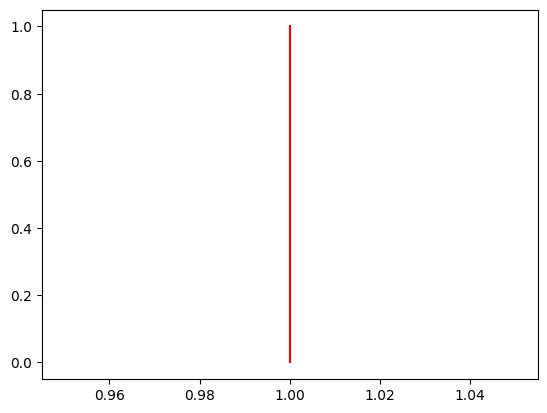

In [ ]:
plt.plot([1, 1], [0, 1], 'k-', color = 'r')

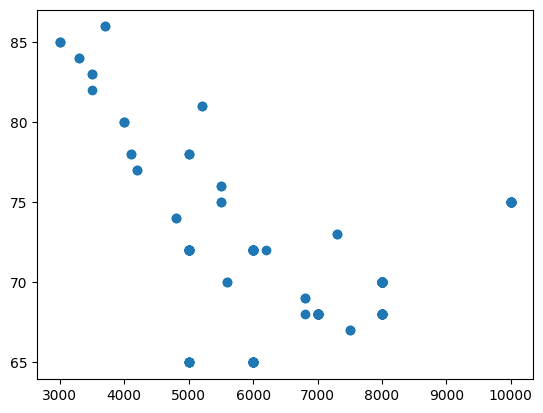

In [ ]:
plt.scatter(x,y)

In [ ]:
y = weights[0] * 300 + weights[1]

In [ ]:
weights[0]

array([0.00949911])

In [ ]:
weights[1]

array([-28.32429802])

<ipython-input-88-742fff7cdebd>:2: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([3000, 10000], [weights[0] * 3000 + weights[1], weights[0] * 10000 + weights[1]], 'k-', color = 'r')


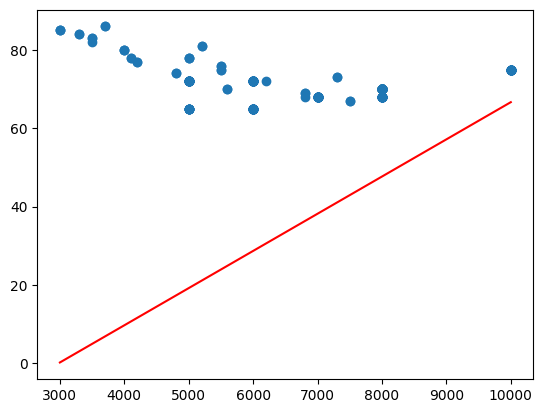

In [ ]:
plt.scatter(x,y)
plt.plot([3000, 10000], [weights[0] * 3000 + weights[1], weights[0] * 10000 + weights[1]], 'k-', color = 'r')

In [ ]:
x

array([[ 4200],
       [10000],
       [10000],
       [ 3000],
       [ 3000],
       [ 3000],
       [ 3500],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 4000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 4100],
       [ 4100],
       [ 6800],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 8000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [ 8000],
       [ 5000],
       [ 5000],
       [

In [ ]:
y

array([[77],
       [75],
       [75],
       [85],
       [85],
       [85],
       [82],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [80],
       [70],
       [80],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [78],
       [78],
       [69],
       [72],
       [70],
       [72],
       [72],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [70],
       [72],
       [70],
       [72],
       [72],
       [70],
       [72],
       [72],
       [70],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],
       [68],
       [72],
       [76],
       [76],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],
       [72],

In [ ]:
weights

array([[ 0.01134494],
       [-0.11227551]])

In [ ]:
10000*0.01134494 - 0.11227551

113.33712449

The dataset is actually really weird

In [ ]:
y = np.transpose(np.array([trainDf["Daily Steps"]]),(1,0))

In [ ]:
x = np.transpose(np.array([trainDf["Physical Activity Level"]]),(1,0))

In [ ]:
import math

In [ ]:
weights = houdini(x,y,20,10,0.000001)

Streaming output truncated to the last 5000 lines.
 [40.  1.]
 [50.  1.]
 [80.  1.]
 [80.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]
 [60.  1.]]
[[5.95218897]
 [5.57757046]]
[[362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [243.66512931]
 [303.18701902]
 [481.75268815]
 [481.75268815]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]
 [362.70890873]]
[[60.  1.]
 [55.  1.]
 [55.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [70.  1.]
 [55.  1.]
 [55.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [90.  1.]
 [45.  1.]
 [90.  1.]
 [90.  1.]]
[[6.22716157]
 [5.85254306]]
[[379.48223732]
 [348.34642947]
 [348.34642947]
 [566.29708445]
 [566.29708445]
 [566.29708445]
 [441.75385303]
 [348.34642947]
 [348.34642947]
 [566.29708445]
 [566.29708445]
 [566.29708445]
 [566.2970844

In [ ]:
weights

array([[30.2075233 ],
       [29.83290479]])

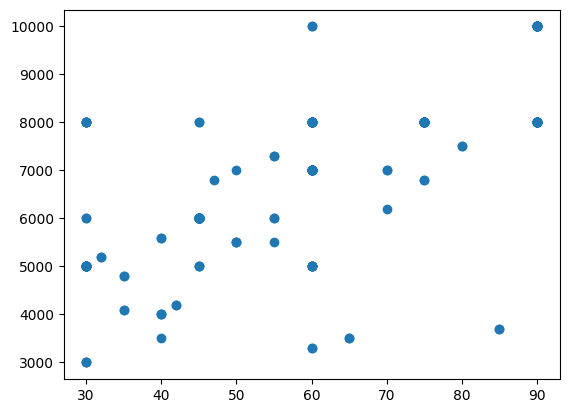

In [ ]:
plt.scatter(x,y)

In [ ]:
weights

array([[30.2075233 ],
       [29.83290479]])

<ipython-input-22-564be5ed4e16>:2: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([30, 90], [weights[0] * 30 + weights[1], weights[0] * 90 + weights[1]], 'k-', color = 'r')


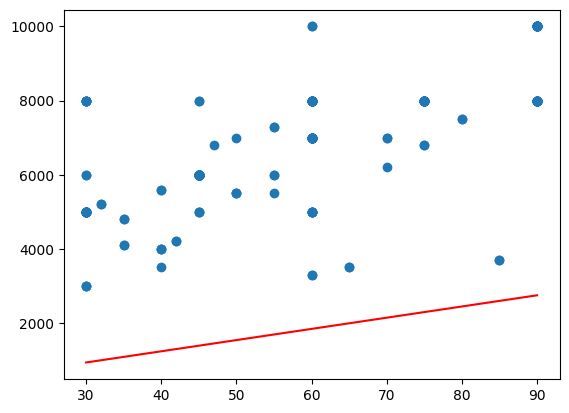

In [ ]:
plt.scatter(x,y)
plt.plot([30, 90], [weights[0] * 30 + weights[1], weights[0] * 90 + weights[1]], 'k-', color = 'r')

In [ ]:
def houdini(xN,y, batch, epoch, learningRate):
  x = np.hstack((xN, np.ones((xN.shape[0], 1))))
  weights = np.random.rand(2,1) * 1

  for cantUseX in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch+batch > len(x):
        yhat = np.dot(x[batchCount*batch: len(x),:],weights)
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
      else:
        # print(x[batchCount*batch:batchCount*batch+batch, : ])
        # print(weights)
        yhat = np.dot(x[batchCount*batch:batchCount*batch+batch, : ],weights)
        # print(yhat)
        # print("RMS: ", sum((y[batchCount*batch: batchCount*batch+batch,:] - yhat) ** 2)[0])
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))



      plt.scatter(xN,y)
      plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')
      plt.show()

  return weights


<ipython-input-28-6f84ce05c3f4>:25: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')


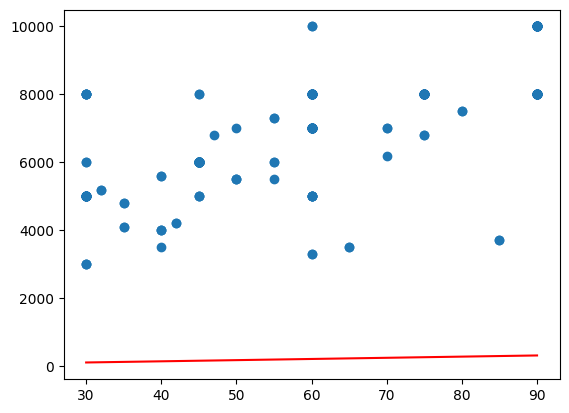

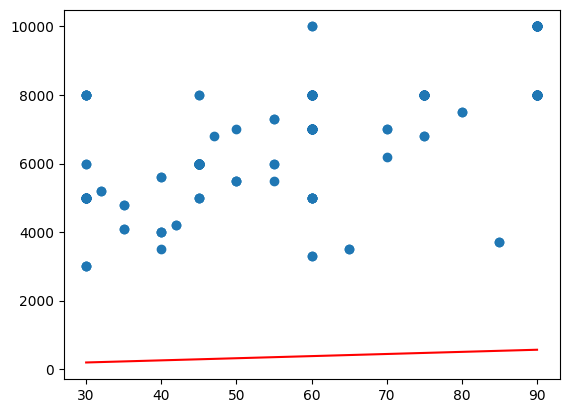

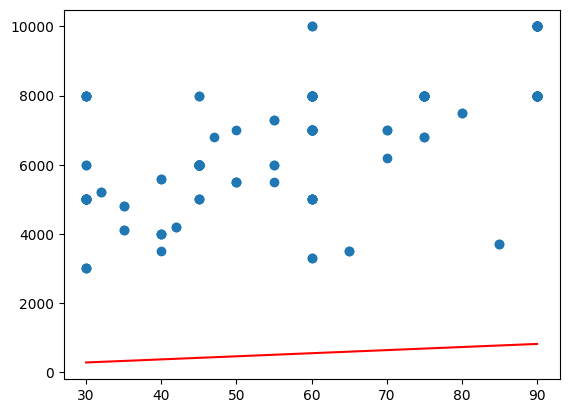

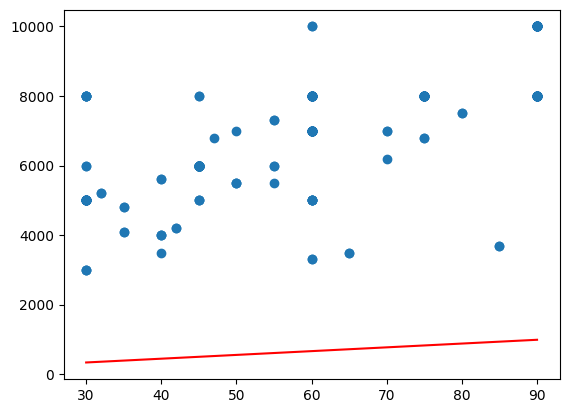

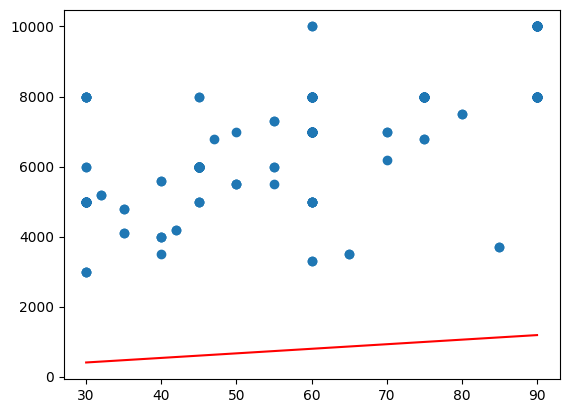

...

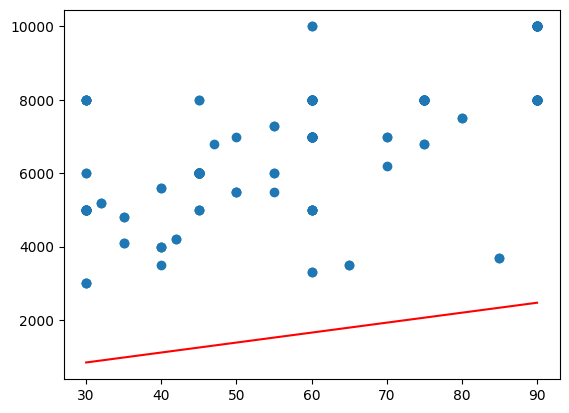

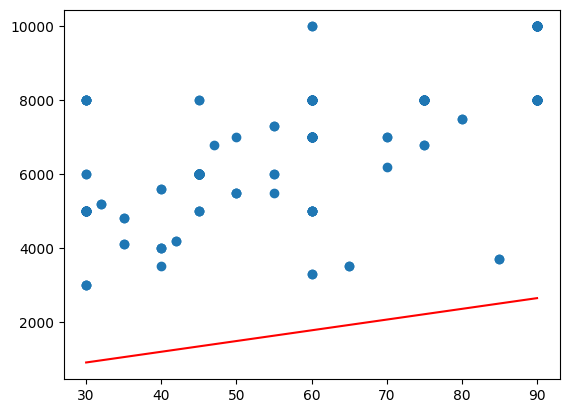

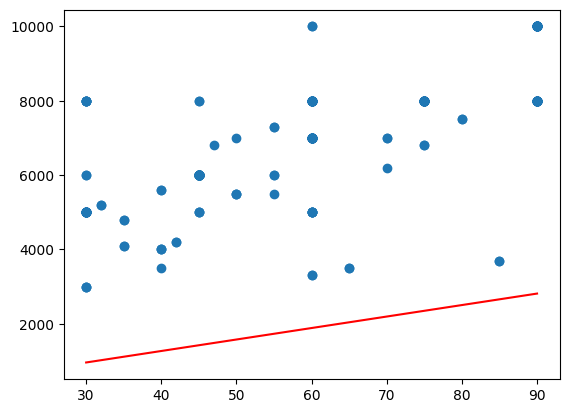

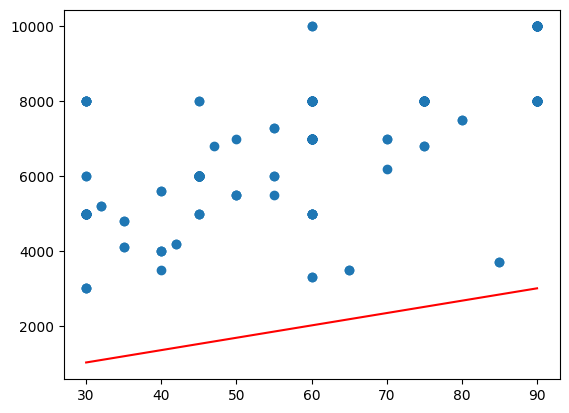

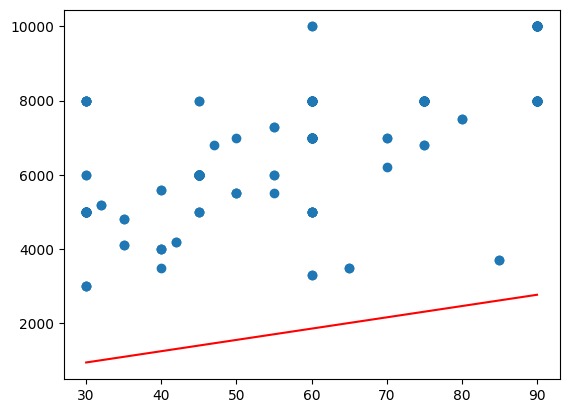

In [ ]:
weights = houdini(x,y,20,1,0.00001)

In [ ]:
weights

array([[30.41913796],
       [30.51046102]])

The big issue here is that the weights are exactly the same, because the back prop will always modify the weights and biases the same way.

##Trying houdini on other datasets

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0
...,...,...,...,...,...,...,...,...,...
16995,-124.26,40.58,52.0,2217.0,394.0,907.0,369.0,2.3571,111400.0
16996,-124.27,40.69,36.0,2349.0,528.0,1194.0,465.0,2.5179,79000.0
16997,-124.30,41.84,17.0,2677.0,531.0,1244.0,456.0,3.0313,103600.0
16998,-124.30,41.80,19.0,2672.0,552.0,1298.0,478.0,1.9797,85800.0


Testing houdini on a negative slope

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv("sample_data/california_housing_train.csv")

In [ ]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,-119.562108,35.625225,28.589353,2643.664412,539.410824,1429.573941,501.221941,3.883578,207300.912353
std,2.005166,2.137340,12.586937,2179.947071,421.499452,1147.852959,384.520841,1.908157,115983.764387
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.790000,33.930000,18.000000,1462.000000,297.000000,790.000000,282.000000,2.566375,119400.000000
50%,-118.490000,34.250000,29.000000,2127.000000,434.000000,1167.000000,409.000000,3.544600,180400.000000
75%,-118.000000,37.720000,37.000000,3151.250000,648.250000,1721.000000,605.250000,4.767000,265000.000000
max,-114.310000,41.950000,52.000000,37937.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [ ]:
import seaborn as sns

In [ ]:
testing = df[["median_income","median_house_value", "population", "total_bedrooms", "housing_median_age"]]

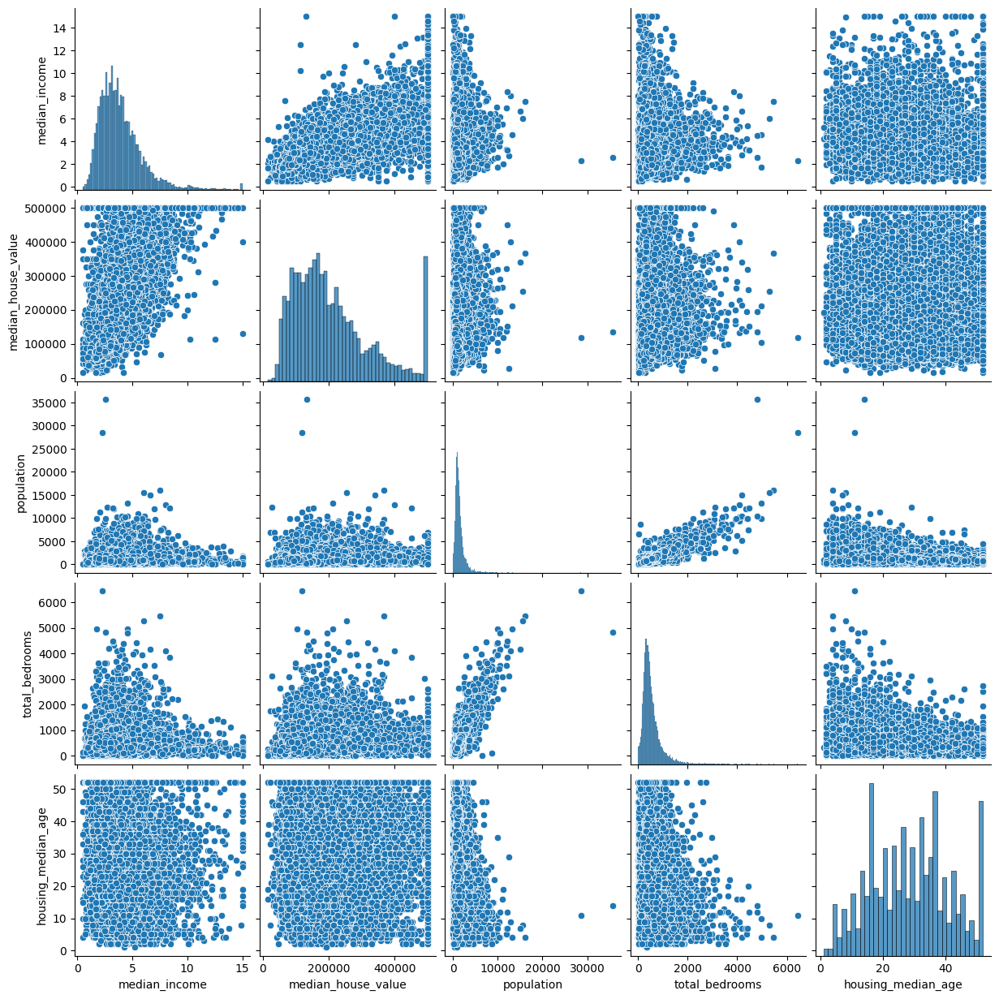

In [ ]:
sns.pairplot(testing)

In [ ]:
import numpy as np

In [ ]:
import numpy as np
x = np.transpose(np.array([df["housing_median_age"]]),(1,0))
y = np.transpose(np.array([df["population"]]),(1,0))

In [ ]:
import math

In [ ]:
import matplotlib.pyplot as plt

Setting the learning rate really high is super interesting.

In [ ]:
houdini(x,y, 10, 2, 0.0001)

[0. 0.]


ValueError: setting an array element with a sequence.

the weights have the same exact value since, both weights start at exactly the same point and the updating derivative is always the same. I noticed that my function isn't acounting for a value "x", but I don't know what that means. Do the weights need to be multiplied by the input, avg input, or something of that nature to modify slope.

Back to the math, when taking a derivative, chain rule ahahgladksjgla;sdgjk.

Update: looking through the math of houdini, a lot of stuff is flawed. First of all the derivative of the cost function is supposed to be divided by the total amount of points - which i totally forgot about. I'm assuming it will be the batch number then.

In [ ]:
def houdini(xN,y, batch, epoch, learningRate):
  x = np.hstack((xN, np.ones((xN.shape[0], 1))))
  weights = np.random.rand(2,1) * 1

  for cantUseX in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch+batch > len(x):
        yhat = np.dot(x[batchCount*batch: len(x),:],weights)
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
      else:
        # print(x[batchCount*batch:batchCount*batch+batch, : ])
        # print(weights)
        yhat = np.dot(x[batchCount*batch:batchCount*batch+batch, : ],weights)
        # print(yhat)
        # print("RMS: ", sum((y[batchCount*batch: batchCount*batch+batch,:] - yhat) ** 2)[0])
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))/batch
        weights[1] = weights[1] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))/batch



      plt.scatter(xN,y)
      plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')
      plt.show()

  return weights


<ipython-input-32-d1f019eada4a>:25: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')


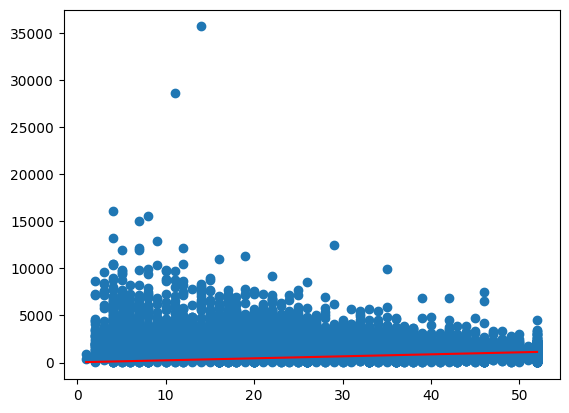

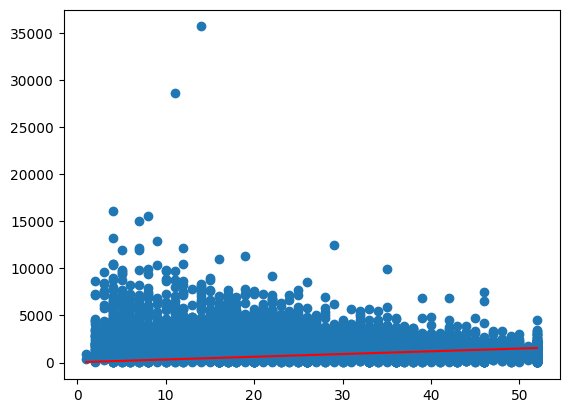

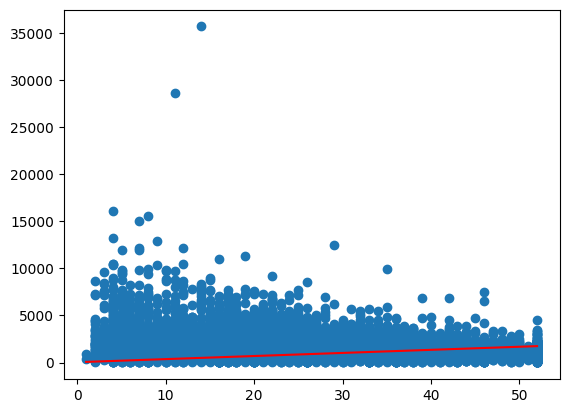

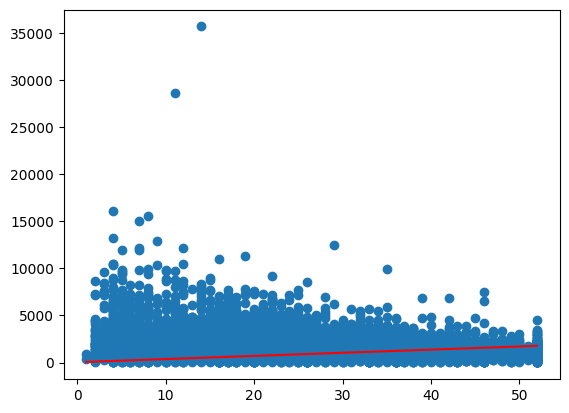

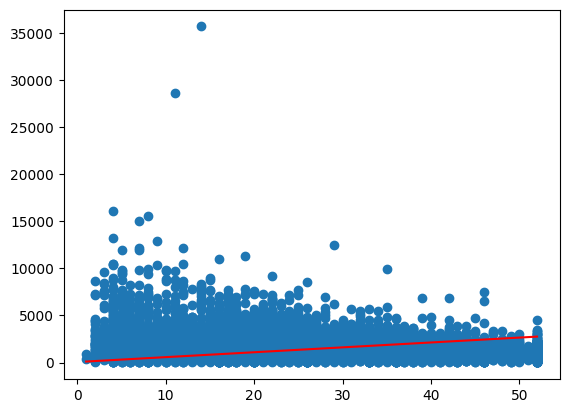

...

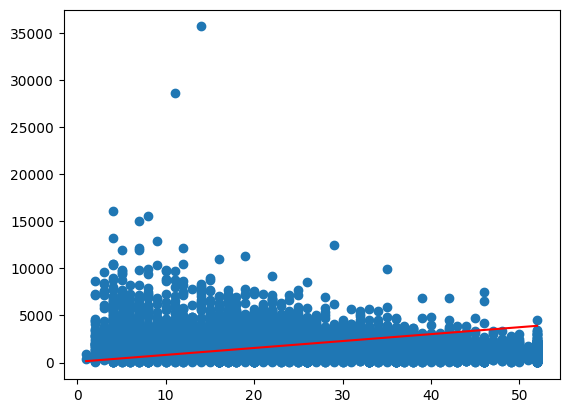

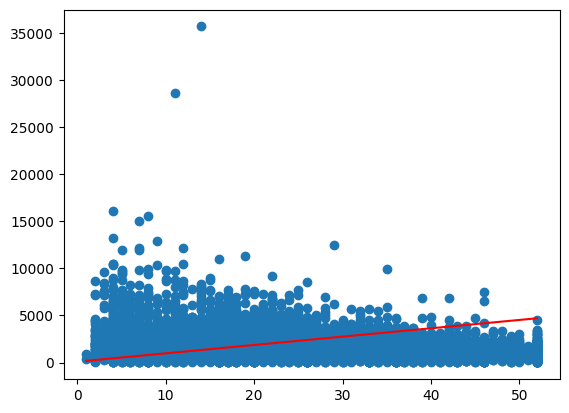

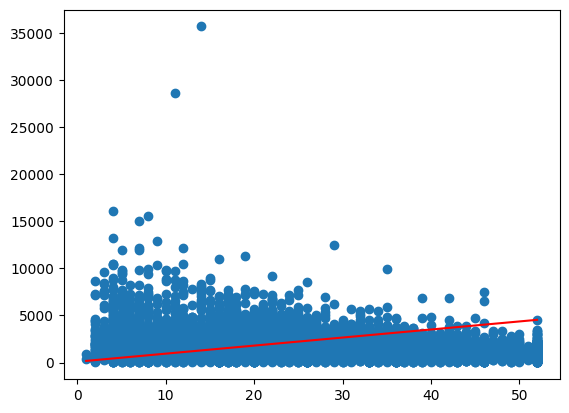

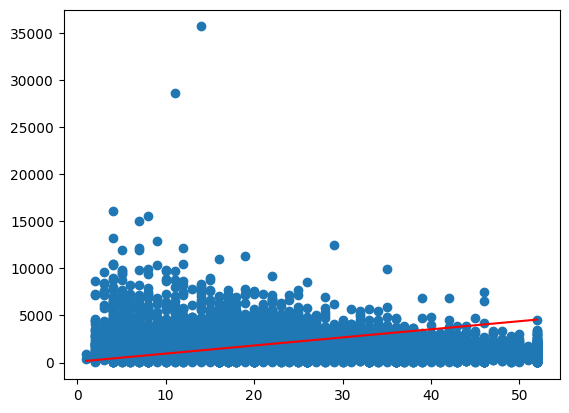

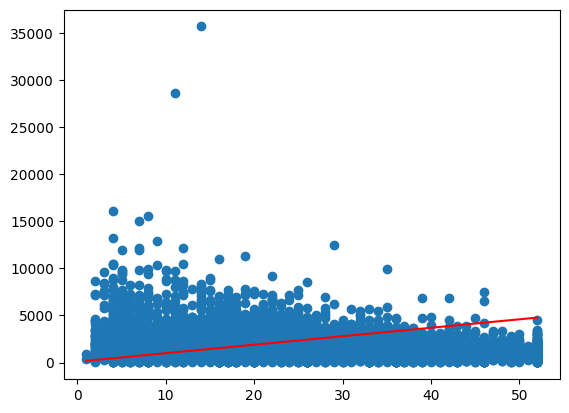

KeyboardInterrupt: 

In [ ]:
houdini(x,y, 10, 2, 0.01)

The first improvement generates far more stability within changes which is really intuitive because the values are changing at a factor divided by the total amoutn of points.

Moving on to the next one which will differentiate the weights since the updating functions will be different.

In [ ]:
def houdini(xN,y, batch, epoch, learningRate):
  x = np.hstack((xN, np.ones((xN.shape[0], 1))))
  weights = np.random.rand(2,1) * 1

  for cantUseX in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch+batch > len(x):
        yhat = np.dot(x[batchCount*batch: len(x),:],weights)
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
      else:
        # print(x[batchCount*batch:batchCount*batch+batch, : ])
        # print(weights)
        yhat = np.dot(x[batchCount*batch:batchCount*batch+batch, : ],weights)
        # print(yhat)
        # print("RMS: ", sum((y[batchCount*batch: batchCount*batch+batch,:] - yhat) ** 2)[0])
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat)) * sum(x[:,0])/batch
        weights[1] = weights[1] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))/batch
        print(sum(x[:,0]))



      plt.scatter(xN,y)
      plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')
      plt.show()
      print(weights)

  return weights

486019.0


<ipython-input-46-9af94c89c5d7>:26: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')


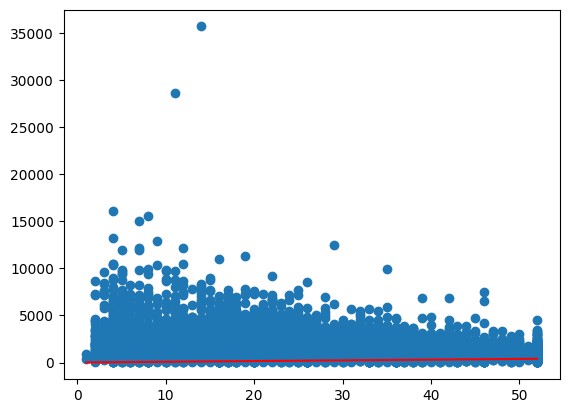

[[7.6034987 ]
 [0.09689721]]
486019.0


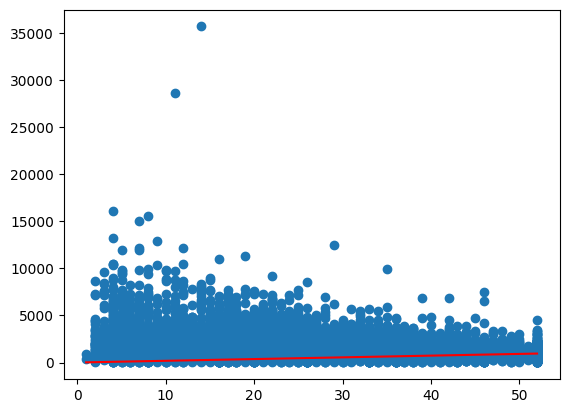

[[18.25101485]
 [ 0.09691911]]
486019.0


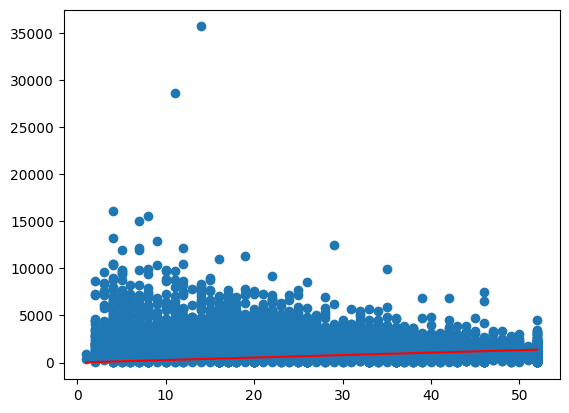

[[26.22101192]
 [ 0.09693551]]
486019.0


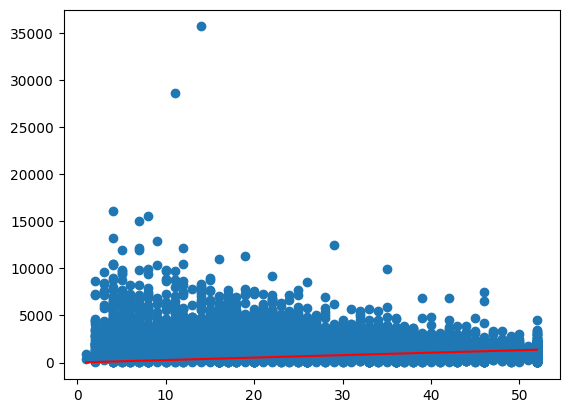

[[26.05851464]
 [ 0.09693518]]
486019.0


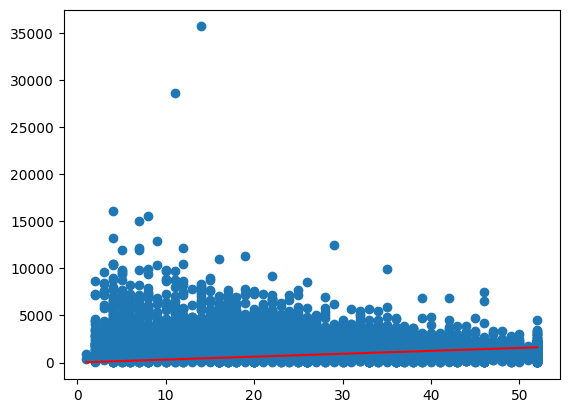

[[30.94560949]
 [ 0.09694523]]
486019.0


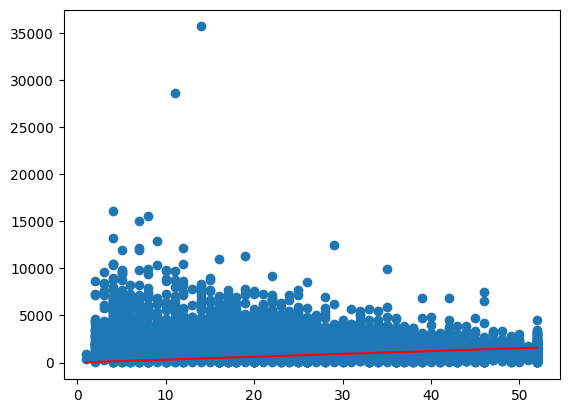

[[30.35606691]
 [ 0.09694402]]
486019.0


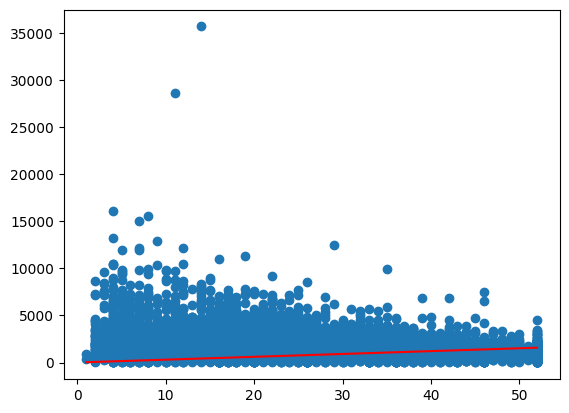

[[30.22055467]
 [ 0.09694374]]
486019.0


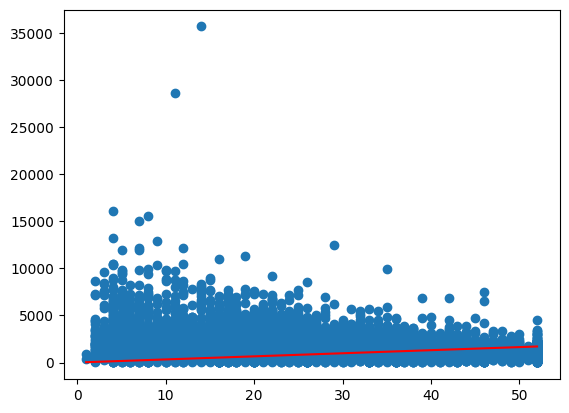

[[32.71618522]
 [ 0.09694888]]
486019.0


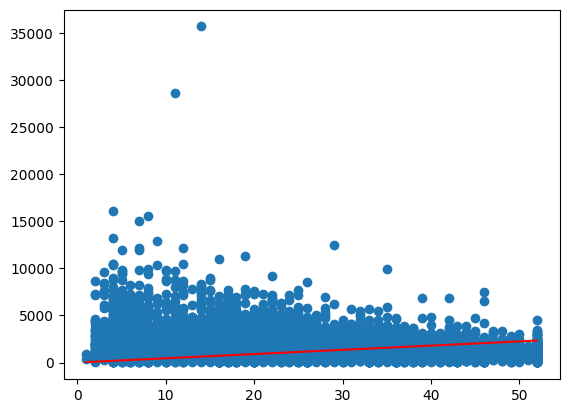

[[44.82284923]
 [ 0.09697379]]
486019.0


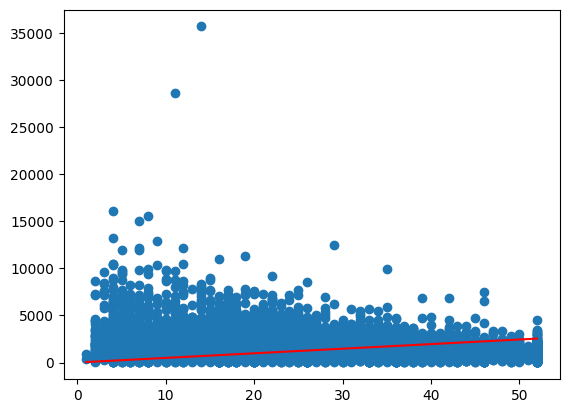

[[48.84046906]
 [ 0.09698205]]
486019.0


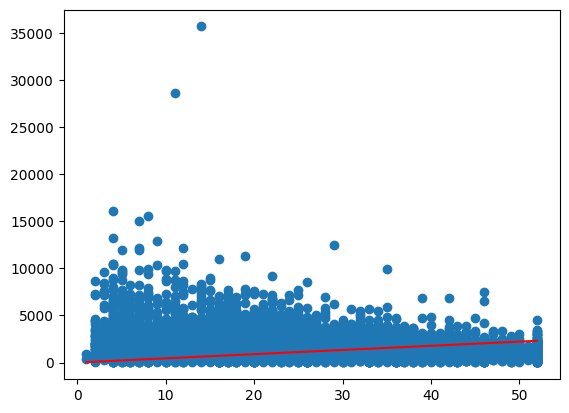

[[44.36747773]
 [ 0.09697285]]
486019.0


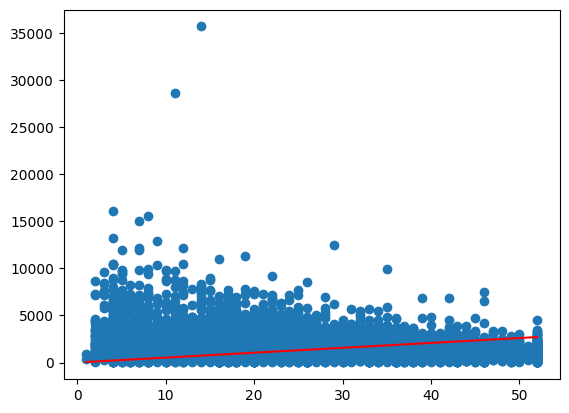

[[51.97341076]
 [ 0.0969885 ]]
486019.0


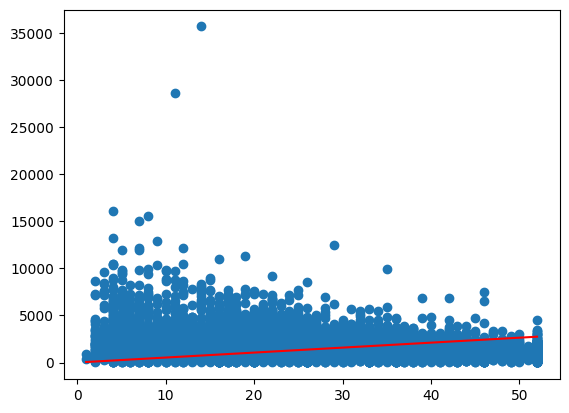

[[52.70243585]
 [ 0.09699   ]]
486019.0


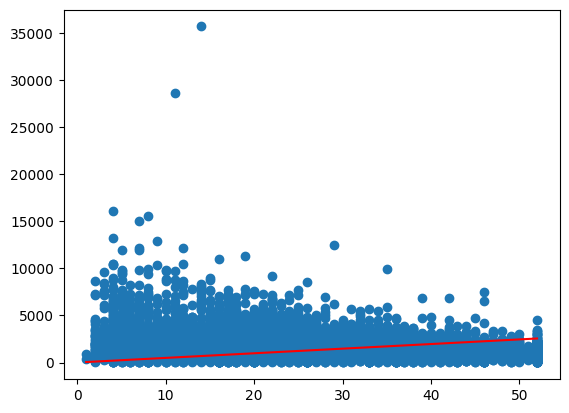

[[49.02904903]
 [ 0.09698244]]
486019.0


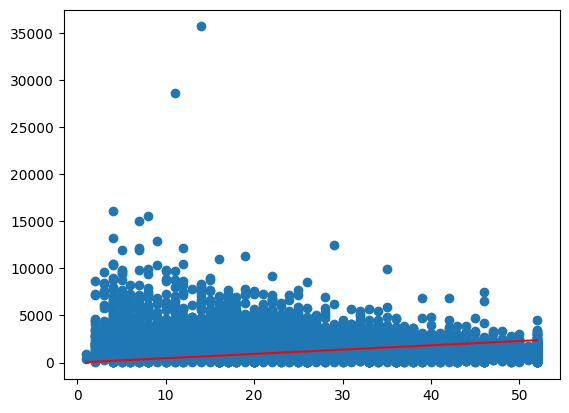

[[45.62857804]
 [ 0.09697545]]
486019.0


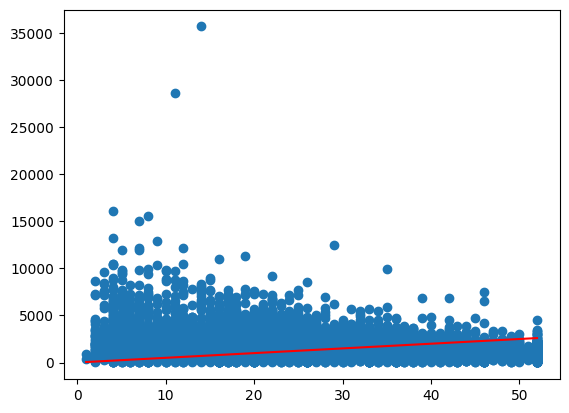

[[49.8927703 ]
 [ 0.09698422]]
486019.0


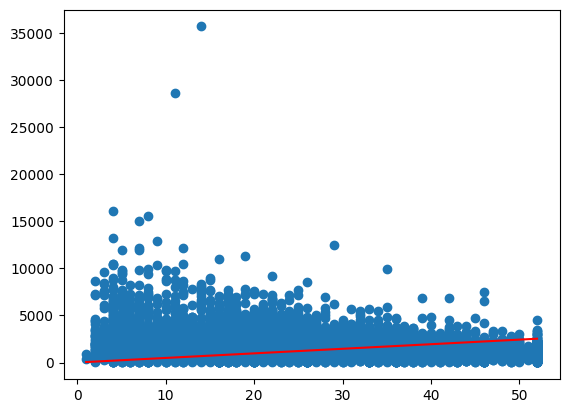

[[48.57349131]
 [ 0.0969815 ]]
486019.0


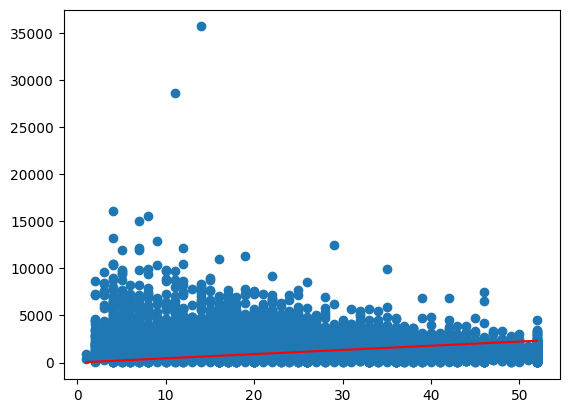

[[44.48476642]
 [ 0.09697309]]
486019.0


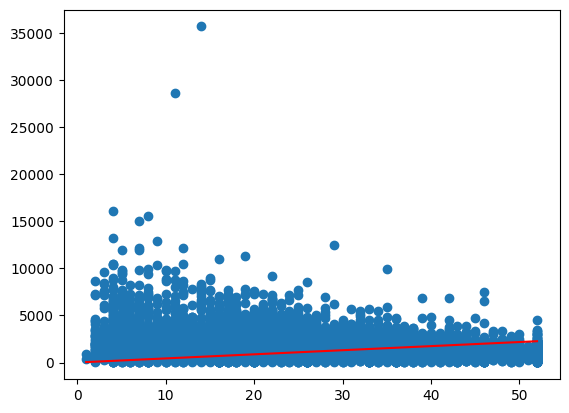

[[43.48770796]
 [ 0.09697104]]
486019.0


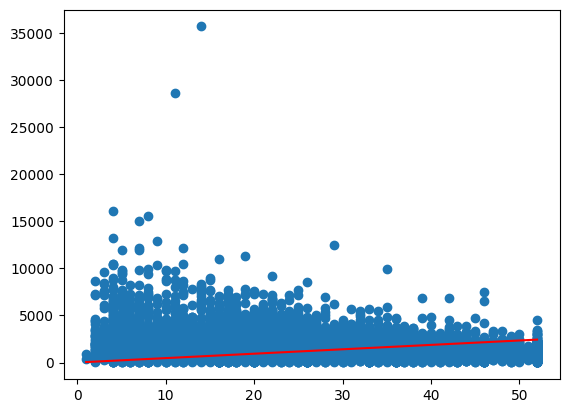

[[46.75799161]
 [ 0.09697777]]
486019.0


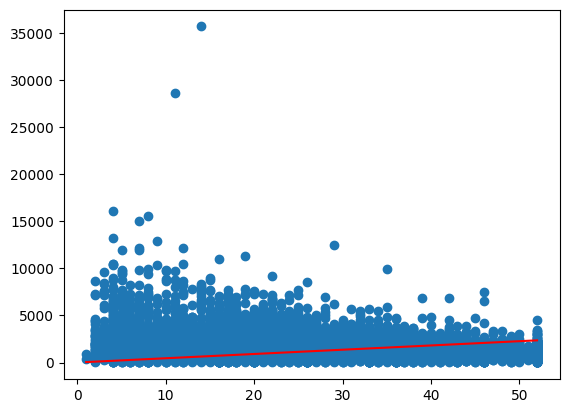

[[45.25567176]
 [ 0.09697468]]
486019.0


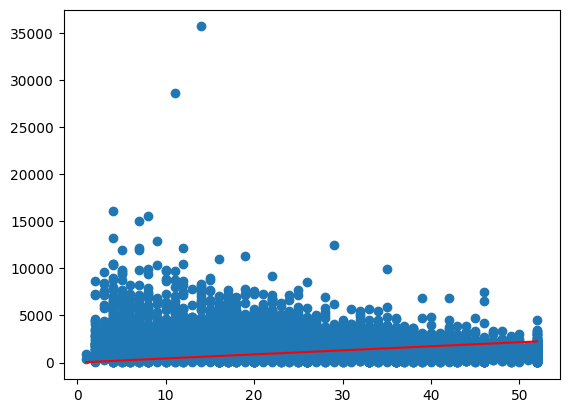

[[43.04863548]
 [ 0.09697014]]
486019.0


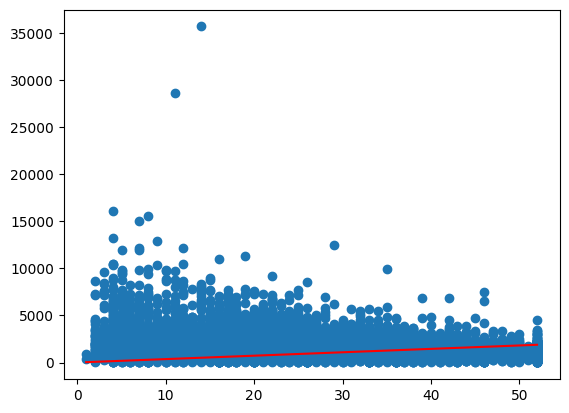

[[36.19552152]
 [ 0.09695604]]
486019.0


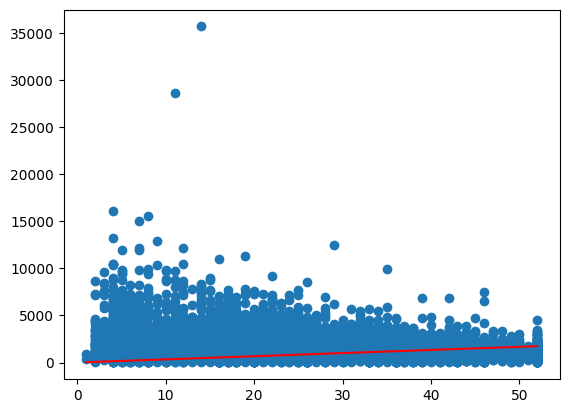

[[33.33338974]
 [ 0.09695015]]
486019.0


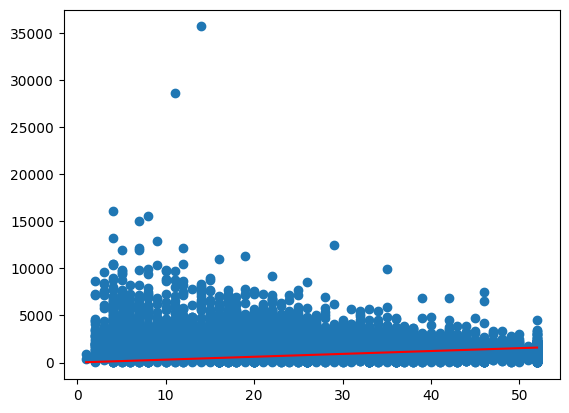

[[30.48372064]
 [ 0.09694428]]
486019.0


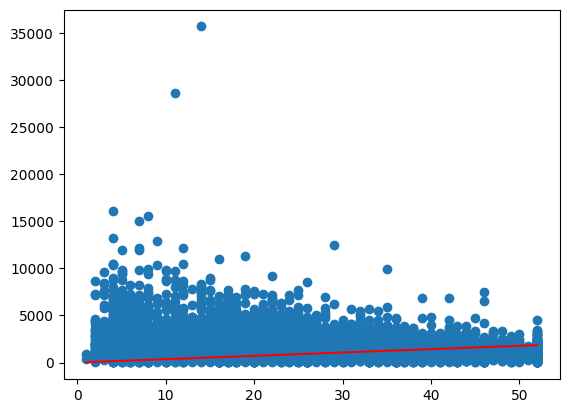

[[35.4548115 ]
 [ 0.09695451]]
486019.0


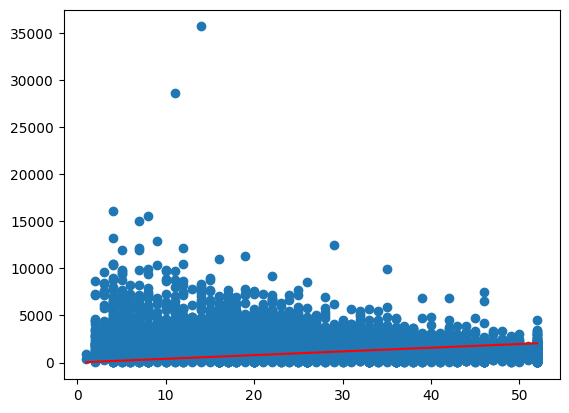

[[39.25130678]
 [ 0.09696232]]
486019.0


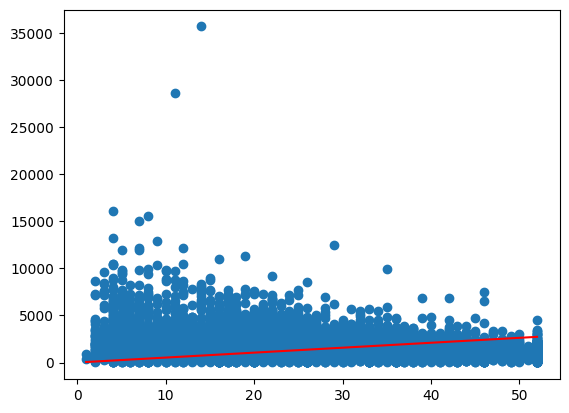

[[52.41928104]
 [ 0.09698942]]
486019.0


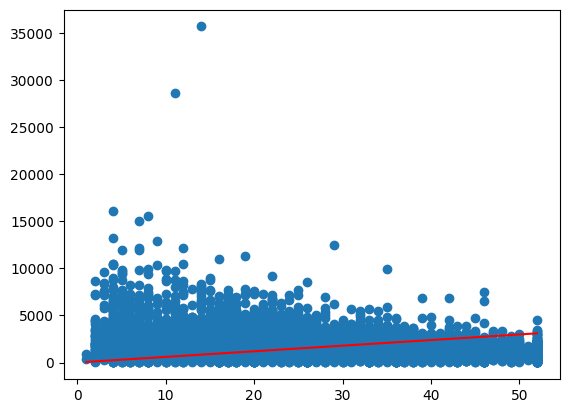

[[59.60127216]
 [ 0.09700419]]
486019.0


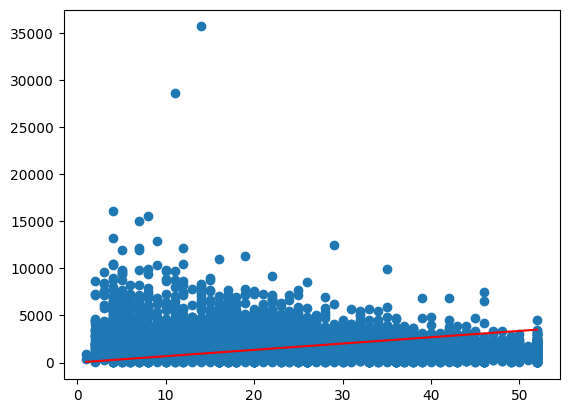

[[67.11161019]
 [ 0.09701965]]
486019.0


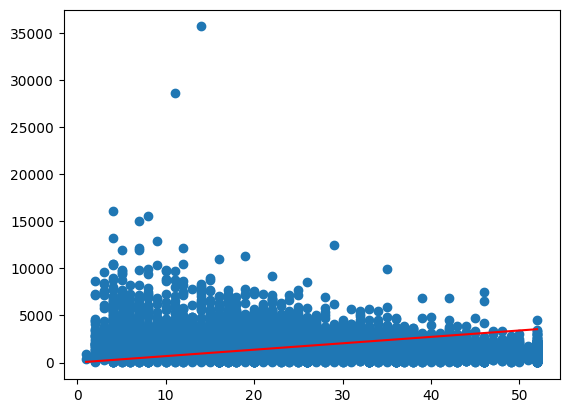

[[68.02167431]
 [ 0.09702152]]
486019.0


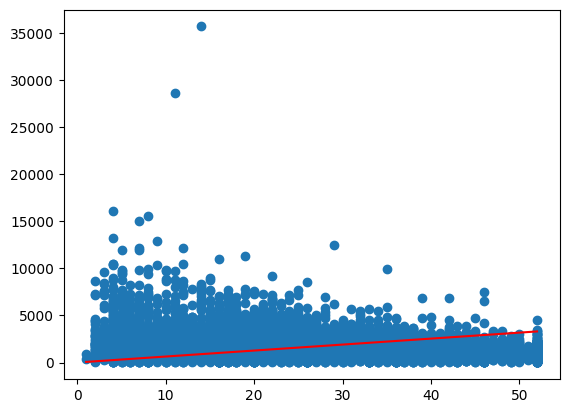

[[63.44143256]
 [ 0.0970121 ]]
486019.0


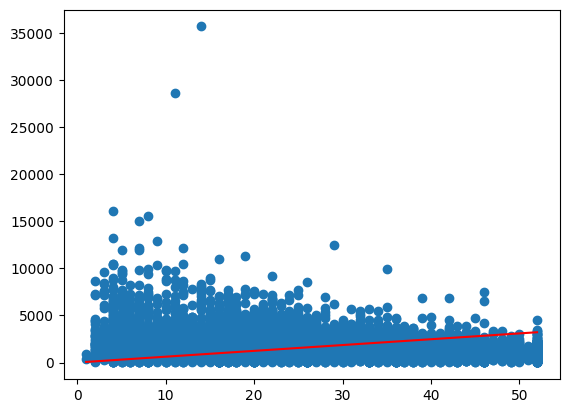

[[61.79184541]
 [ 0.0970087 ]]
486019.0


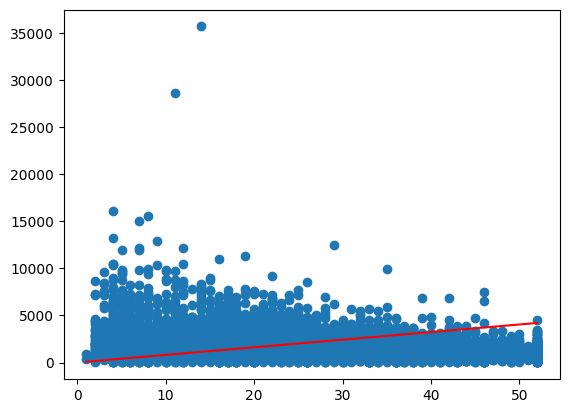

[[80.76067876]
 [ 0.09704773]]
486019.0


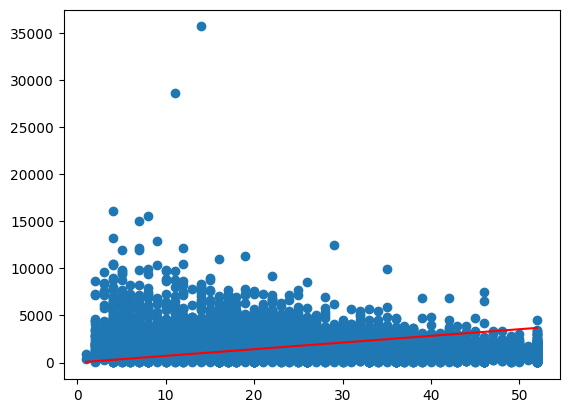

[[70.68890757]
 [ 0.09702701]]
486019.0


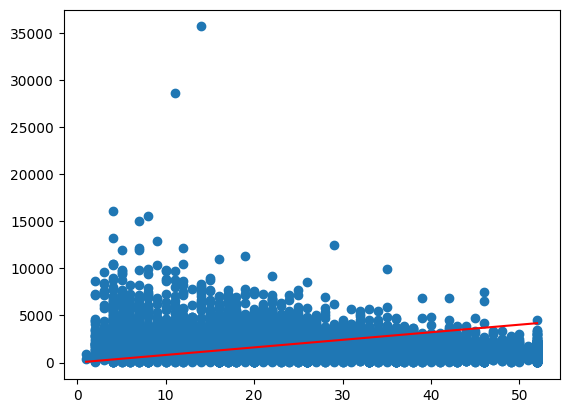

[[80.29446274]
 [ 0.09704677]]
486019.0


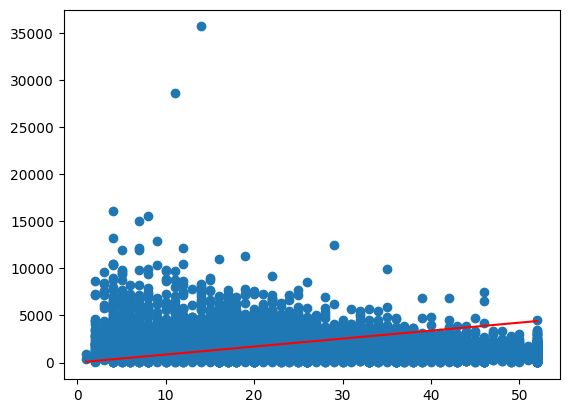

[[84.60715173]
 [ 0.09705564]]
486019.0


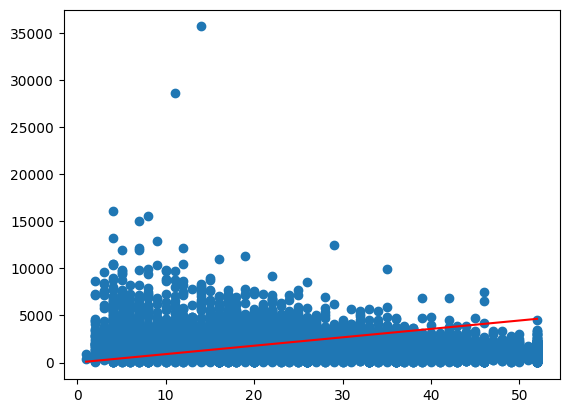

[[89.18520054]
 [ 0.09706506]]
486019.0


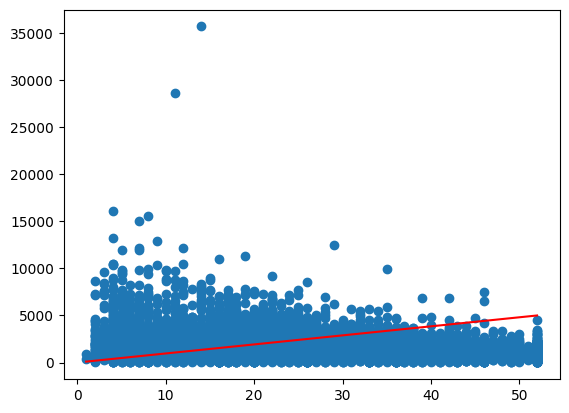

[[96.035827  ]
 [ 0.09707916]]
486019.0


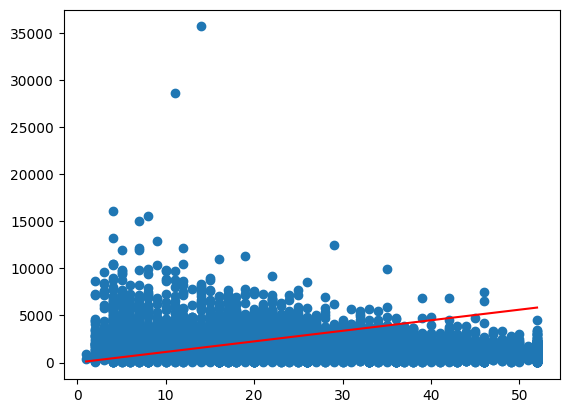

[[1.12172785e+02]
 [9.71123621e-02]]
486019.0


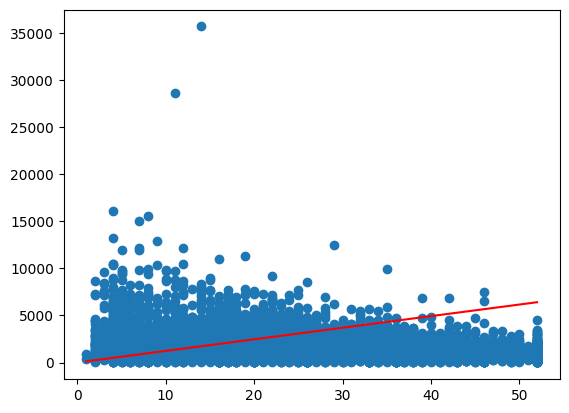

[[1.23105405e+02]
 [9.71348563e-02]]
486019.0


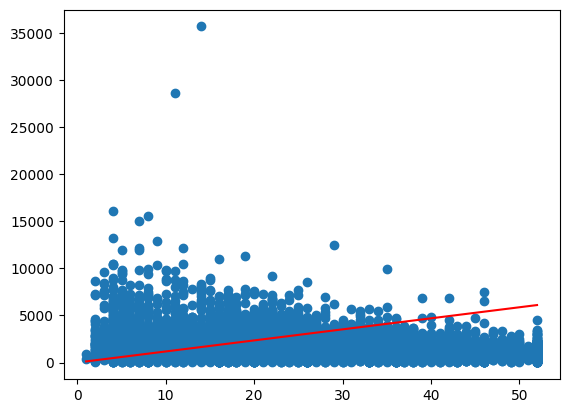

[[1.17304341e+02]
 [9.71229204e-02]]
486019.0


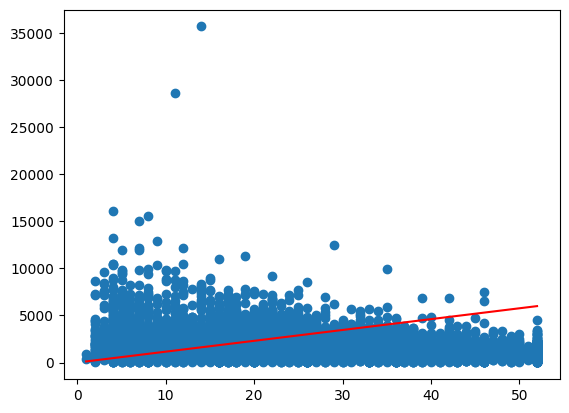

[[1.15140910e+02]
 [9.71184691e-02]]
486019.0


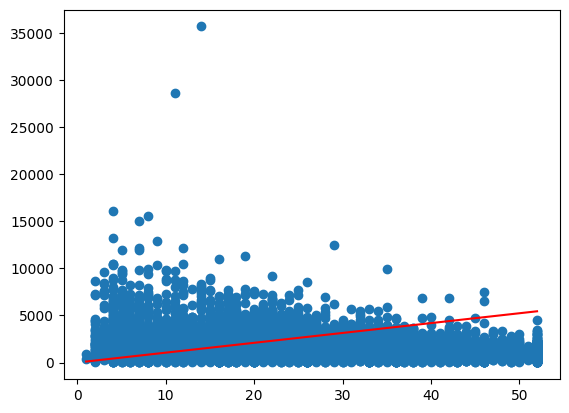

[[1.04609825e+02]
 [9.70968011e-02]]
486019.0


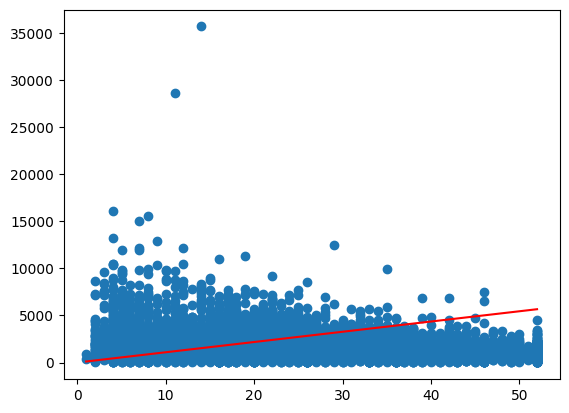

[[1.08815142e+02]
 [9.71054536e-02]]
486019.0


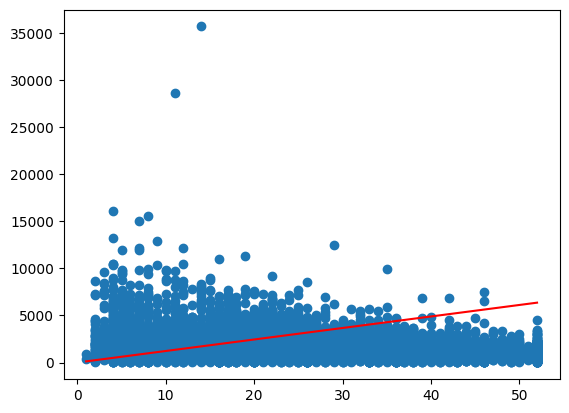

[[1.22192053e+02]
 [9.71329771e-02]]
486019.0


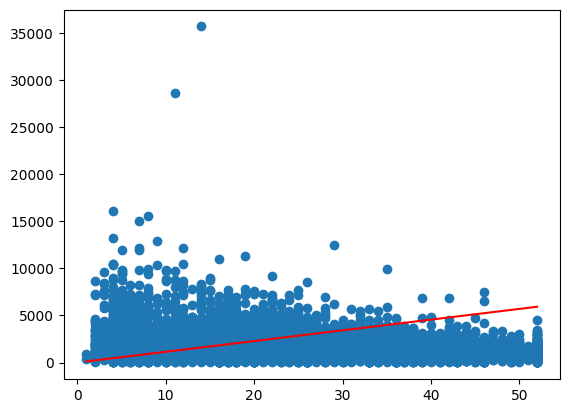

[[1.13838354e+02]
 [9.71157891e-02]]
486019.0


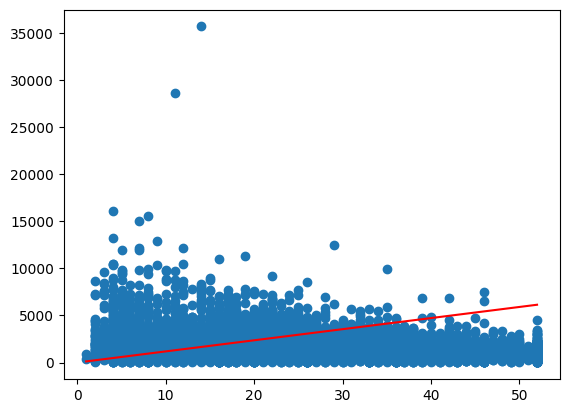

[[1.17947799e+02]
 [9.71242444e-02]]
486019.0


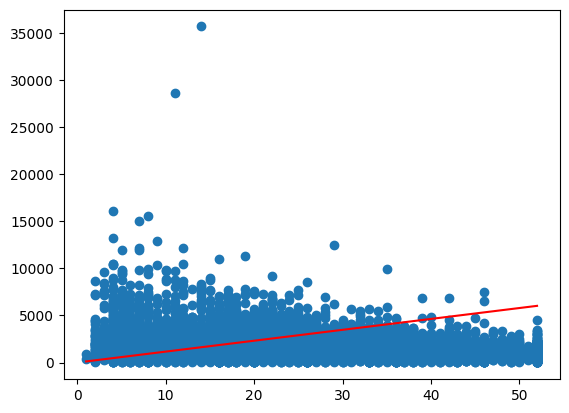

[[1.15692475e+02]
 [9.71196040e-02]]
486019.0


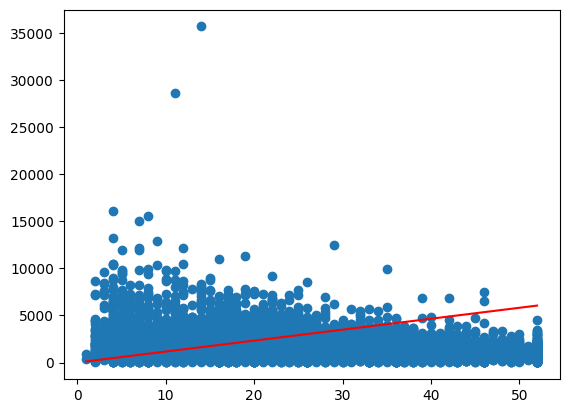

[[1.16216703e+02]
 [9.71206826e-02]]
486019.0


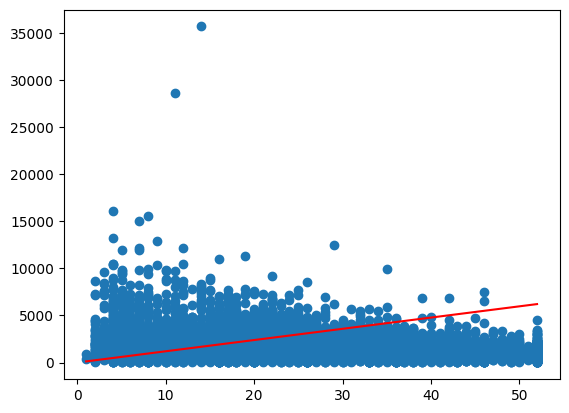

[[1.19286583e+02]
 [9.71269990e-02]]
486019.0


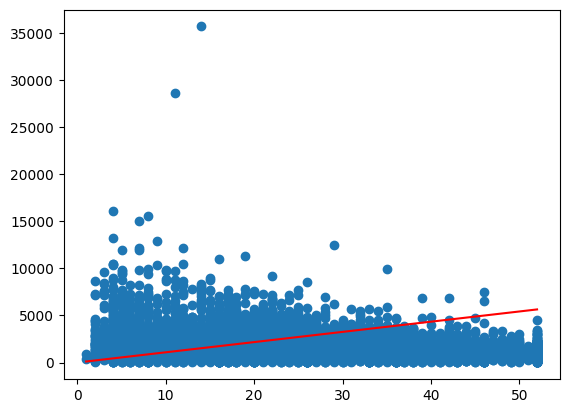

[[1.08380570e+02]
 [9.71045595e-02]]
486019.0


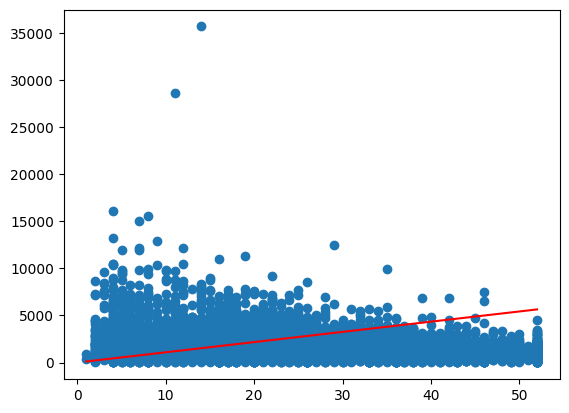

[[1.08401365e+02]
 [9.71046023e-02]]
486019.0


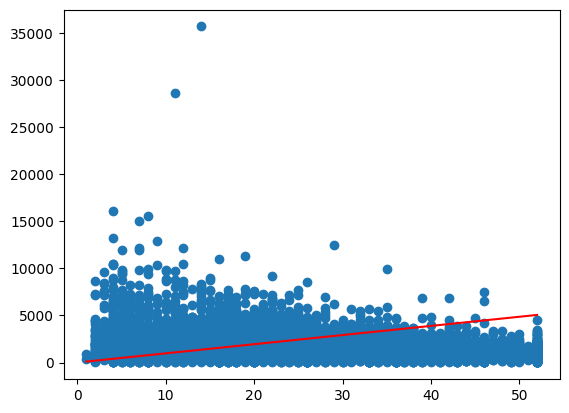

[[9.71470767e+01]
 [9.70814462e-02]]
486019.0


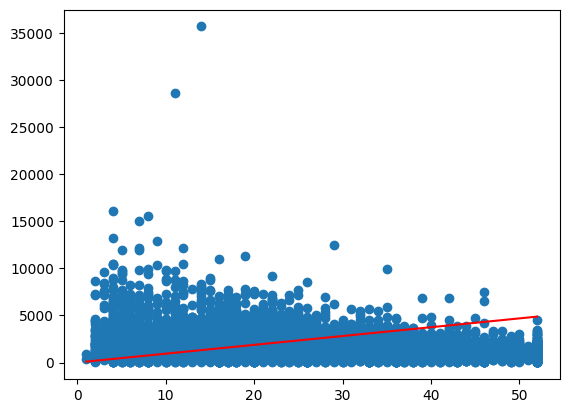

[[93.69722499]
 [ 0.09707435]]
486019.0


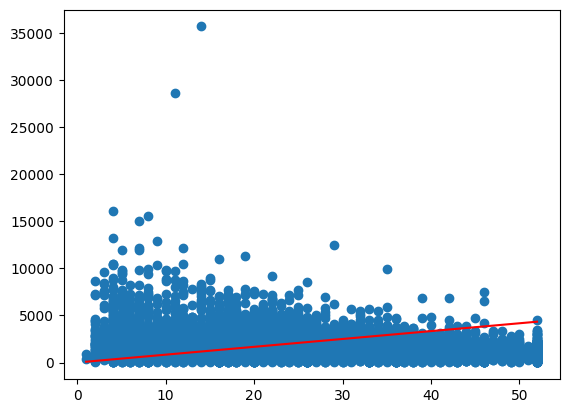

[[83.31616792]
 [ 0.09705299]]
486019.0


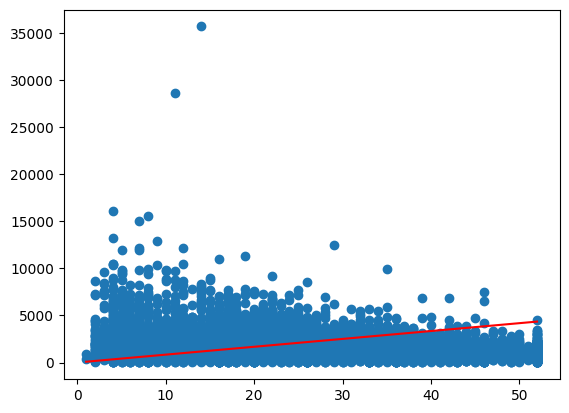

[[83.53986655]
 [ 0.09705345]]
486019.0


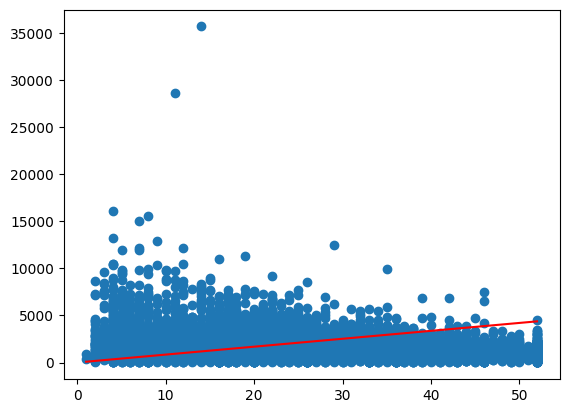

[[84.04377586]
 [ 0.09705449]]
486019.0


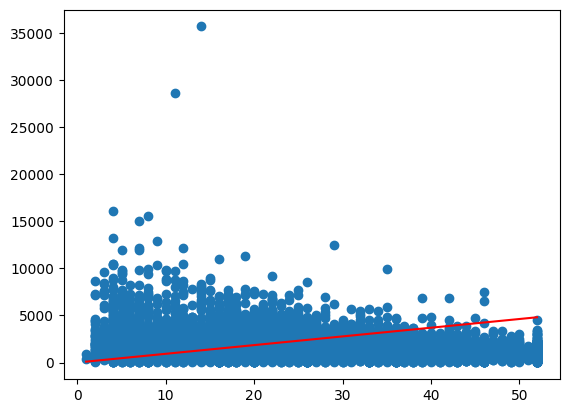

[[92.37290288]
 [ 0.09707162]]
486019.0


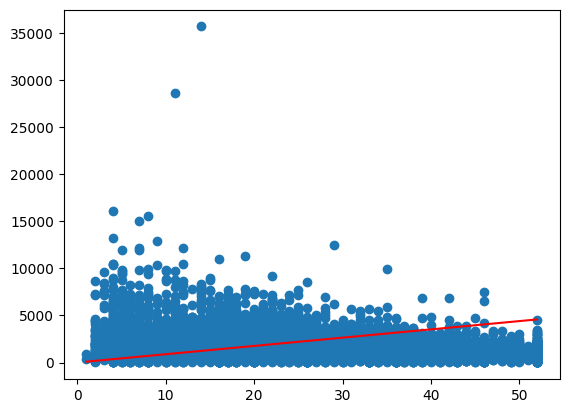

[[87.95148926]
 [ 0.09706253]]
486019.0


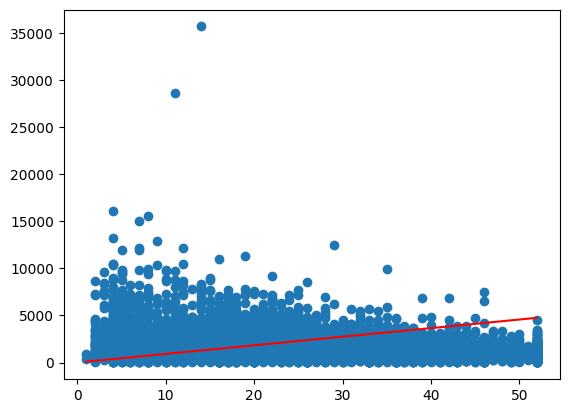

[[91.28465101]
 [ 0.09706938]]
486019.0


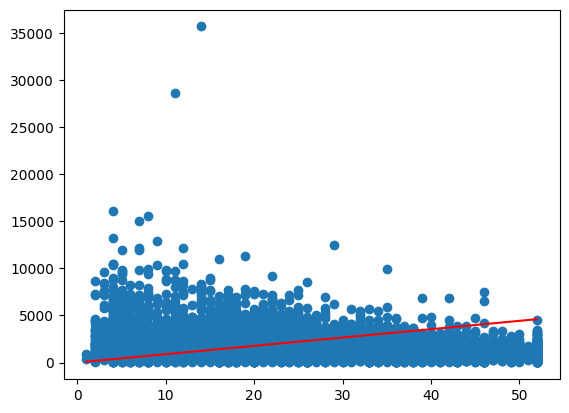

[[88.47549965]
 [ 0.0970636 ]]
486019.0


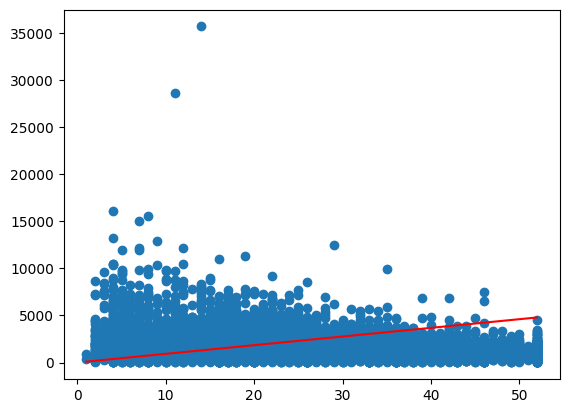

[[91.98946311]
 [ 0.09707083]]
486019.0


KeyboardInterrupt: 

In [ ]:
houdini(x,y, 5, 2, 0.00000001)

that def wasn't right

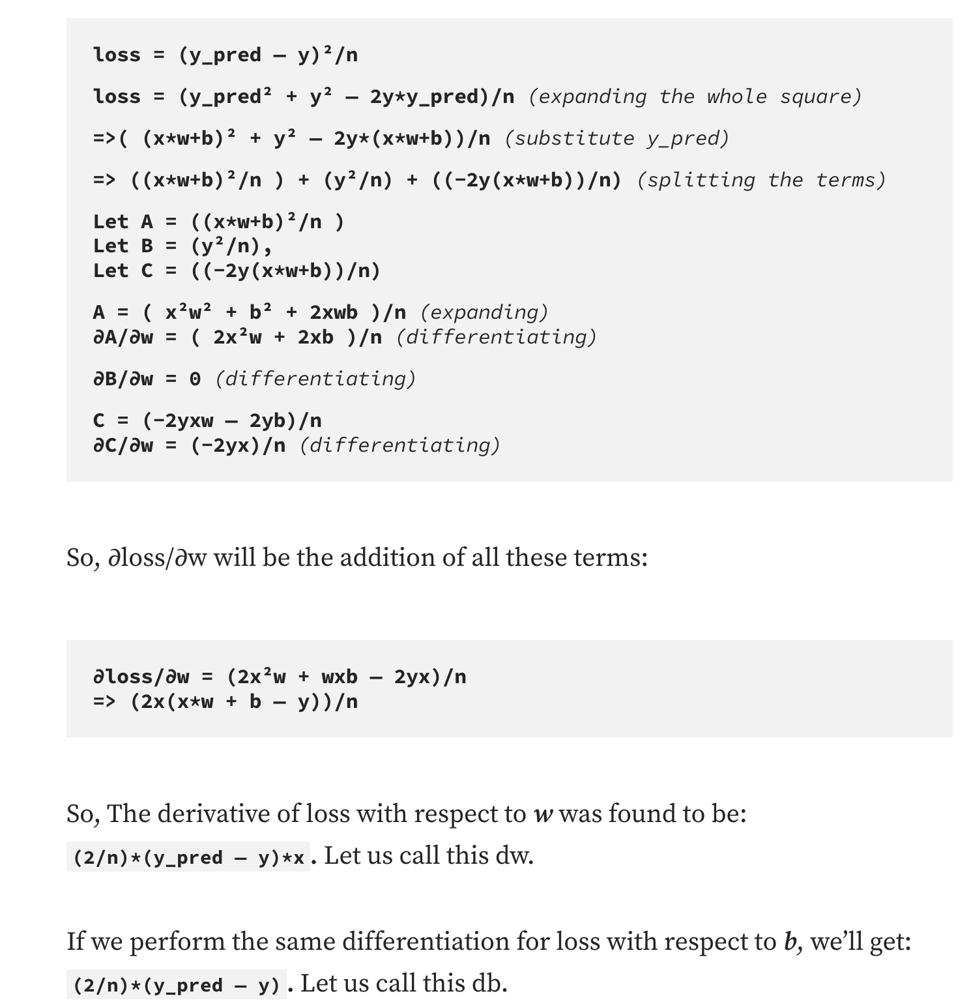

They expanded the whole square for some reason...

But the main thing I was doing wrong was differentiating with respect to the wrong variables...

In [ ]:
def houdini(xN,y, batch, epoch, learningRate, existingWeights0 = 0, existingWeights1 = 0):
  if existingWeights0 and existingWeights1 == 0:
    weights = np.random.rand(2,1)
  else:
    weights = np.random.rand(2,1)
    weights[0] = existingWeights0
    weights[1] = existingWeights1
    print(weights)
  x = np.hstack((xN, np.ones((xN.shape[0], 1))))


  for cantUseX in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch+batch > len(x):
        yhat = np.dot(x[batchCount*batch: len(x),:],weights)
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[1] = weights[1] - learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
      else:
        # print(x[batchCount*batch:batchCount*batch+batch, : ])
        # print(weights)
        yhat = np.dot(x[batchCount*batch:batchCount*batch+batch, : ],weights)
        # print(yhat)
        # print("RMS: ", sum((y[batchCount*batch: batchCount*batch+batch,:] - yhat) ** 2)[0])
        # print(2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))
        weights[0] = weights[0] + learningRate * (((2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat)) * sum(x[batchCount*batch:batchCount*batch+batch, 0]))/batch)
        weights[1] = weights[1] + learningRate * (2*sum(y[batchCount*batch: batchCount*batch+batch,:] - yhat))/batch
        print(sum(x[batchCount*batch:batchCount*batch+batch, 0]))



      # plt.scatter(xN,y)
      # plt.plot([min(xN), max(xN)], [weights[0] * min(xN) + weights[1], weights[0] * max(xN) + weights[1]], 'k-', color = 'r')
      # plt.show()
      print(weights)

  return weights

In [ ]:
weights = houdini(x,y, 100, 1000, 0.00001, 1.5820032, 5000.20032)

Streaming output truncated to the last 5000 lines.
[[ -7787.75513318]
 [173900.60076314]]
2428.0
[[ -6987.20886763]
 [173900.93047741]]
2603.0
[[ -6506.82020181]
 [173901.11502934]]
2099.0
[[ -8025.53607695]
 [173900.39148676]]
2112.0
[[ -8165.78299519]
 [173900.32508197]]
2231.0
[[ -7741.5238298 ]
 [173900.51524744]]
2713.0
[[ -5710.9336046 ]
 [173901.26371417]]
2704.0
[[ -6687.164081  ]
 [173900.90268219]]
2569.0
[[ -6727.09648554]
 [173900.88713824]]
2087.0
[[ -8057.0549118 ]
 [173900.24987977]]
2599.0
[[ -6143.77313409]
 [173900.98604051]]
2747.0
[[ -6346.92356599]
 [173900.91208695]]
3249.0
[[ -4171.36752669]
 [173901.58169484]]
3611.0
[[ -5760.18949379]
 [173901.14169984]]
2833.0
[[ -6290.12896328]
 [173900.95464037]]
2403.0
[[ -7316.05692355]
 [173900.52770406]]
2470.0
[[ -6899.80569115]
 [173900.69622682]]
2332.0
[[ -7431.00625818]
 [173900.46843927]]
2023.0
[[ -8300.26879788]
 [173900.03874944]]
2567.0
[[ -6207.30686694]
 [173900.85408326]]
2240.0
[[ -7672.46310276]
 [173900.1

KeyboardInterrupt: 

##A little Better

In [ ]:
import numpy as np
x = np.transpose(np.array([df["housing_median_age"]]),(1,0))
y = np.transpose(np.array([df["population"]]),(1,0))

array([[1.],
       [1.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [ ]:
xPadded

array([[15.,  1.],
       [19.,  1.],
       [17.,  1.],
       ...,
       [17.,  1.],
       [19.,  1.],
       [52.,  1.]])

In [ ]:
weights

array([-112.75817838, 4996.00632566])

In [ ]:
import time
# def rms(x, y)

def houdini_v2(x, y, epoch, batch, lr, slope = "not loaded", intercept = "not loaded"):

  #Loading preset weights or setting random ones.
  if slope == "not loaded" or intercept == "not loaded":
    weights = np.random.rand(2,1)
  else:
    weights = np.array([[slope], [intercept]])

  print(f"Your initial weights are, slope: {weights[0][0]}, y-intercept: {weights[1][0]}")

  #Padding x for dot products
  xPadded = np.hstack((x, np.ones((len(x),1))))

  #Looping through the dataset for each epoch and batch.
  for epochCount in range(epoch):


    batchCount = 0
    while batchCount*batch + batch < len(x):
      difference = y[batchCount*batch:batchCount*batch + batch] - np.dot(xPadded[batchCount*batch:batchCount*batch + batch, :], weights)
      rms = sum(difference ** 2)/batch
      slopeUpdate = sum(difference * x[batchCount*batch:batchCount*batch + batch] * 2)/batch
      interceptUpdate = sum(difference * 2)/batch

      weights[0] = weights[0] + lr * slopeUpdate
      weights[1] = weights[1] + lr * interceptUpdate

      batchCount += 1
    print("break")
    difference = y[batchCount*batch:len(y)] - np.dot(xPadded[batchCount*batch: len(x), :], weights)
    slopeUpdate = sum(difference * x[batchCount*batch: len(x)] * 2)/(len(y)-batchCount*batch)
    interceptUpdate = sum(difference * 2)/(len(y)-batchCount*batch)
    rms = sum(difference ** 2)/(len(y)-batchCount*batch)

    weights[0] = weights[0] + lr * slopeUpdate
    weights[1] = weights[1] + lr * interceptUpdate


    plt.scatter(x,y)
    plt.plot([min(x), max(x)], [weights[0] * min(x) + weights[1], weights[0] * max(x) + weights[1]], 'k-', color = 'r')
    plt.show()

    print(f"Epoch {epochCount} Complete. \n")
    print(f"Stats \nslope: {weights[0][0]} \ny-intercept: {weights[1][0]}\n")
    time.sleep(1)

In [ ]:
x[-10:,:]

array([[28.],
       [11.],
       [52.],
       [52.],
       [32.],
       [52.],
       [36.],
       [17.],
       [19.],
       [52.]])

In [ ]:
y[-10:]

array([[1530.],
       [1343.],
       [ 544.],
       [1152.],
       [ 434.],
       [ 907.],
       [1194.],
       [1244.],
       [1298.],
       [ 806.]])

Your initial weights are, slope: 0.5236515229091825, y-intercept: 0.9872910447609394
break


<ipython-input-162-5186baa4db14>:42: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot([min(x), max(x)], [weights[0] * min(x) + weights[1], weights[0] * max(x) + weights[1]], 'k-', color = 'r')


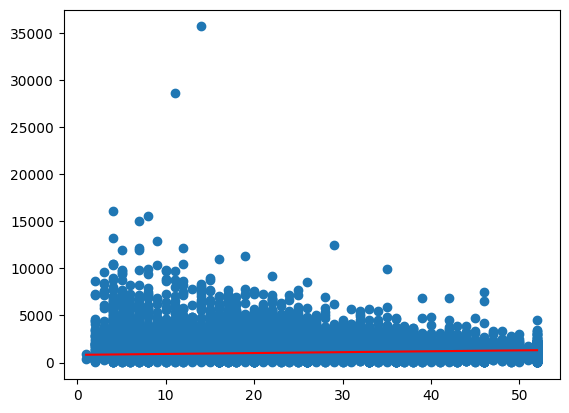

Epoch 0 Complete. 

Stats 
slope: 9.450624398410648 
y-intercept: 815.4526414674846

break


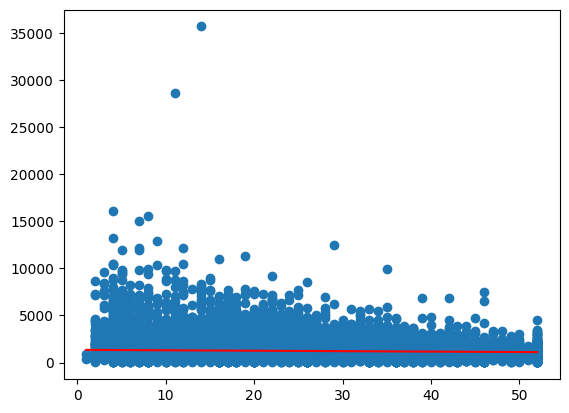

Epoch 1 Complete. 

Stats 
slope: -4.672304480670277 
y-intercept: 1345.9412635452763

break


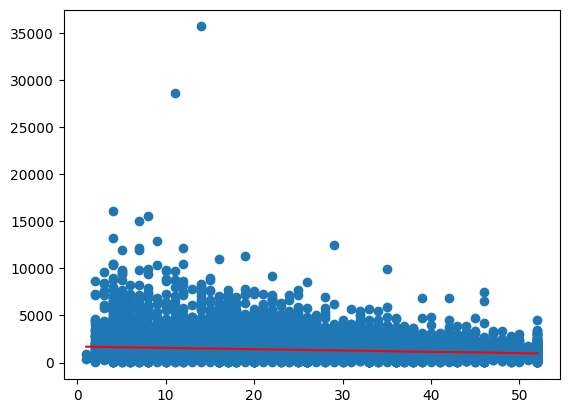

Epoch 2 Complete. 

Stats 
slope: -13.88316164421605 
y-intercept: 1691.9215461538183

break


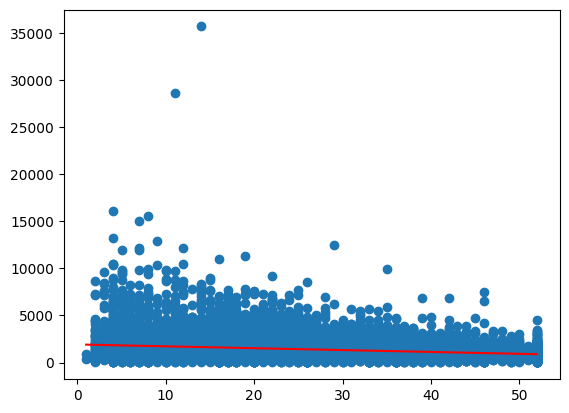

Epoch 3 Complete. 

Stats 
slope: -19.890406346333886 
y-intercept: 1917.567018972909

break


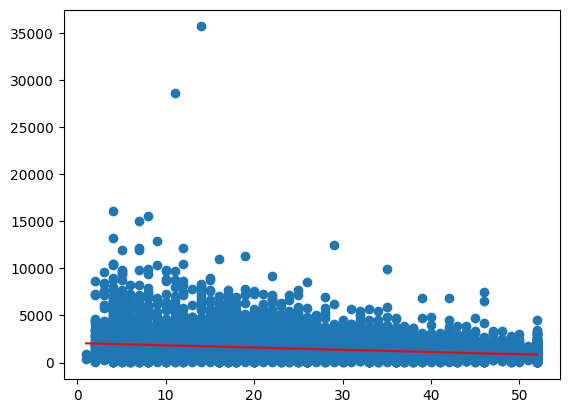

Epoch 4 Complete. 

Stats 
slope: -23.808281552774538 
y-intercept: 2064.731126186957

break


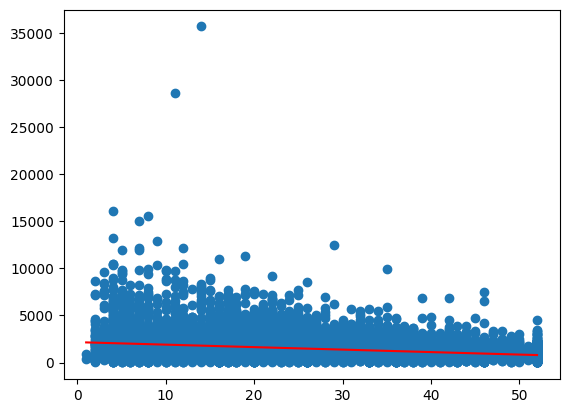

Epoch 5 Complete. 

Stats 
slope: -26.363487290911074 
y-intercept: 2160.7103372100414

break


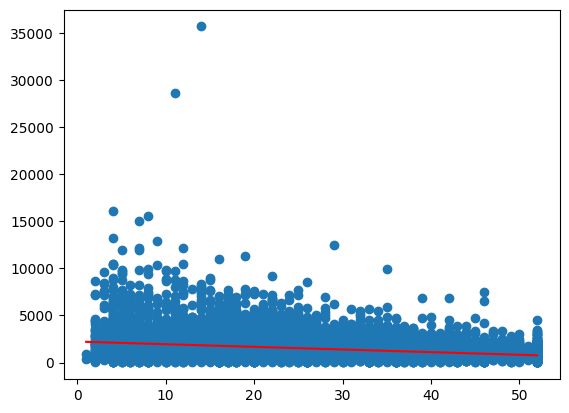

Epoch 6 Complete. 

Stats 
slope: -28.029971295678134 
y-intercept: 2223.3071831598236

break


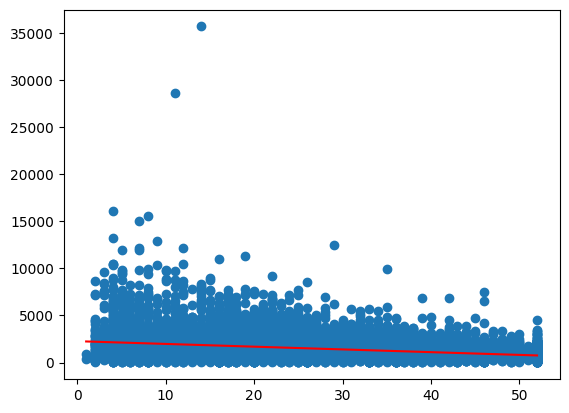

Epoch 7 Complete. 

Stats 
slope: -29.116838351701656 
y-intercept: 2264.1323272831287

break


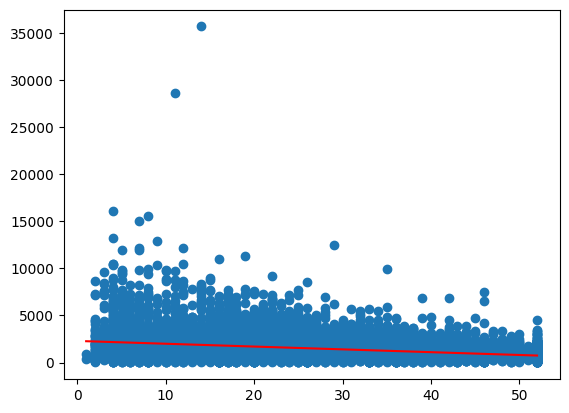

Epoch 8 Complete. 

Stats 
slope: -29.82568403764313 
y-intercept: 2290.7581479199416

break


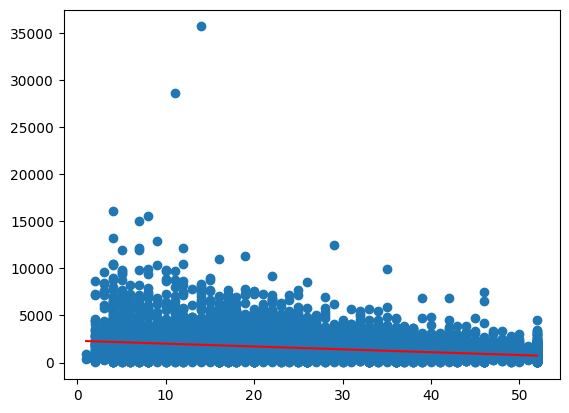

Epoch 9 Complete. 

Stats 
slope: -30.28798731907323 
y-intercept: 2308.123287463423



In [ ]:
houdini_v2(x, y, 10, 5, 0.0005)

#Final Version HoudiniV3!

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Basically the objective is to make the code less abstract and make it more organized + better documented
def yhat(xPadded, weights, start, end):
  return np.dot(xPadded[start:end, :], weights)

def rmsFunc(yTrue, yHat, n):
  return sum((yTrue - yHat) ** 2)/n

def houdini_v3(x, y, epoch, batch, lr, graphEpoch = 1, slope = "not loaded", intercept = "not loaded"):

  #Loading preset weights or setting random ones.
  if slope == "not loaded" or intercept == "not loaded":
    weights = np.random.rand(2,1)
  else:
    weights = np.array([[slope], [intercept]])

  print(f"Your initial weights are, slope: {weights[0][0]}, y-intercept: {weights[1][0]}")

  #Padding x for dot products
  xPadded = np.hstack((x, np.ones((len(x),1))))

  #Looping through the dataset for each epoch and batch.
  for epochCount in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      #Edge Cases
      if batchCount*batch + batch < len(x):
        end = batchCount*batch + batch
      else:
        end = len(x)

      start = batchCount*batch

      #Calculating RMS and gradient updating values
      rms = rmsFunc(y[start:end], yhat(xPadded, weights, start, end), (end-start))
      slopeUpdate = sum((y[start:end]-yhat(xPadded, weights, start, end)) * x[start:end] * 2)/(end-start)
      interceptUpdate = sum((y[start:end]-yhat(xPadded, weights, start, end)) * 2)/(end-start)

      #Updating the weights
      weights[0] = weights[0] + lr * slopeUpdate
      weights[1] = weights[1] + lr * interceptUpdate

    #Displaying epoch progress + graph
    if epochCount % graphEpoch == 0:
      start, end =  0, len(x)
      print("RMS is: ",rmsFunc(y[start:end], yhat(xPadded, weights, start, end), (end-start)))
      print(f"Epoch {epochCount} Complete. \n")
      print(f"Stats \nslope: {weights[0][0]} \ny-intercept: {weights[1][0]}\n")
      plt.scatter(x,y)
      plt.plot([min(x), max(x)], [weights[0] * min(x) + weights[1], weights[0] * max(x) + weights[1]], color = 'r')
      plt.show()

Your initial weights are, slope: 0.4835327340274339, y-intercept: 0.8737625604506023
RMS is:  [1.73804663]
Epoch 0 Complete. 

Stats 
slope: 0.08293105207304946 
y-intercept: 0.8539502281522516



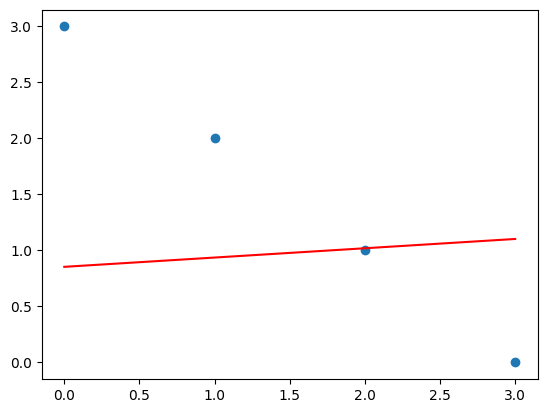

RMS is:  [0.50363036]
Epoch 10 Complete. 

Stats 
slope: -0.44807123697140744 
y-intercept: 1.8216091254830307



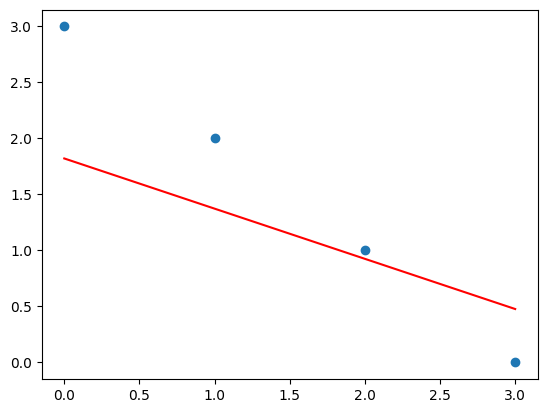

RMS is:  [0.14770772]
Epoch 20 Complete. 

Stats 
slope: -0.7010981027614899 
y-intercept: 2.3618320112954154



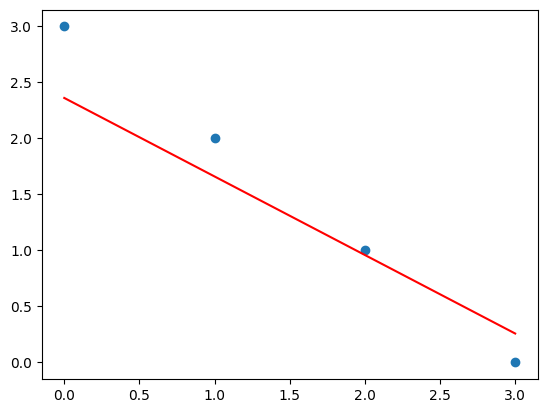

RMS is:  [0.0433206]
Epoch 30 Complete. 

Stats 
slope: -0.838127036916013 
y-intercept: 2.654394487852551



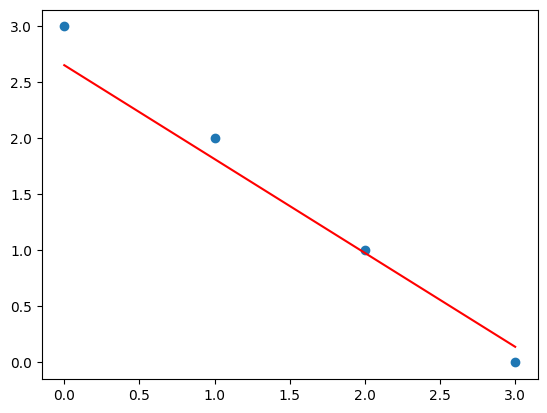

RMS is:  [0.01270532]
Epoch 40 Complete. 

Stats 
slope: -0.9123362667829399 
y-intercept: 2.8128342816612313



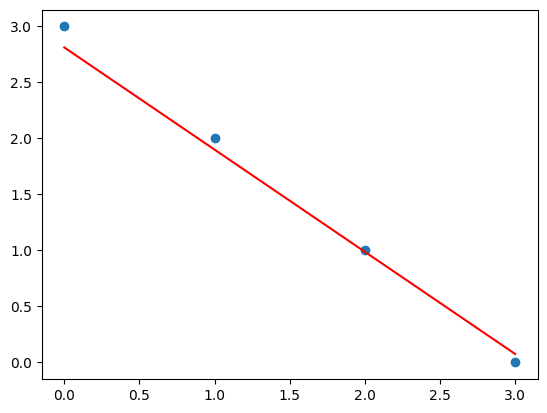

RMS is:  [0.00372629]
Epoch 50 Complete. 

Stats 
slope: -0.9525249308152554 
y-intercept: 2.8986387517270797



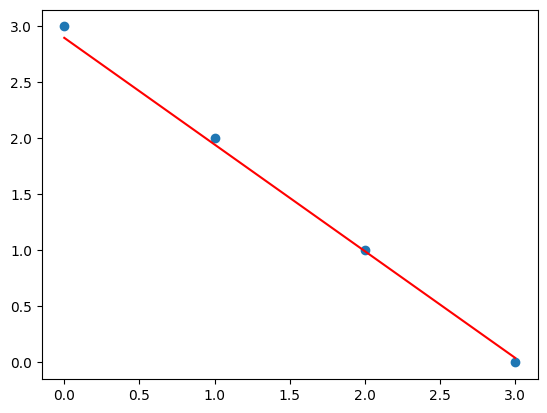

RMS is:  [0.00109287]
Epoch 60 Complete. 

Stats 
slope: -0.9742894568667801 
y-intercept: 2.9451069205267144



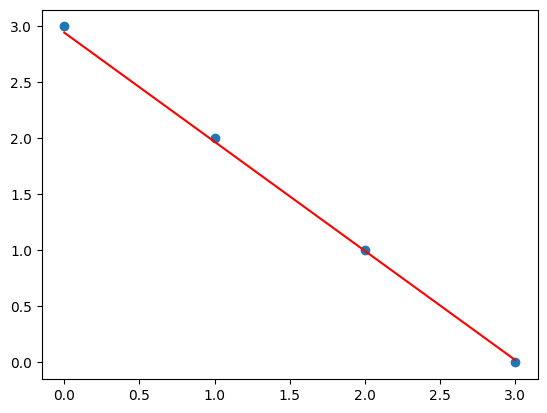

RMS is:  [0.00032052]
Epoch 70 Complete. 

Stats 
slope: -0.9860762282276452 
y-intercept: 2.9702721678609656



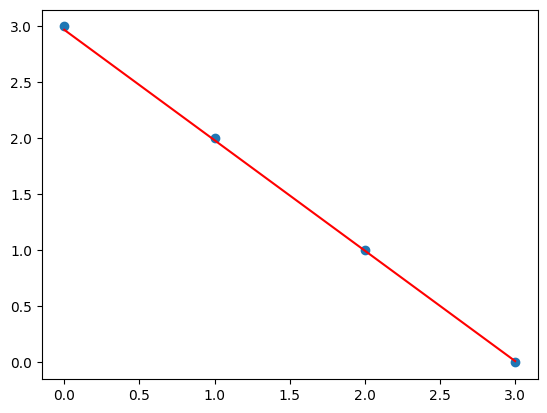

RMS is:  [9.40049947e-05]
Epoch 80 Complete. 

Stats 
slope: -0.9924594583877874 
y-intercept: 2.9839006298759987



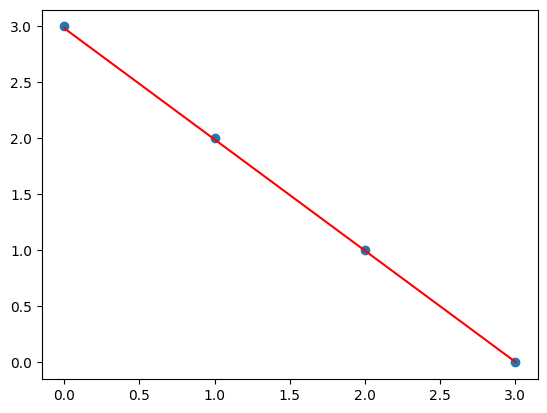

RMS is:  [2.75703462e-05]
Epoch 90 Complete. 

Stats 
slope: -0.995916353073353 
y-intercept: 2.9912812438802336



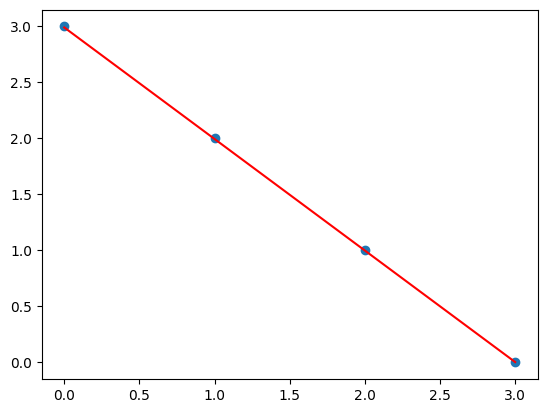

In [ ]:
houdini_v3(np.array([[0],[1],[2],[3]]), np.array([[3],[2],[1],[0]]), 100, 500, 0.1, 10)

In [ ]:
x = np.random.uniform(low=0.5, high=13.3, size=(50,))
y = np.random.uniform(low=0.5, high=13.3, size=(50,))

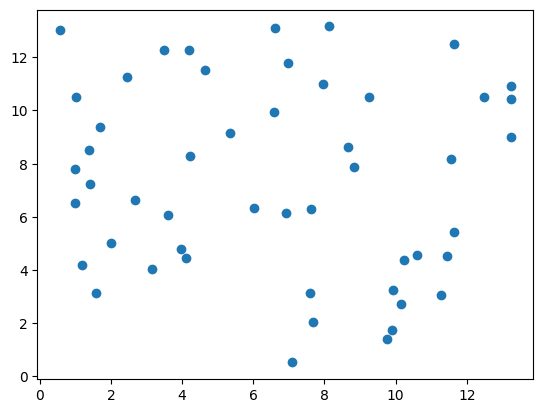

In [ ]:
plt.scatter(x,y)
plt.show()

In [ ]:
x = np.transpose([x],(1,0))
y = np.transpose([y],(1,0))

Your initial weights are, slope: 0.8462966293413233, y-intercept: 0.33124592021493304
RMS is:  [26.93731398]
Epoch 0 Complete. 

Stats 
slope: 0.7581840398087297 
y-intercept: 0.36032152157450037



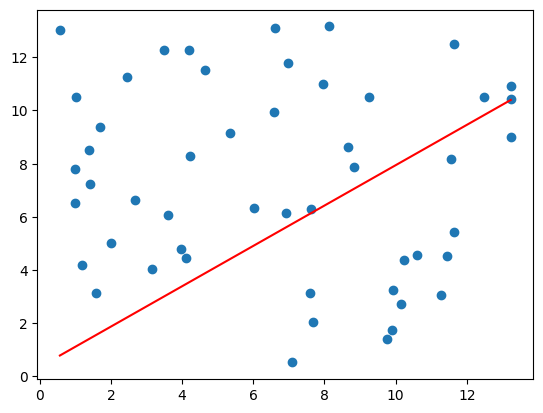

RMS is:  [21.09614542]
Epoch 50 Complete. 

Stats 
slope: 0.5812129108378871 
y-intercept: 2.056014767155447



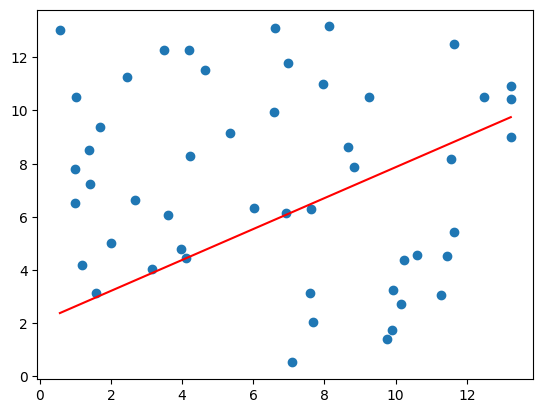

RMS is:  [17.60293118]
Epoch 100 Complete. 

Stats 
slope: 0.4336144984325147 
y-intercept: 3.367422963929969



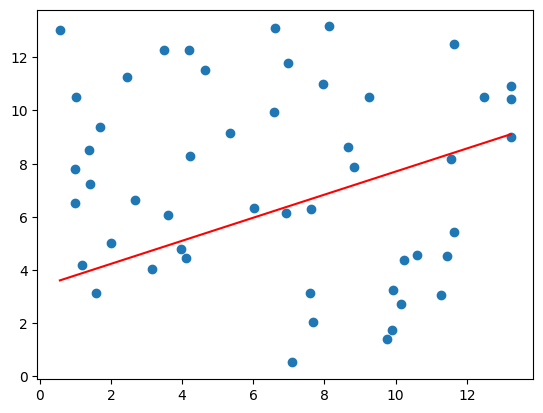

RMS is:  [15.50979787]
Epoch 150 Complete. 

Stats 
slope: 0.3193615225777442 
y-intercept: 4.382557792279749



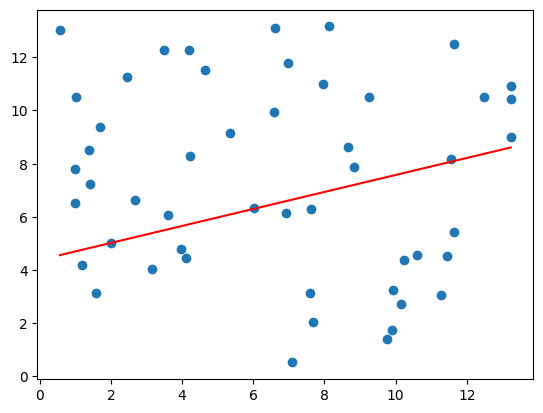

RMS is:  [14.25559278]
Epoch 200 Complete. 

Stats 
slope: 0.23092058152060554 
y-intercept: 5.168353338062749



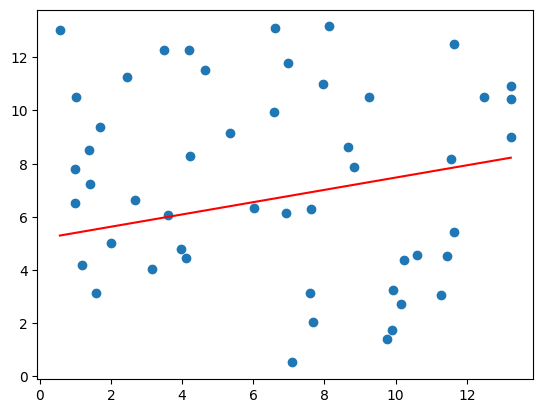

RMS is:  [13.50407333]
Epoch 250 Complete. 

Stats 
slope: 0.1624602197965078 
y-intercept: 5.776621936999676



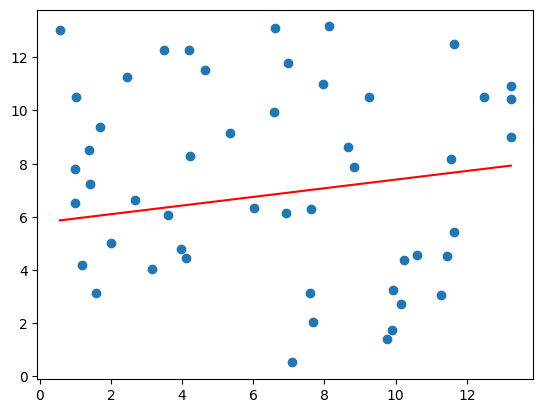

RMS is:  [13.05376301]
Epoch 300 Complete. 

Stats 
slope: 0.10946642448663702 
y-intercept: 6.247470480794895



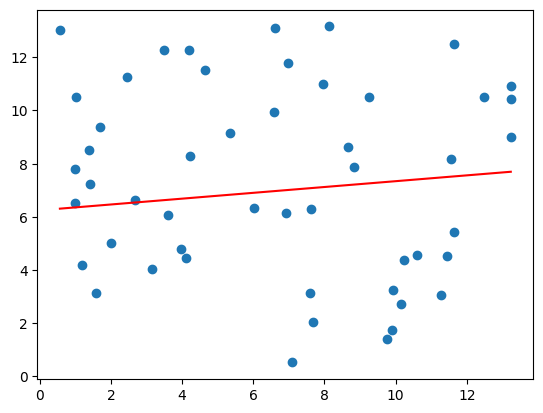

RMS is:  [12.78393715]
Epoch 350 Complete. 

Stats 
slope: 0.06844498856927549 
y-intercept: 6.61194491130395



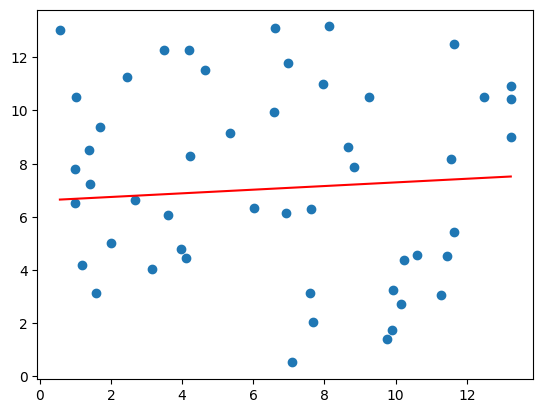

RMS is:  [12.62225755]
Epoch 400 Complete. 

Stats 
slope: 0.03669111634928031 
y-intercept: 6.894077270521092



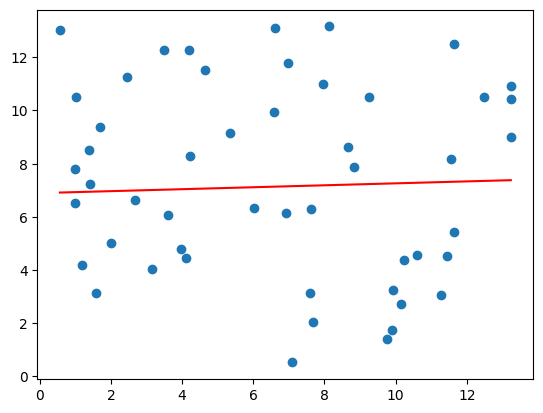

RMS is:  [12.52537916]
Epoch 450 Complete. 

Stats 
slope: 0.012111079633963044 
y-intercept: 7.11247028098895



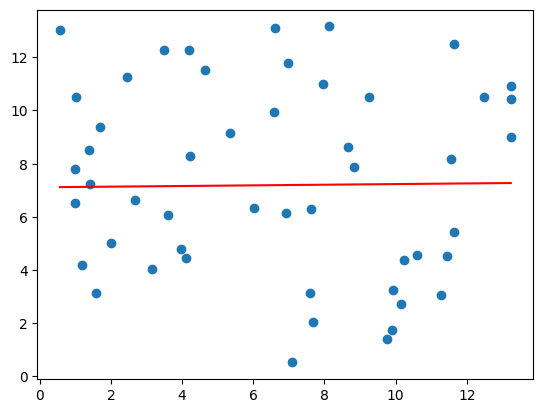

RMS is:  [12.46732965]
Epoch 500 Complete. 

Stats 
slope: -0.006915834650395943 
y-intercept: 7.281523937767487



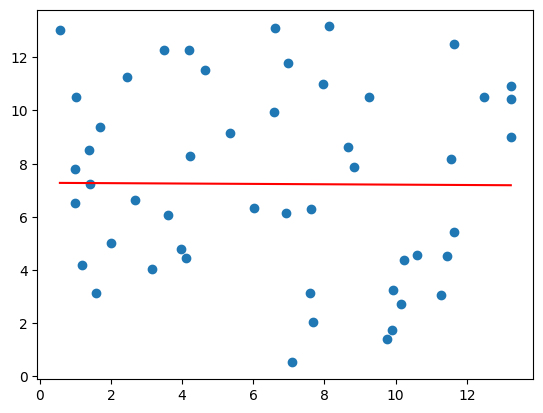

RMS is:  [12.4325464]
Epoch 550 Complete. 

Stats 
slope: -0.021644188044544883 
y-intercept: 7.412384988718572



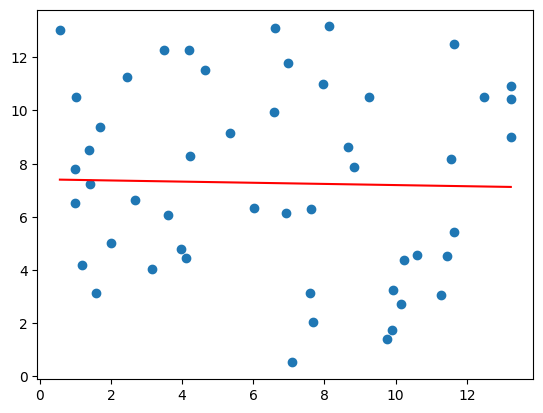

RMS is:  [12.41170427]
Epoch 600 Complete. 

Stats 
slope: -0.03304511151857639 
y-intercept: 7.513681908183946



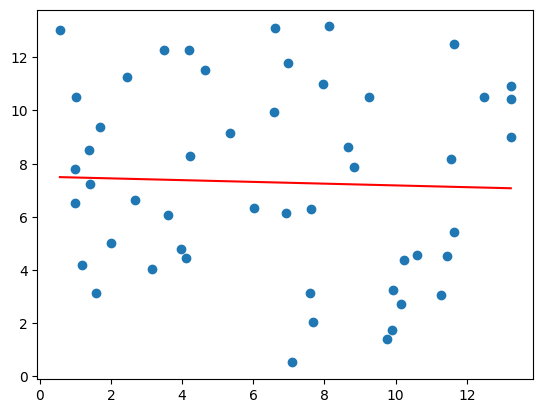

RMS is:  [12.39921568]
Epoch 650 Complete. 

Stats 
slope: -0.041870338112634624 
y-intercept: 7.59209382539383



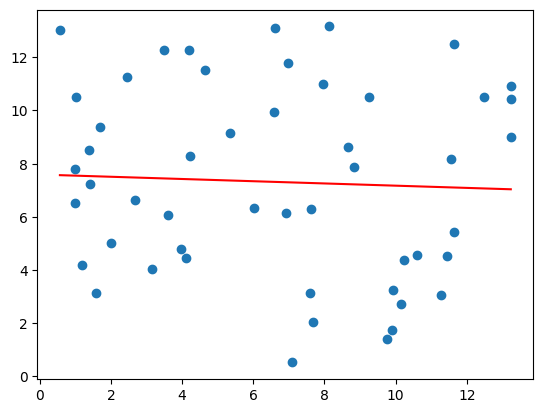

RMS is:  [12.39173252]
Epoch 700 Complete. 

Stats 
slope: -0.048701769322033864 
y-intercept: 7.652790920557039



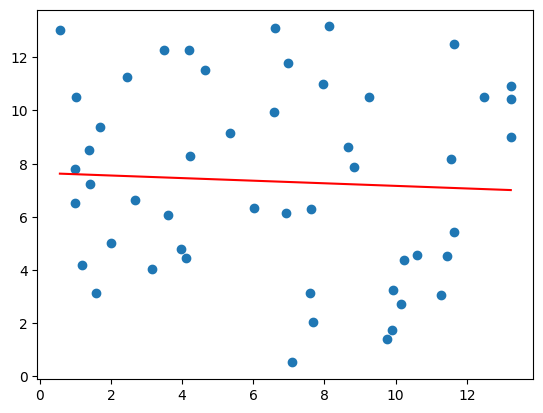

RMS is:  [12.38724861]
Epoch 750 Complete. 

Stats 
slope: -0.053989843443572126 
y-intercept: 7.699775326656817



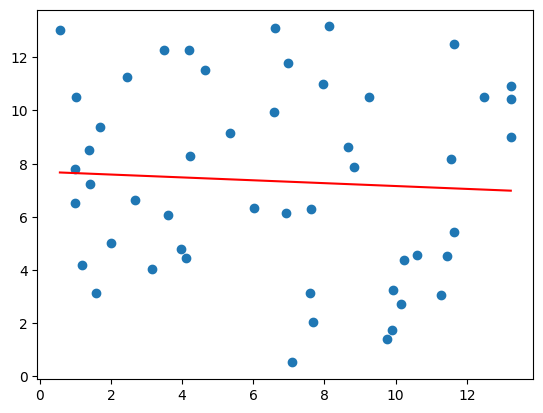

RMS is:  [12.38456185]
Epoch 800 Complete. 

Stats 
slope: -0.05808323574420856 
y-intercept: 7.736145014705527



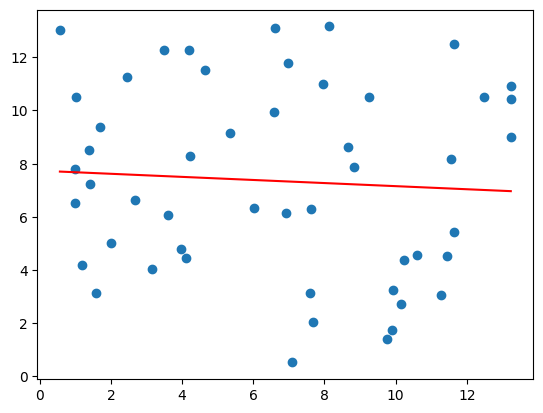

RMS is:  [12.38295194]
Epoch 850 Complete. 

Stats 
slope: -0.06125184876698483 
y-intercept: 7.764298062036842



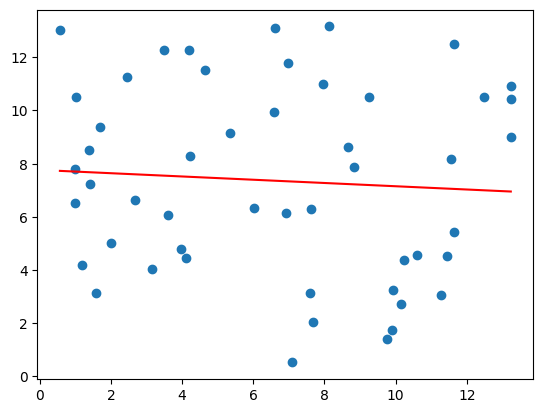

RMS is:  [12.38198729]
Epoch 900 Complete. 

Stats 
slope: -0.06370460866652951 
y-intercept: 7.786090772300883



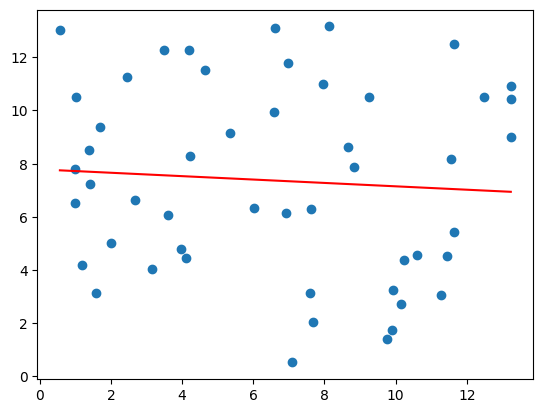

RMS is:  [12.38140927]
Epoch 950 Complete. 

Stats 
slope: -0.06560324099606007 
y-intercept: 7.802960072986646



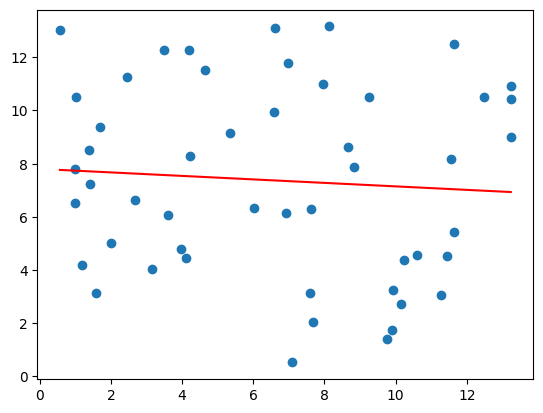

RMS is:  [12.38106292]
Epoch 1000 Complete. 

Stats 
slope: -0.06707293426828276 
y-intercept: 7.816018260893463



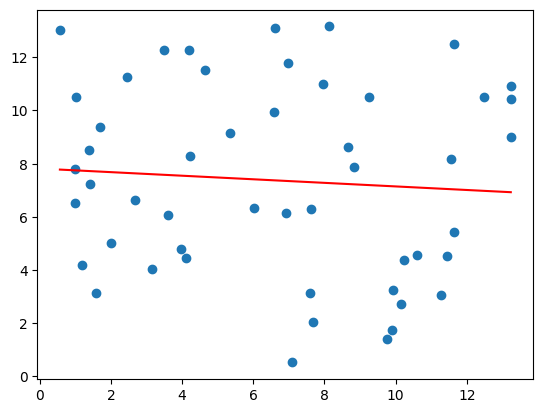

RMS is:  [12.38085538]
Epoch 1050 Complete. 

Stats 
slope: -0.06821059440438225 
y-intercept: 7.826126342703495



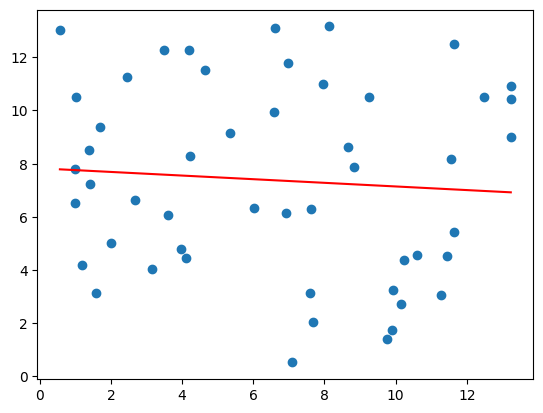

RMS is:  [12.38073103]
Epoch 1100 Complete. 

Stats 
slope: -0.0690912343377151 
y-intercept: 7.833950806450489



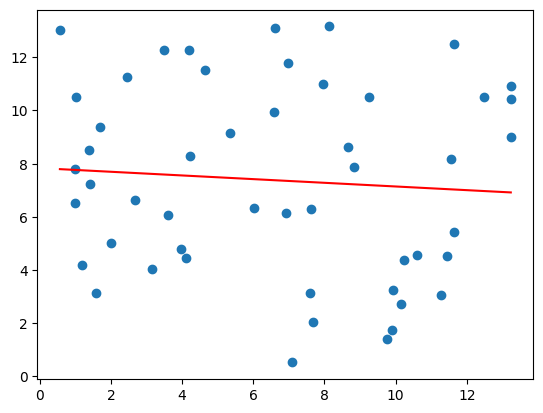

RMS is:  [12.38065652]
Epoch 1150 Complete. 

Stats 
slope: -0.0697729200780979 
y-intercept: 7.840007567177069



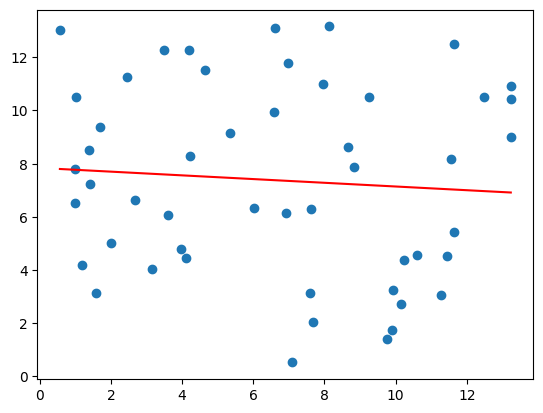

RMS is:  [12.38061187]
Epoch 1200 Complete. 

Stats 
slope: -0.07030059936114157 
y-intercept: 7.844695984388164



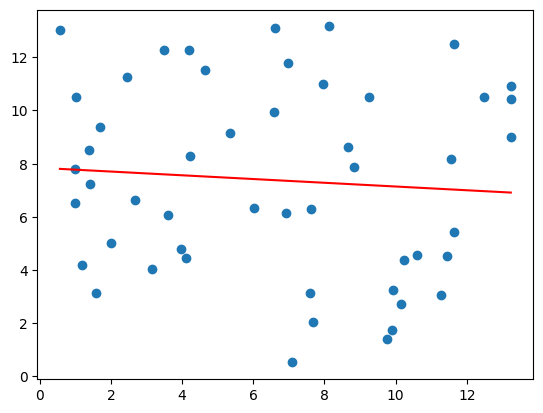

RMS is:  [12.38058512]
Epoch 1250 Complete. 

Stats 
slope: -0.07070906532904844 
y-intercept: 7.848325194280648



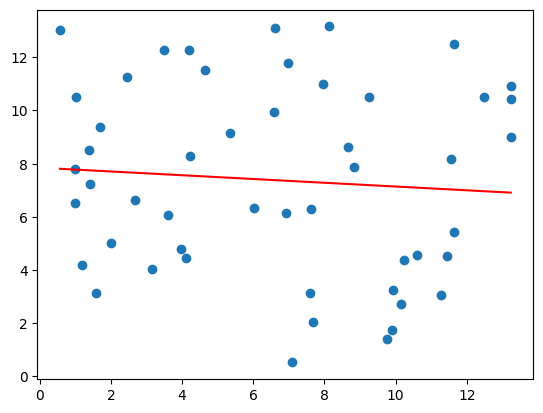

RMS is:  [12.38056909]
Epoch 1300 Complete. 

Stats 
slope: -0.07102525065657454 
y-intercept: 7.851134492995045



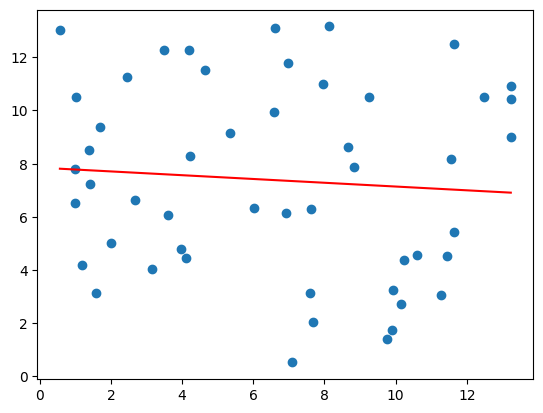

RMS is:  [12.38055948]
Epoch 1350 Complete. 

Stats 
slope: -0.07127000338800822 
y-intercept: 7.8533091148826



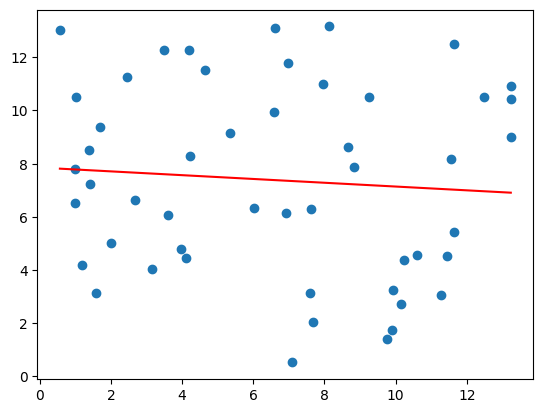

RMS is:  [12.38055372]
Epoch 1400 Complete. 

Stats 
slope: -0.07145946157701683 
y-intercept: 7.854992446145876



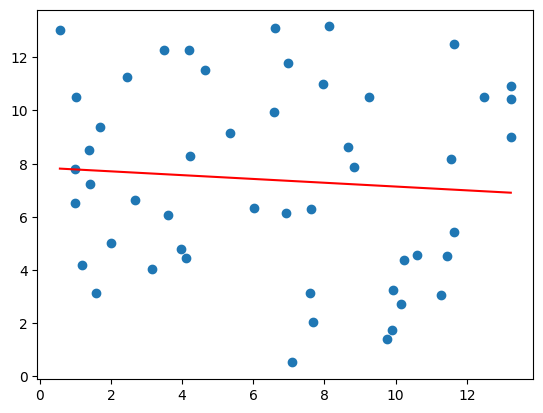

RMS is:  [12.38055028]
Epoch 1450 Complete. 

Stats 
slope: -0.07160611736783178 
y-intercept: 7.856295479173434



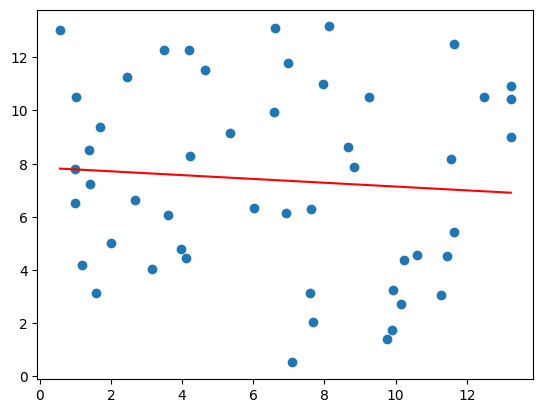

RMS is:  [12.38054821]
Epoch 1500 Complete. 

Stats 
slope: -0.0717196406791863 
y-intercept: 7.857304130950977



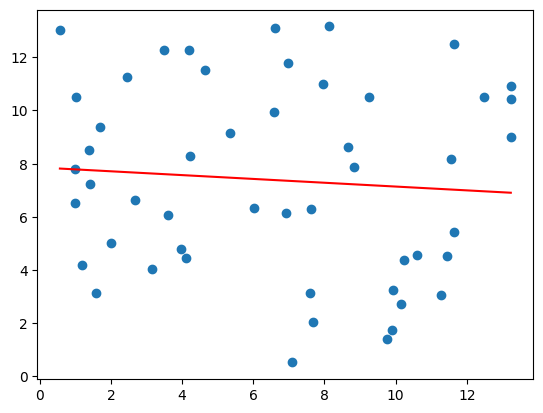

RMS is:  [12.38054697]
Epoch 1550 Complete. 

Stats 
slope: -0.07180751680156286 
y-intercept: 7.858084908096933



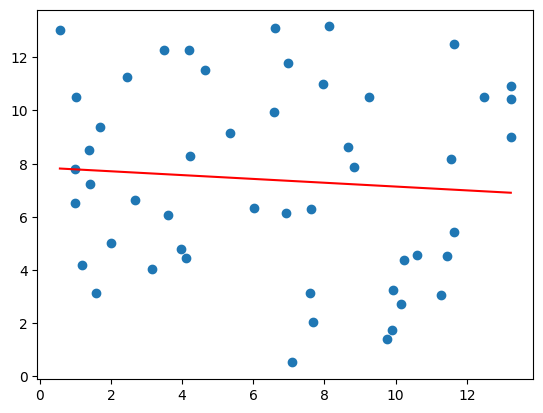

RMS is:  [12.38054623]
Epoch 1600 Complete. 

Stats 
slope: -0.07187553994845469 
y-intercept: 7.858689292053037



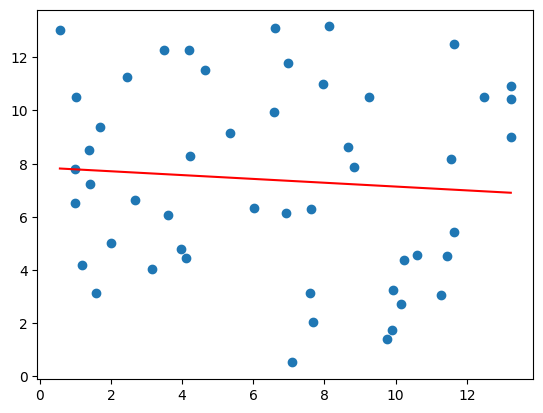

RMS is:  [12.38054578]
Epoch 1650 Complete. 

Stats 
slope: -0.07192819530451705 
y-intercept: 7.859157133572596



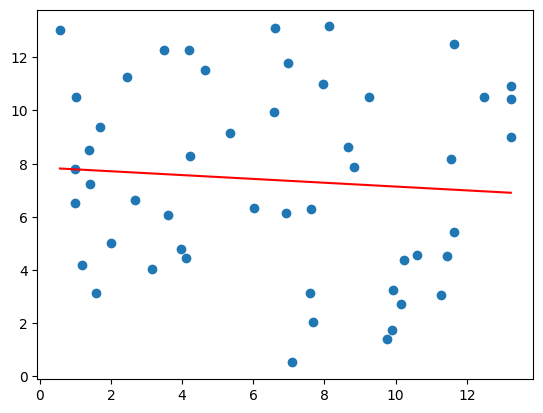

RMS is:  [12.38054552]
Epoch 1700 Complete. 

Stats 
slope: -0.07196895476138893 
y-intercept: 7.859519280325849



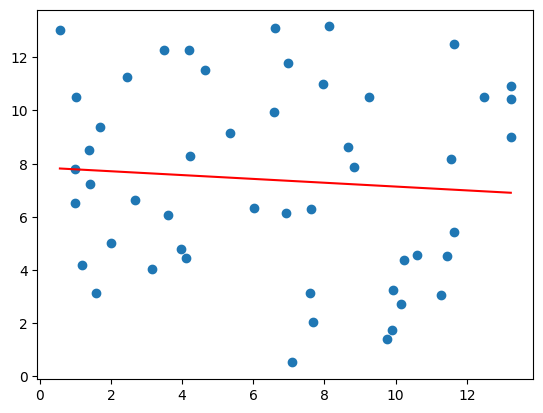

RMS is:  [12.38054536]
Epoch 1750 Complete. 

Stats 
slope: -0.07200050584087521 
y-intercept: 7.859799610876707



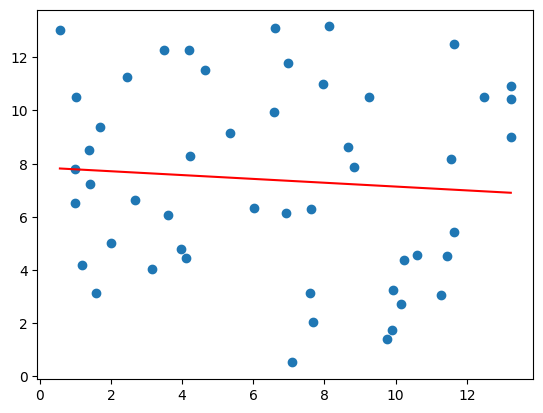

RMS is:  [12.38054526]
Epoch 1800 Complete. 

Stats 
slope: -0.07202492889979571 
y-intercept: 7.8600166091434005



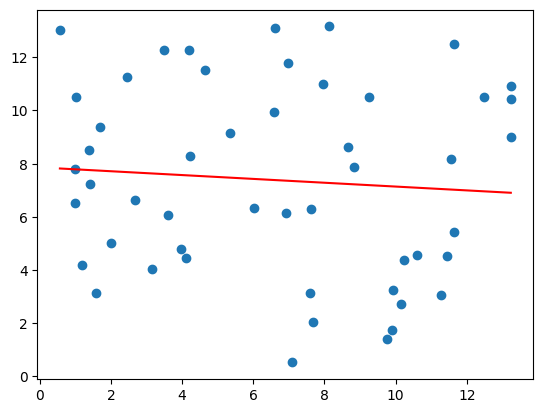

RMS is:  [12.38054521]
Epoch 1850 Complete. 

Stats 
slope: -0.07204383430071203 
y-intercept: 7.860184583156948



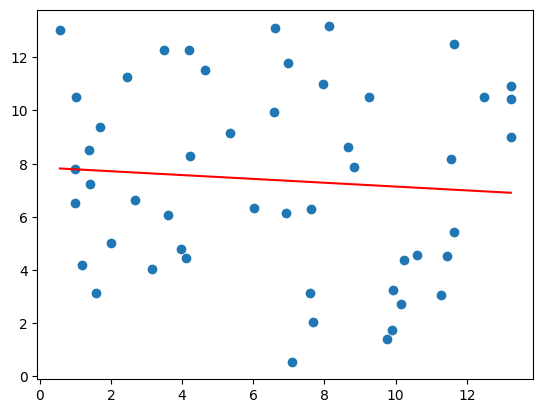

RMS is:  [12.38054517]
Epoch 1900 Complete. 

Stats 
slope: -0.07205846859304099 
y-intercept: 7.860314608477691



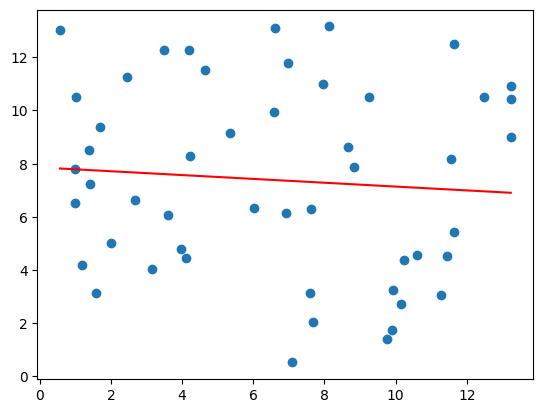

RMS is:  [12.38054515]
Epoch 1950 Complete. 

Stats 
slope: -0.07206979670572779 
y-intercept: 7.860415258475136



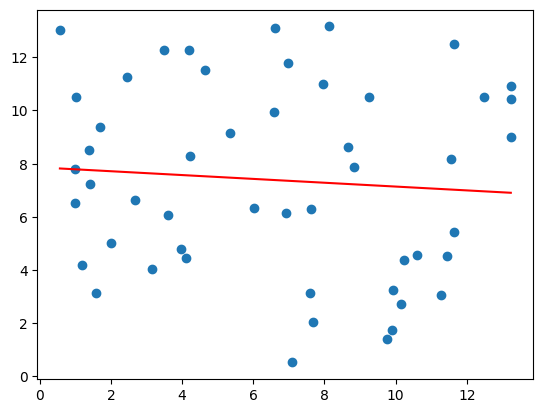

RMS is:  [12.38054514]
Epoch 2000 Complete. 

Stats 
slope: -0.07207856557094891 
y-intercept: 7.860493169622959



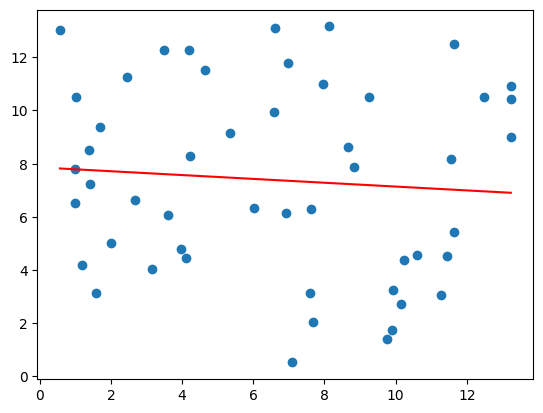

RMS is:  [12.38054513]
Epoch 2050 Complete. 

Stats 
slope: -0.07208535337394789 
y-intercept: 7.860553479082566



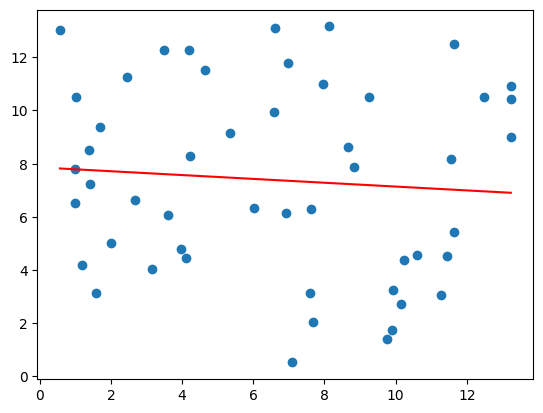

RMS is:  [12.38054513]
Epoch 2100 Complete. 

Stats 
slope: -0.07209060767634562 
y-intercept: 7.860600163427746



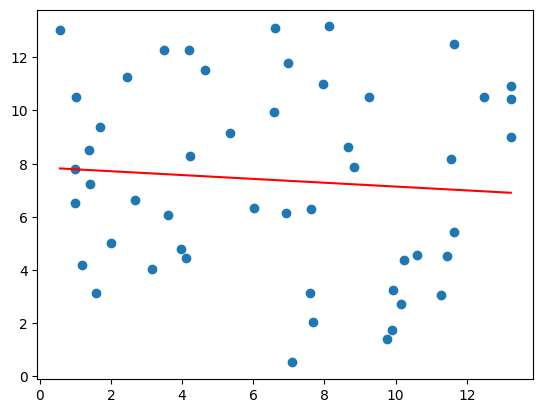

RMS is:  [12.38054512]
Epoch 2150 Complete. 

Stats 
slope: -0.07209467492663073 
y-intercept: 7.860636300844641



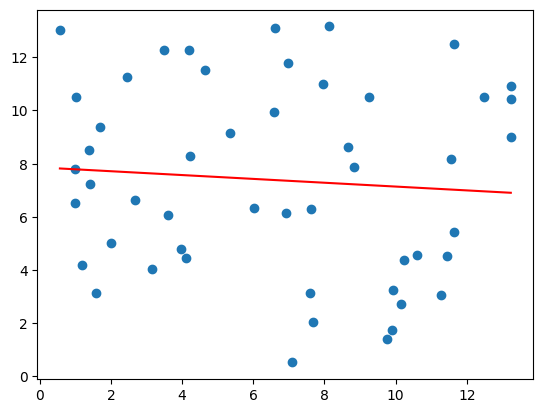

RMS is:  [12.38054512]
Epoch 2200 Complete. 

Stats 
slope: -0.07209782330364284 
y-intercept: 7.860664274095525



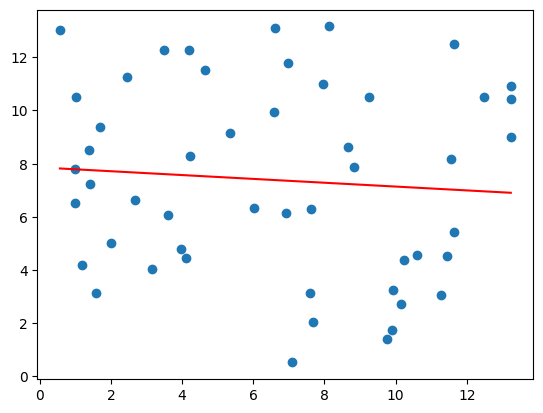

RMS is:  [12.38054512]
Epoch 2250 Complete. 

Stats 
slope: -0.07210026039925156 
y-intercept: 7.860685927628957



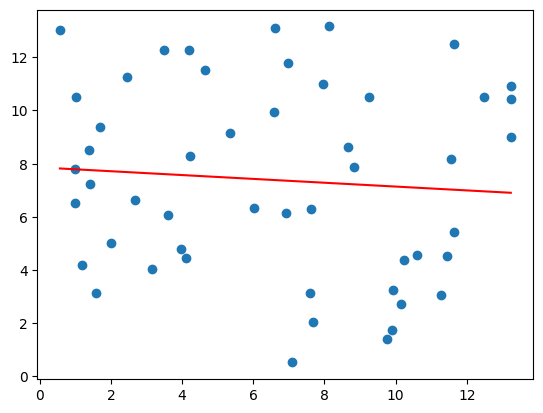

RMS is:  [12.38054512]
Epoch 2300 Complete. 

Stats 
slope: -0.07210214690616759 
y-intercept: 7.860702689195648



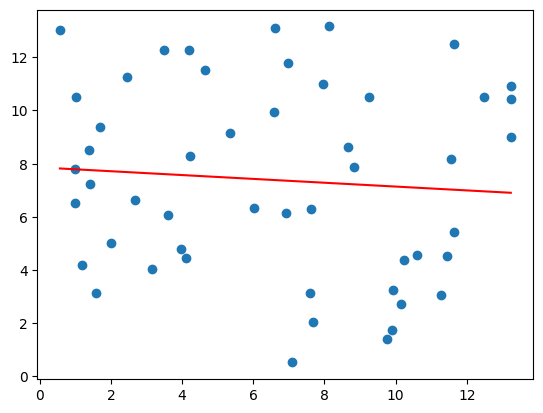

RMS is:  [12.38054512]
Epoch 2350 Complete. 

Stats 
slope: -0.07210360721339999 
y-intercept: 7.860715663988826



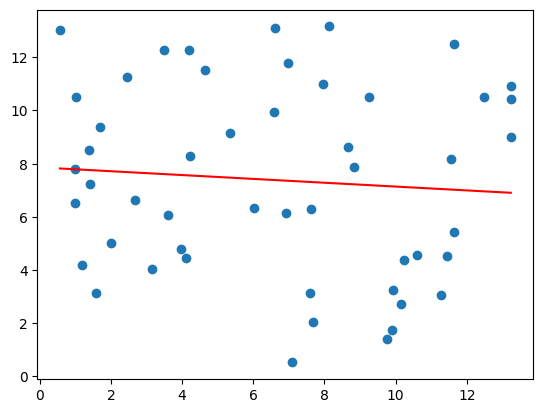

RMS is:  [12.38054512]
Epoch 2400 Complete. 

Stats 
slope: -0.07210473760799065 
y-intercept: 7.860725707516447



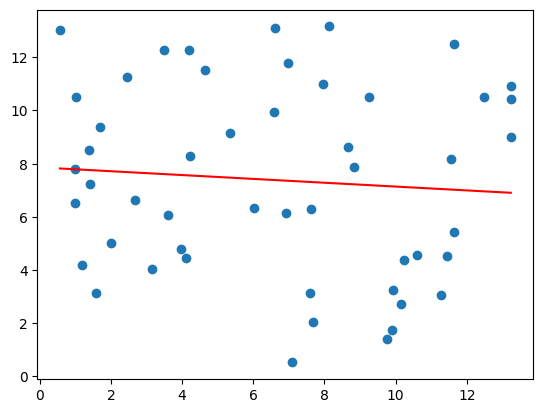

RMS is:  [12.38054512]
Epoch 2450 Complete. 

Stats 
slope: -0.07210561262381084 
y-intercept: 7.860733482010089



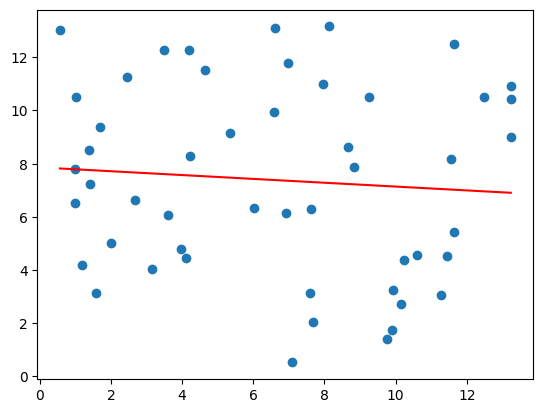

RMS is:  [12.38054512]
Epoch 2500 Complete. 

Stats 
slope: -0.0721062899560376 
y-intercept: 7.860739500089957



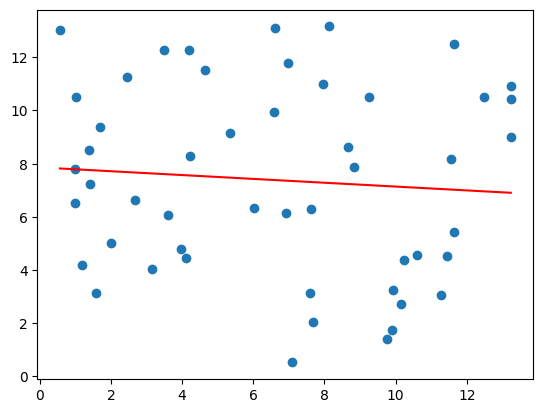

RMS is:  [12.38054512]
Epoch 2550 Complete. 

Stats 
slope: -0.07210681426535281 
y-intercept: 7.860744158565088



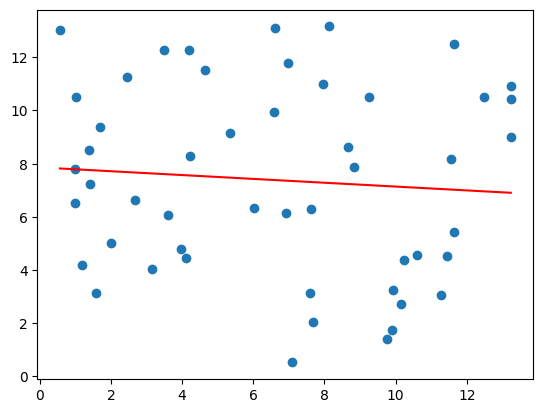

RMS is:  [12.38054512]
Epoch 2600 Complete. 

Stats 
slope: -0.07210722012269634 
y-intercept: 7.860747764597418



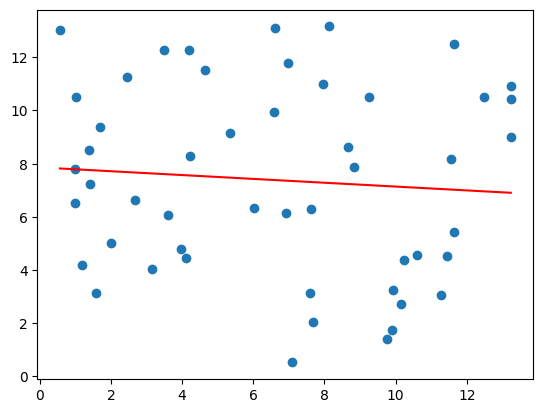

RMS is:  [12.38054512]
Epoch 2650 Complete. 

Stats 
slope: -0.0721075342887397 
y-intercept: 7.860750555954843



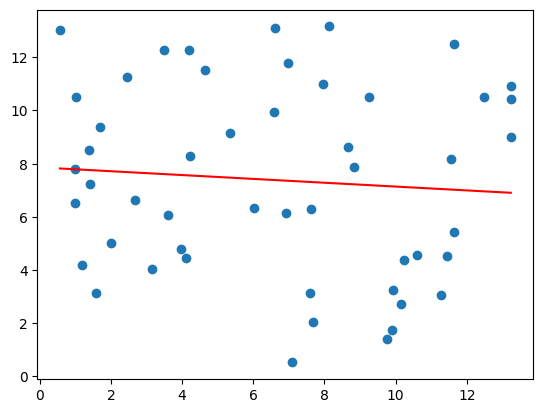

RMS is:  [12.38054512]
Epoch 2700 Complete. 

Stats 
slope: -0.07210777747838336 
y-intercept: 7.860752716688735



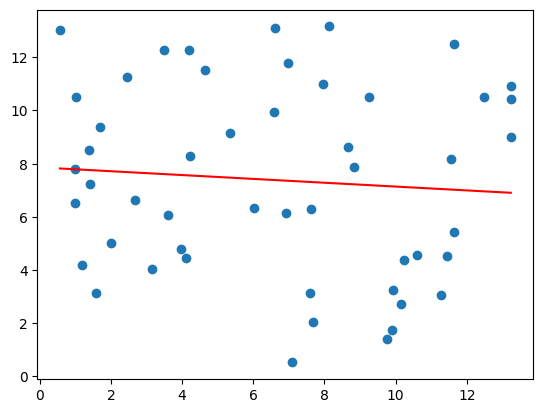

RMS is:  [12.38054512]
Epoch 2750 Complete. 

Stats 
slope: -0.07210796572661793 
y-intercept: 7.860754389269583



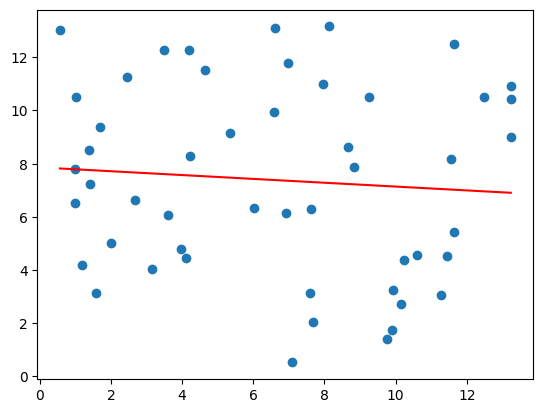

RMS is:  [12.38054512]
Epoch 2800 Complete. 

Stats 
slope: -0.07210811144580719 
y-intercept: 7.86075568398093



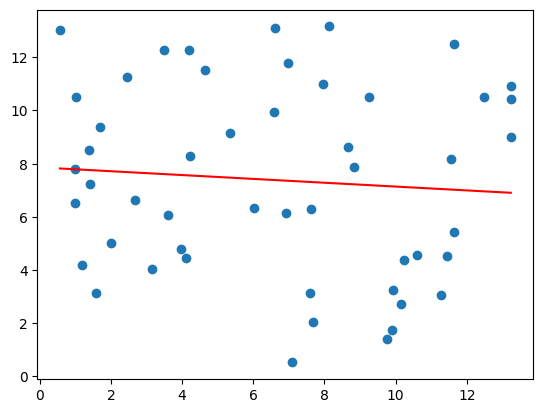

RMS is:  [12.38054512]
Epoch 2850 Complete. 

Stats 
slope: -0.07210822424411369 
y-intercept: 7.860756686191057



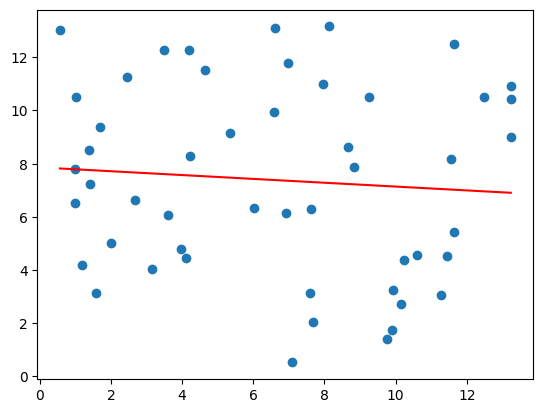

RMS is:  [12.38054512]
Epoch 2900 Complete. 

Stats 
slope: -0.0721083115590246 
y-intercept: 7.860757461981853



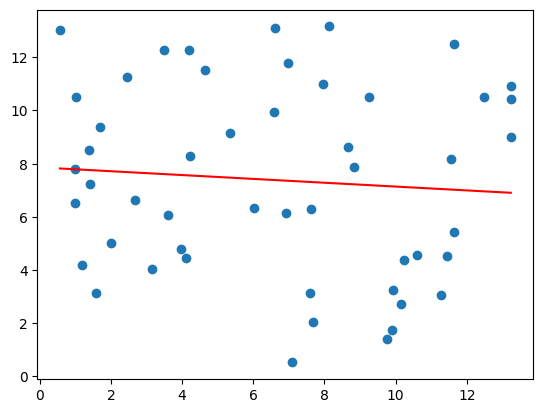

RMS is:  [12.38054512]
Epoch 2950 Complete. 

Stats 
slope: -0.072108379147749 
y-intercept: 7.860758062505976



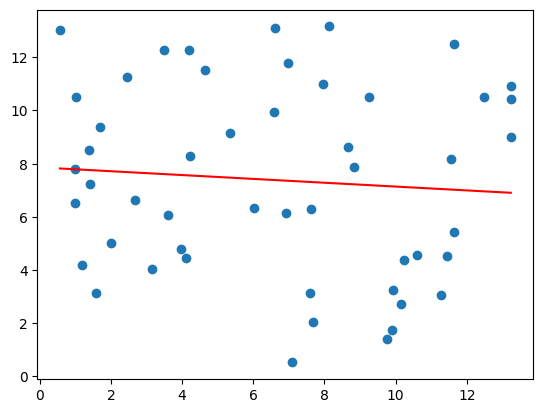

RMS is:  [12.38054512]
Epoch 3000 Complete. 

Stats 
slope: -0.07210843146682741 
y-intercept: 7.860758527359677



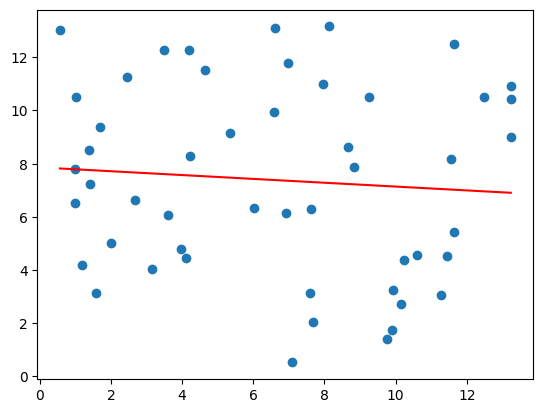

RMS is:  [12.38054512]
Epoch 3050 Complete. 

Stats 
slope: -0.07210847196597833 
y-intercept: 7.860758887193619



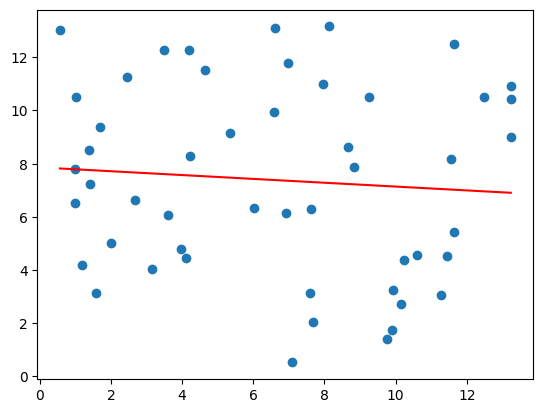

RMS is:  [12.38054512]
Epoch 3100 Complete. 

Stats 
slope: -0.07210850331556022 
y-intercept: 7.860759165733868



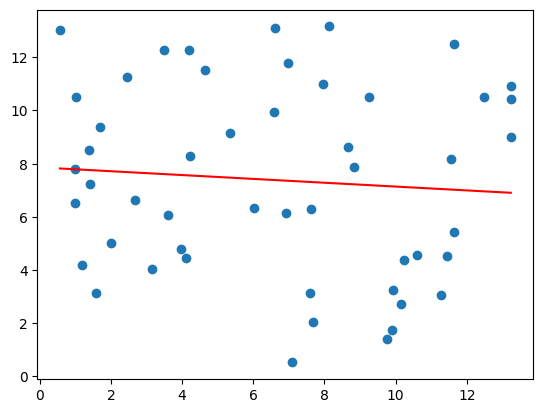

RMS is:  [12.38054512]
Epoch 3150 Complete. 

Stats 
slope: -0.07210852758264395 
y-intercept: 7.860759381346299



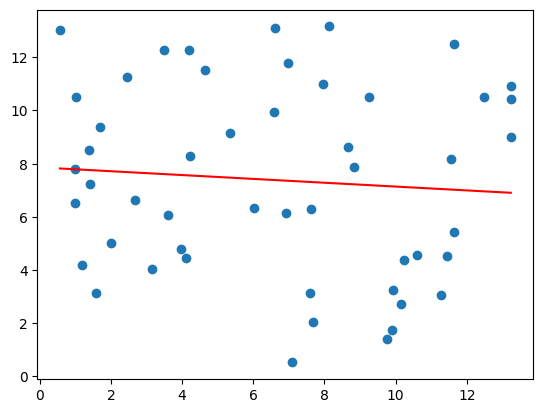

RMS is:  [12.38054512]
Epoch 3200 Complete. 

Stats 
slope: -0.07210854636730729 
y-intercept: 7.860759548247563



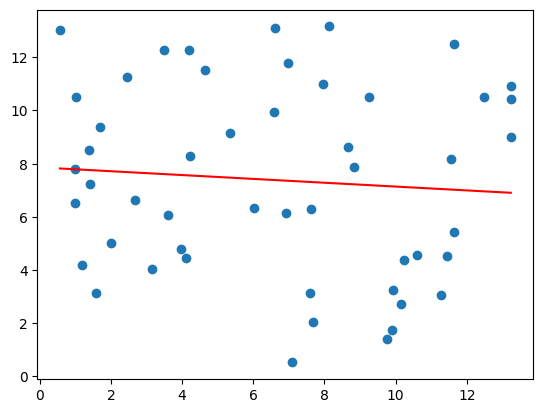

RMS is:  [12.38054512]
Epoch 3250 Complete. 

Stats 
slope: -0.07210856090813945 
y-intercept: 7.860759677442492



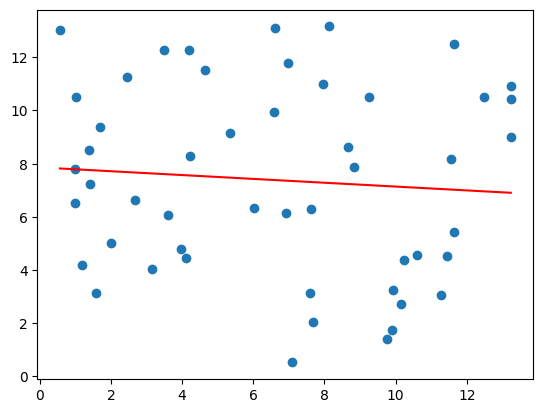

RMS is:  [12.38054512]
Epoch 3300 Complete. 

Stats 
slope: -0.07210857216390626 
y-intercept: 7.860759777449698



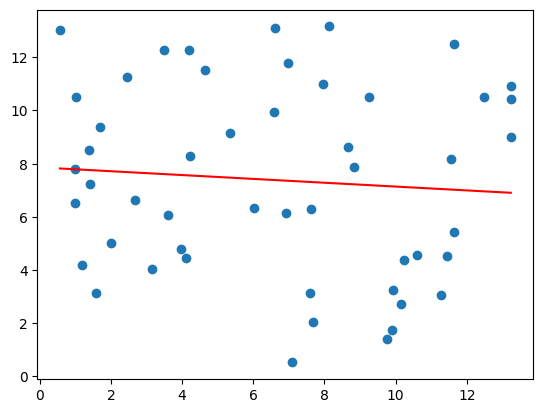

RMS is:  [12.38054512]
Epoch 3350 Complete. 

Stats 
slope: -0.07210858087677015 
y-intercept: 7.860759854863276



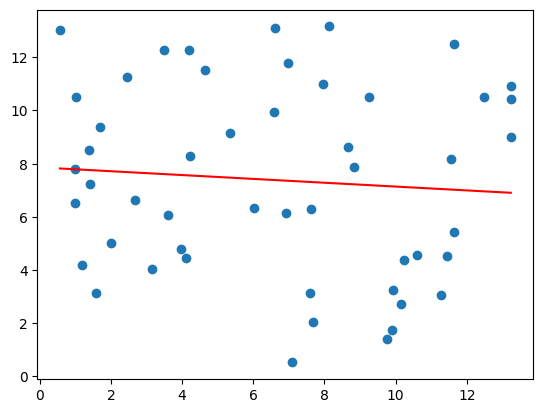

RMS is:  [12.38054512]
Epoch 3400 Complete. 

Stats 
slope: -0.07210858762122337 
y-intercept: 7.8607599147875735



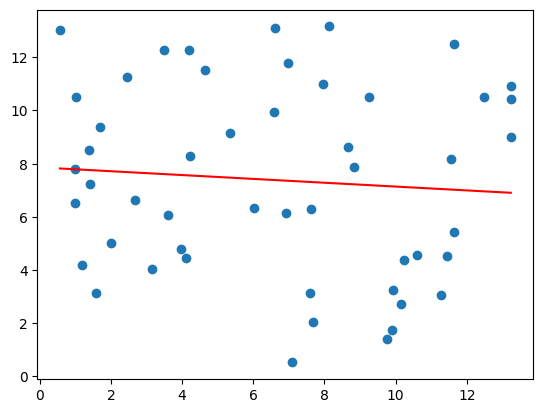

RMS is:  [12.38054512]
Epoch 3450 Complete. 

Stats 
slope: -0.07210859284196955 
y-intercept: 7.860759961173772



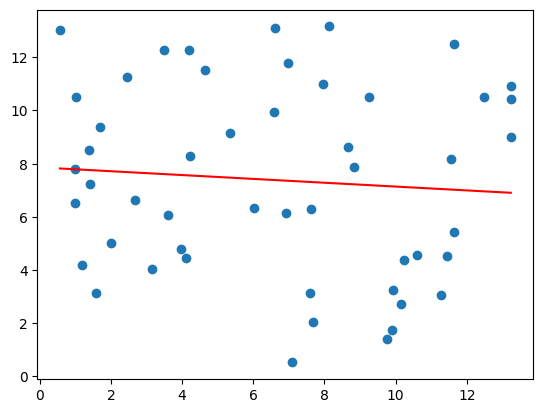

RMS is:  [12.38054512]
Epoch 3500 Complete. 

Stats 
slope: -0.07210859688324499 
y-intercept: 7.860759997080404



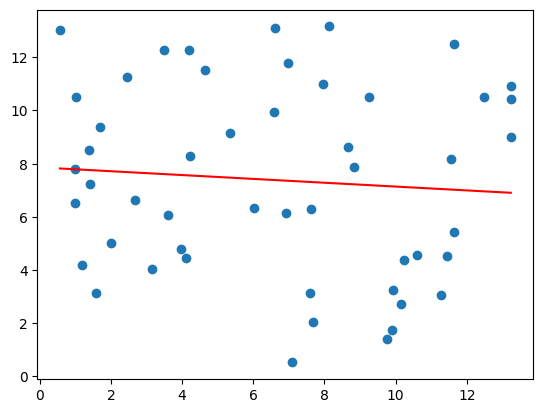

RMS is:  [12.38054512]
Epoch 3550 Complete. 

Stats 
slope: -0.07210860001151533 
y-intercept: 7.860760024875007



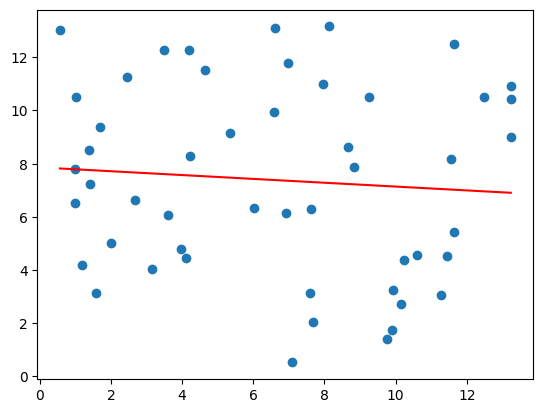

RMS is:  [12.38054512]
Epoch 3600 Complete. 

Stats 
slope: -0.0721086024330467 
y-intercept: 7.8607600463902525



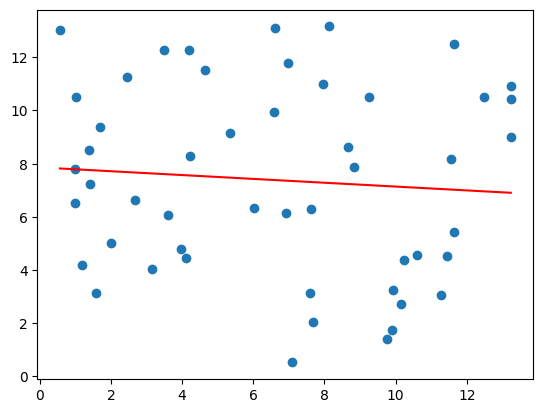

RMS is:  [12.38054512]
Epoch 3650 Complete. 

Stats 
slope: -0.07210860430750536 
y-intercept: 7.860760063044771



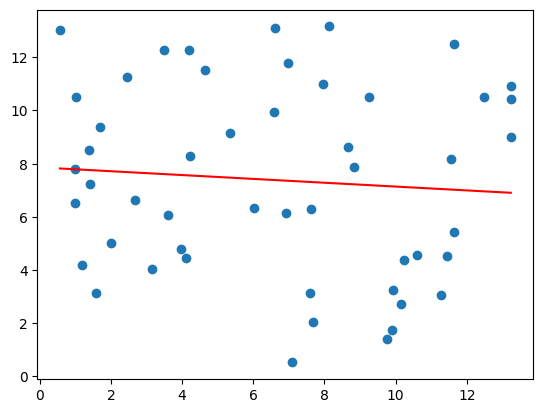

RMS is:  [12.38054512]
Epoch 3700 Complete. 

Stats 
slope: -0.07210860575848664 
y-intercept: 7.860760075936703



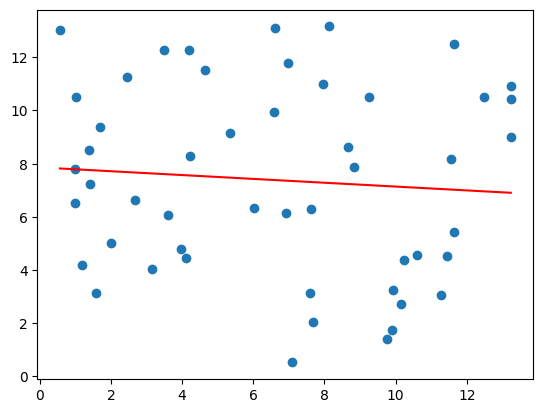

RMS is:  [12.38054512]
Epoch 3750 Complete. 

Stats 
slope: -0.07210860688166217 
y-intercept: 7.86076008591609



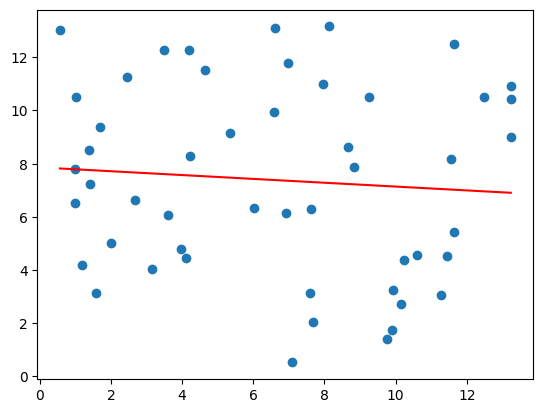

RMS is:  [12.38054512]
Epoch 3800 Complete. 

Stats 
slope: -0.07210860775108971 
y-intercept: 7.860760093640932



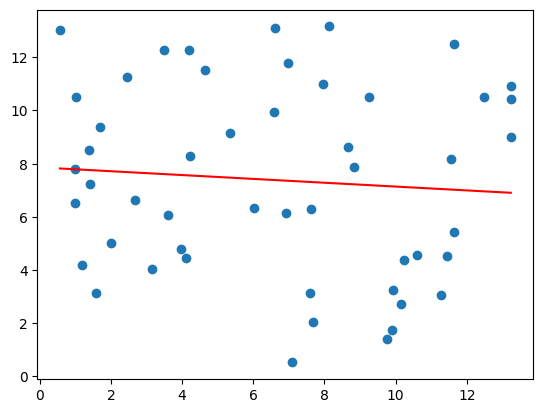

RMS is:  [12.38054512]
Epoch 3850 Complete. 

Stats 
slope: -0.07210860842409637 
y-intercept: 7.860760099620579



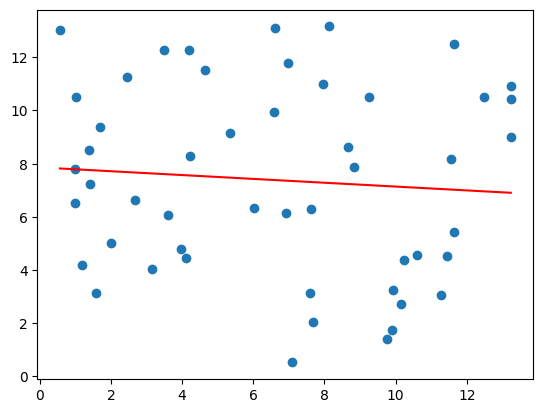

RMS is:  [12.38054512]
Epoch 3900 Complete. 

Stats 
slope: -0.07210860894505716 
y-intercept: 7.860760104249303



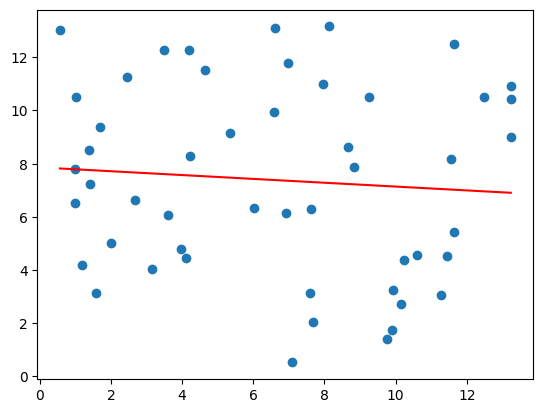

RMS is:  [12.38054512]
Epoch 3950 Complete. 

Stats 
slope: -0.0721086093483225 
y-intercept: 7.860760107832306



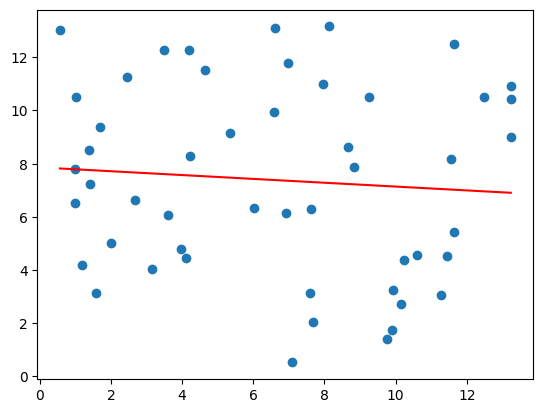

RMS is:  [12.38054512]
Epoch 4000 Complete. 

Stats 
slope: -0.0721086096604821 
y-intercept: 7.860760110605836



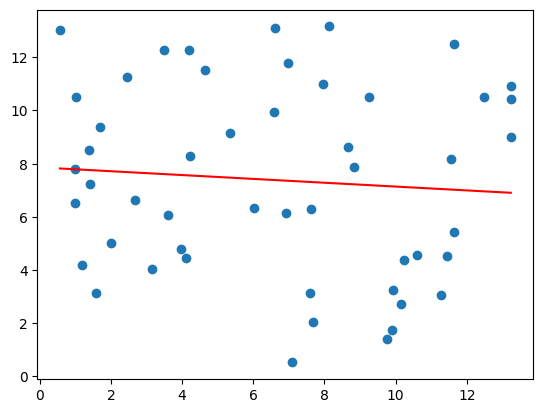

RMS is:  [12.38054512]
Epoch 4050 Complete. 

Stats 
slope: -0.07210860990211854 
y-intercept: 7.860760112752769



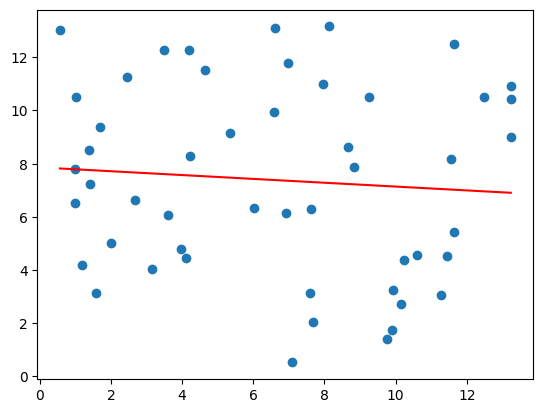

RMS is:  [12.38054512]
Epoch 4100 Complete. 

Stats 
slope: -0.07210861008916446 
y-intercept: 7.860760114414668



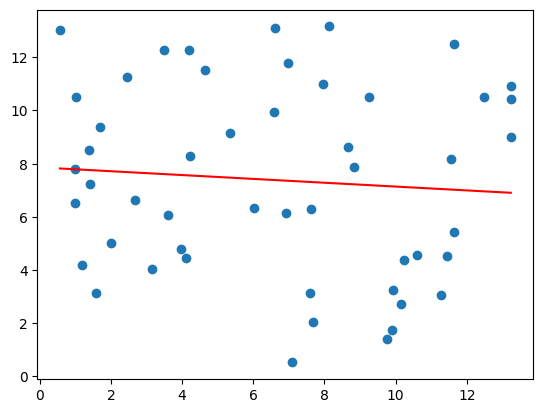

RMS is:  [12.38054512]
Epoch 4150 Complete. 

Stats 
slope: -0.07210861023395303 
y-intercept: 7.86076011570111



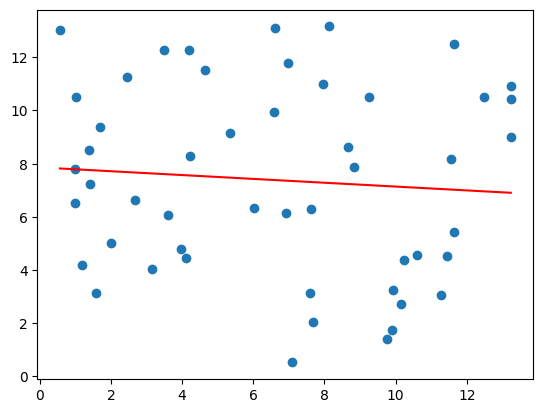

RMS is:  [12.38054512]
Epoch 4200 Complete. 

Stats 
slope: -0.07210861034603079 
y-intercept: 7.860760116696918



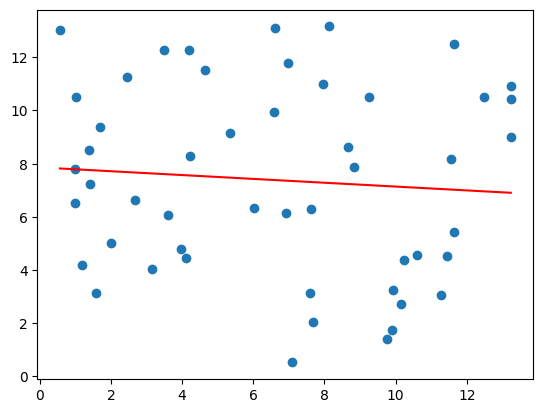

RMS is:  [12.38054512]
Epoch 4250 Complete. 

Stats 
slope: -0.07210861043278803 
y-intercept: 7.860760117467755



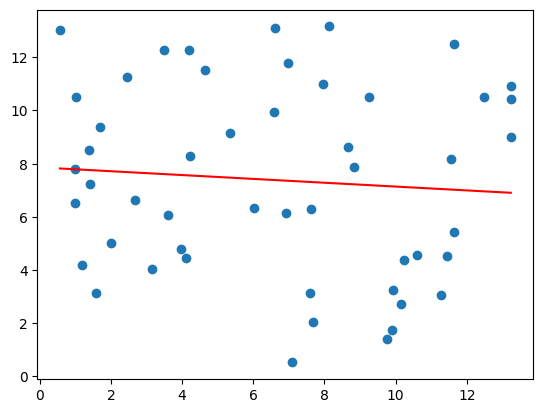

RMS is:  [12.38054512]
Epoch 4300 Complete. 

Stats 
slope: -0.07210861049994496 
y-intercept: 7.860760118064442



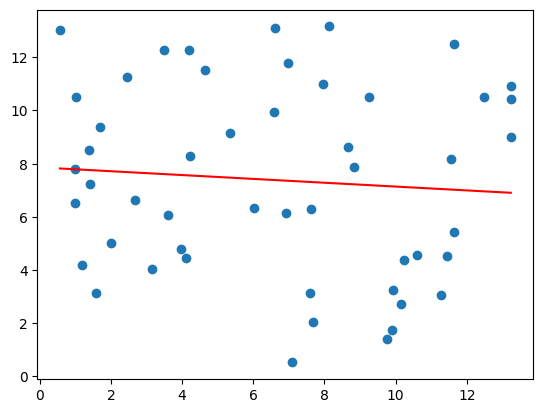

RMS is:  [12.38054512]
Epoch 4350 Complete. 

Stats 
slope: -0.07210861055193007 
y-intercept: 7.860760118526328



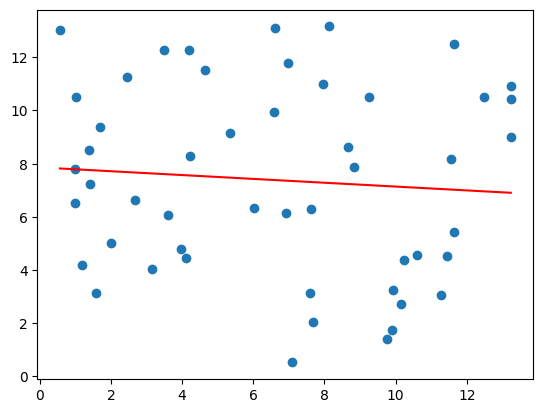

RMS is:  [12.38054512]
Epoch 4400 Complete. 

Stats 
slope: -0.07210861059217064 
y-intercept: 7.8607601188838645



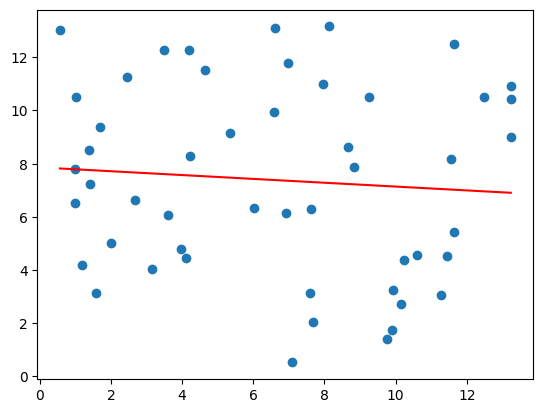

RMS is:  [12.38054512]
Epoch 4450 Complete. 

Stats 
slope: -0.0721086106233202 
y-intercept: 7.860760119160628



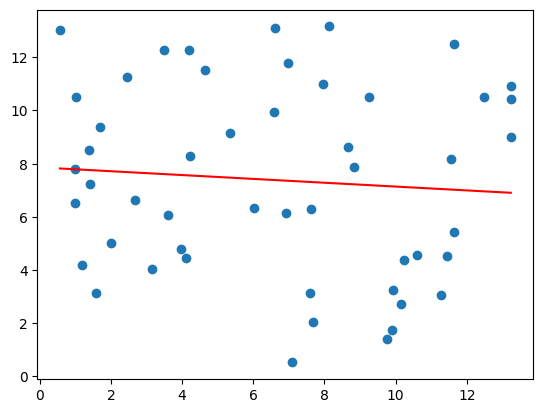

RMS is:  [12.38054512]
Epoch 4500 Complete. 

Stats 
slope: -0.07210861064743222 
y-intercept: 7.860760119374863



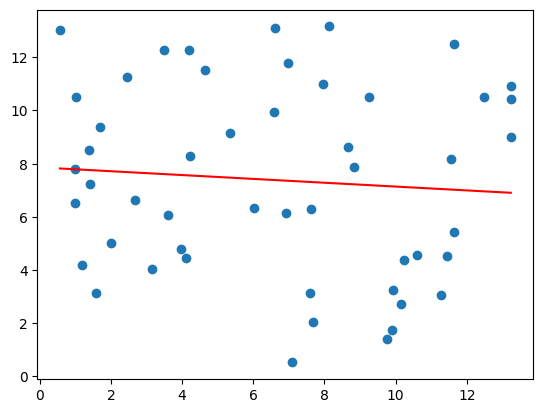

RMS is:  [12.38054512]
Epoch 4550 Complete. 

Stats 
slope: -0.07210861066609703 
y-intercept: 7.860760119540699



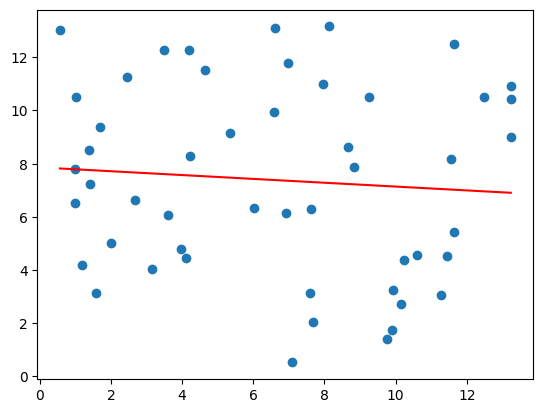

RMS is:  [12.38054512]
Epoch 4600 Complete. 

Stats 
slope: -0.07210861068054493 
y-intercept: 7.860760119669068



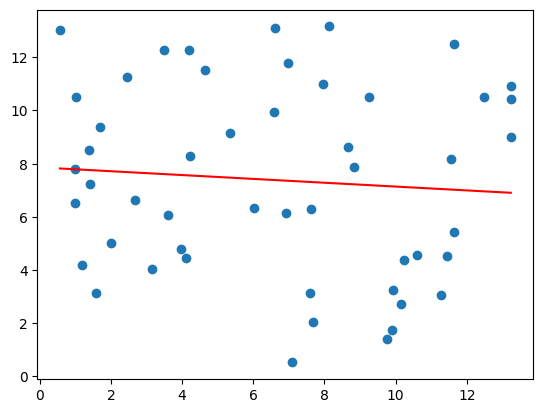

RMS is:  [12.38054512]
Epoch 4650 Complete. 

Stats 
slope: -0.07210861069172894 
y-intercept: 7.860760119768438



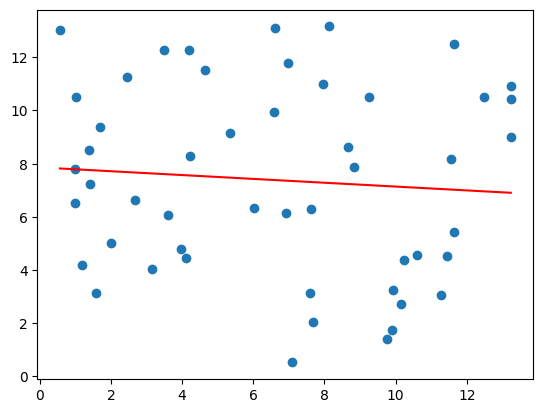

RMS is:  [12.38054512]
Epoch 4700 Complete. 

Stats 
slope: -0.07210861070038618 
y-intercept: 7.860760119845358



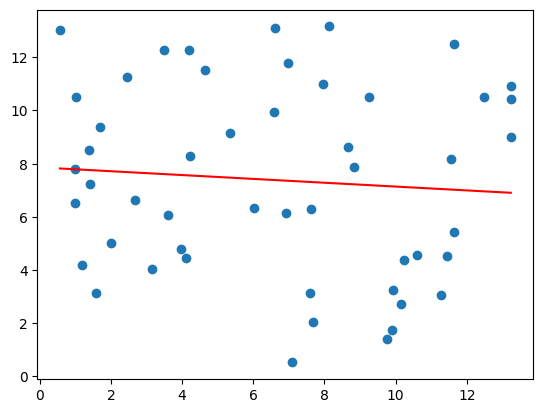

RMS is:  [12.38054512]
Epoch 4750 Complete. 

Stats 
slope: -0.07210861070708754 
y-intercept: 7.860760119904898



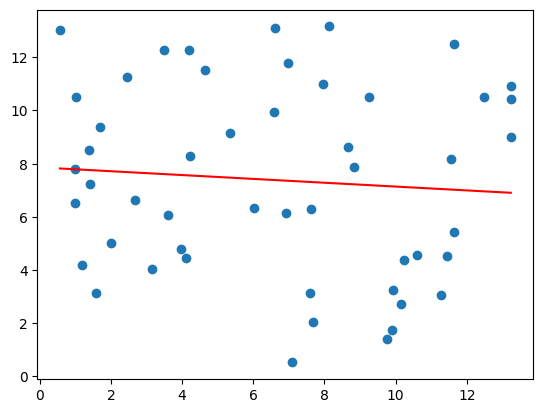

RMS is:  [12.38054512]
Epoch 4800 Complete. 

Stats 
slope: -0.07210861071227496 
y-intercept: 7.860760119950989



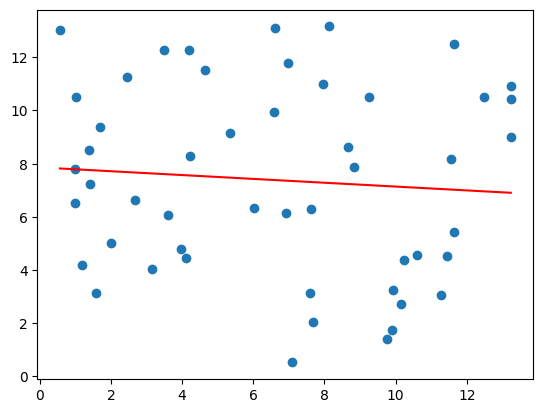

RMS is:  [12.38054512]
Epoch 4850 Complete. 

Stats 
slope: -0.07210861071629038 
y-intercept: 7.860760119986666



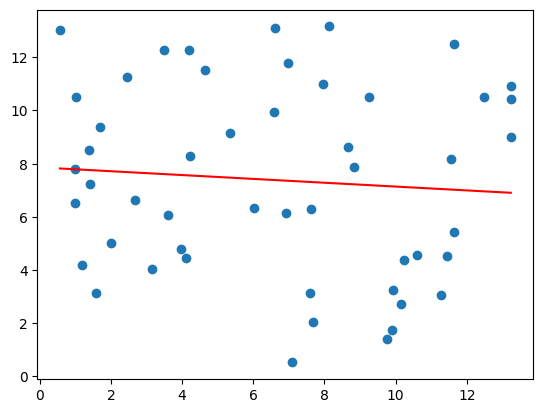

RMS is:  [12.38054512]
Epoch 4900 Complete. 

Stats 
slope: -0.0721086107193988 
y-intercept: 7.860760120014284



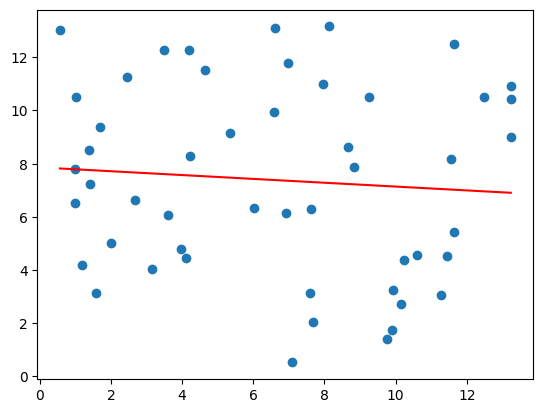

RMS is:  [12.38054512]
Epoch 4950 Complete. 

Stats 
slope: -0.07210861072180469 
y-intercept: 7.86076012003566



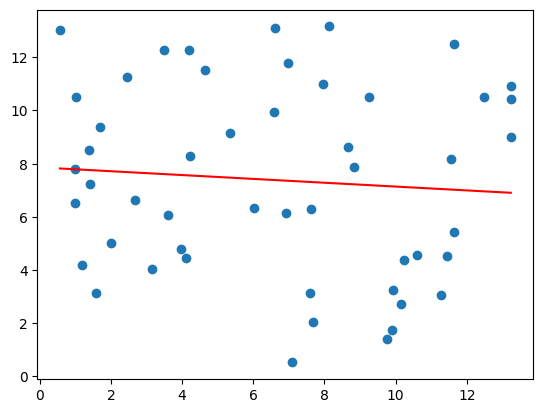

In [ ]:
houdini_v3(x, y, 5000, 500, 0.01, 50)

In [ ]:
x = np.arange(100)

delta = np.random.uniform(-50,50, size=(100,))

y = -4 * x +3 + delta

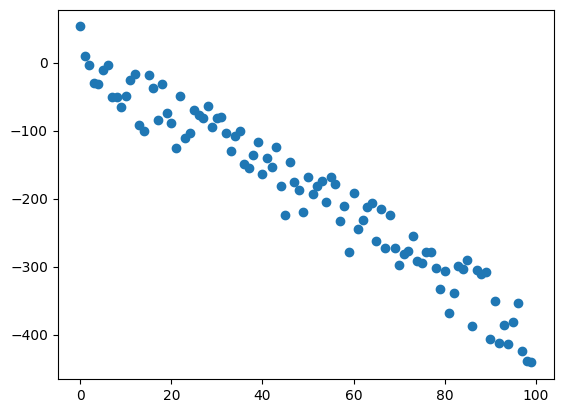

In [ ]:
plt.scatter(x,y)

In [ ]:
x = np.transpose([x],(1,0))
y = np.transpose([y],(1,0))

Your initial weights are, slope: 0.3219432297039596, y-intercept: 0.8068292539378266
RMS is:  [7740.83998687]
Epoch 0 Complete. 

Stats 
slope: -2.4467281885148293 
y-intercept: 0.765683961232363



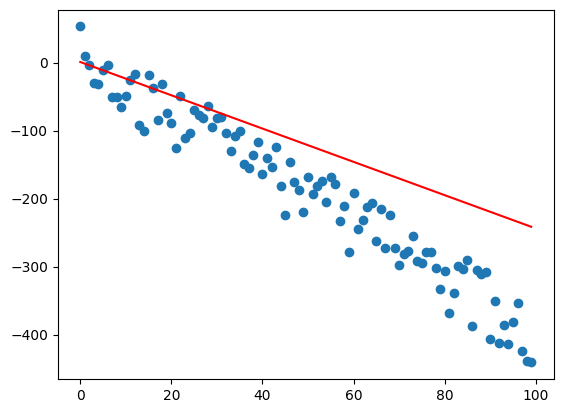

RMS is:  [868.33376082]
Epoch 10 Complete. 

Stats 
slope: -3.8931880992903203 
y-intercept: 0.7498416602135841



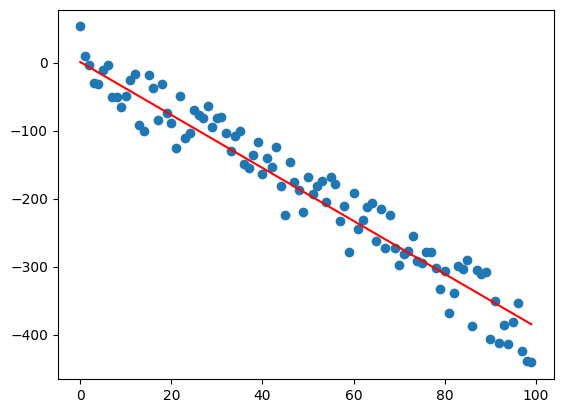

RMS is:  [868.29821742]
Epoch 20 Complete. 

Stats 
slope: -3.8933107132993787 
y-intercept: 0.7558020977029091



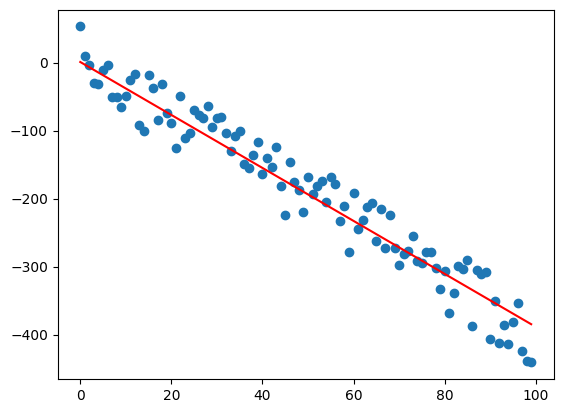

RMS is:  [868.2627136]
Epoch 30 Complete. 

Stats 
slope: -3.893400538676743 
y-intercept: 0.761760004824866



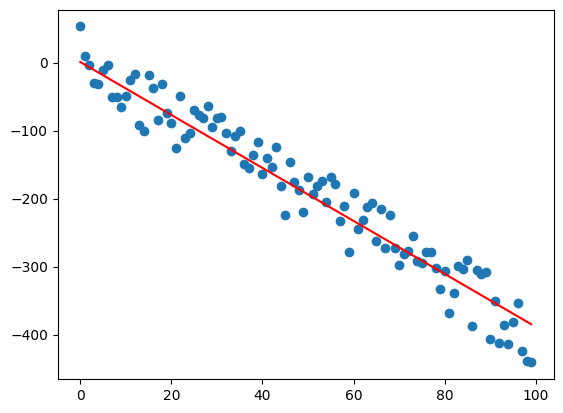

RMS is:  [868.22724579]
Epoch 40 Complete. 

Stats 
slope: -3.893490317744228 
y-intercept: 0.767714889472924



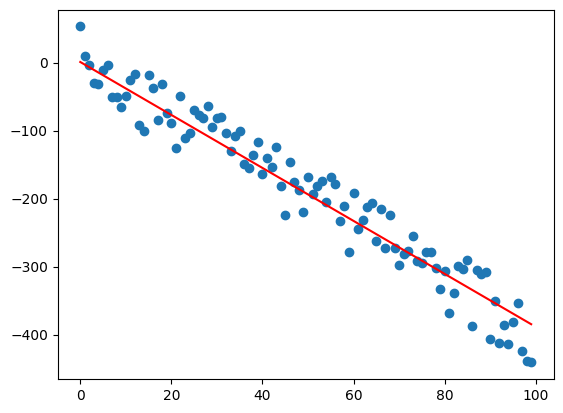

RMS is:  [868.19181395]
Epoch 50 Complete. 

Stats 
slope: -3.893580051266191 
y-intercept: 0.7736667531692337



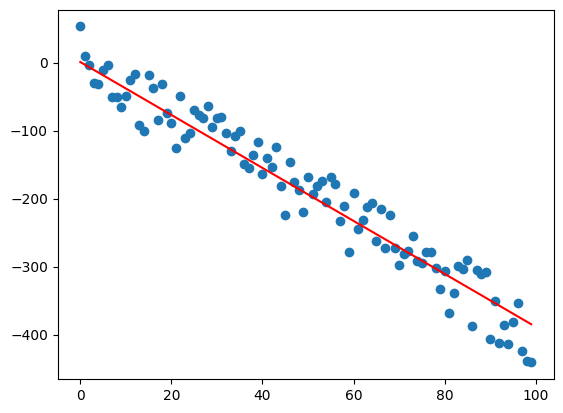

RMS is:  [868.15641806]
Epoch 60 Complete. 

Stats 
slope: -3.8936697392657535 
y-intercept: 0.7796155974463437



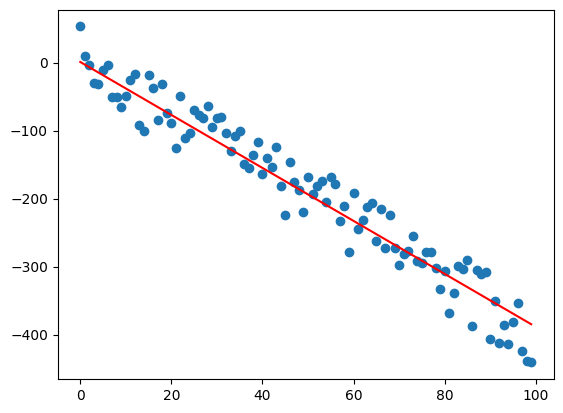

RMS is:  [868.12105806]
Epoch 70 Complete. 

Stats 
slope: -3.8937593817660106 
y-intercept: 0.7855614238360251



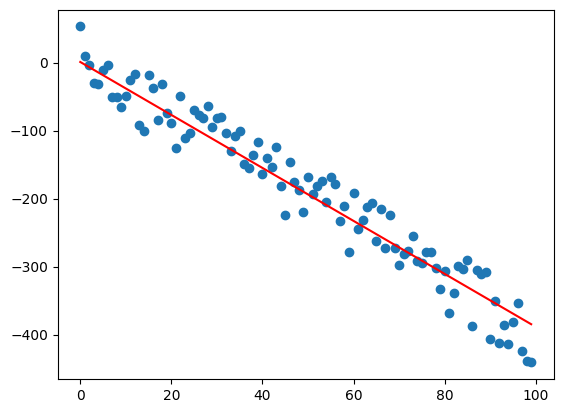

RMS is:  [868.08573394]
Epoch 80 Complete. 

Stats 
slope: -3.893848978790044 
y-intercept: 0.7915042338692715



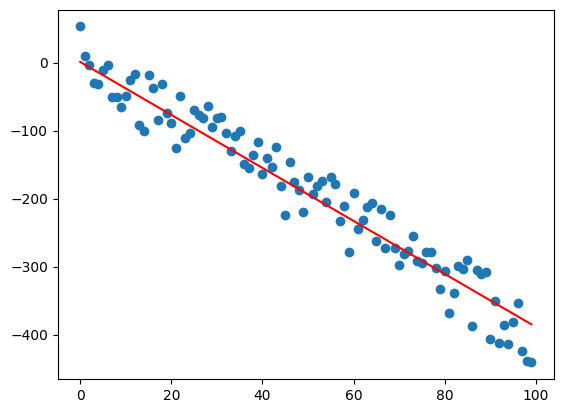

RMS is:  [868.05044565]
Epoch 90 Complete. 

Stats 
slope: -3.893938530360923 
y-intercept: 0.7974440290763004



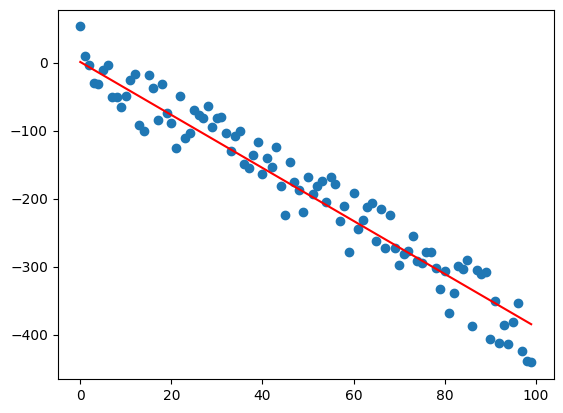

In [ ]:
houdini_v3(x, y, 100, 500, 0.0001, 10)

This is what happens when the learning rate is too high:

Your initial weights are, slope: 0.8105818081153282, y-intercept: 0.32585562356571474
RMS is:  [627589.50348785]
Epoch 0 Complete. 

Stats 
slope: -17.698210594209794 
y-intercept: 0.0505359041317448



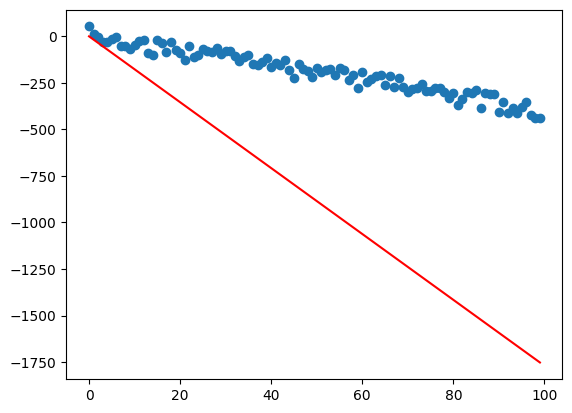

RMS is:  [5422010.5151918]
Epoch 1 Complete. 

Stats 
slope: 36.7376948184409 
y-intercept: 0.874968837059208



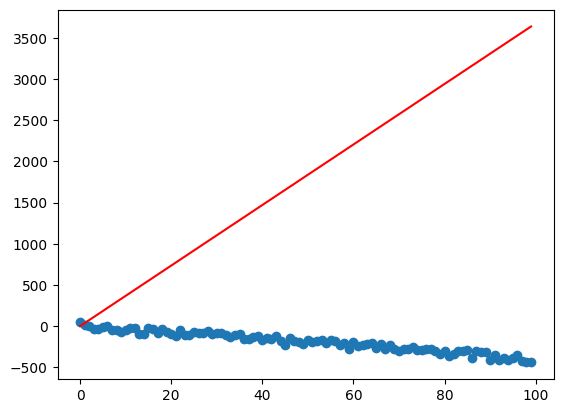

RMS is:  [46893958.67144473]
Epoch 2 Complete. 

Stats 
slope: -123.36372559205049 
y-intercept: -1.5350803310442935



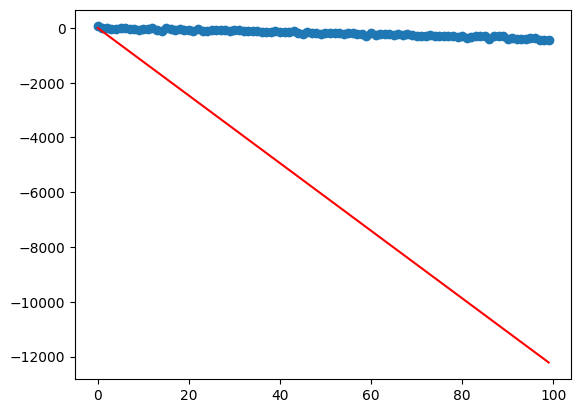

RMS is:  [4.05628094e+08]
Epoch 3 Complete. 

Stats 
slope: 347.5096276194615 
y-intercept: 5.567786932237119



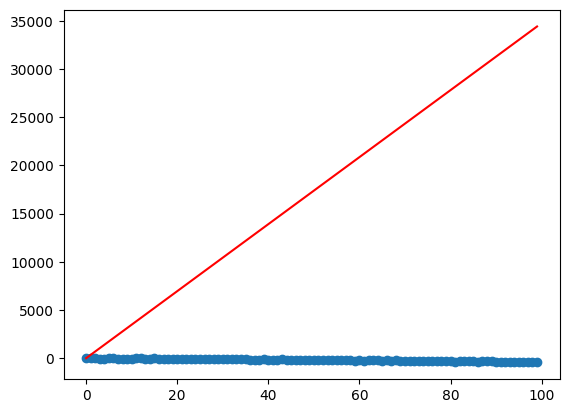

RMS is:  [3.5086938e+09]
Epoch 4 Complete. 

Stats 
slope: -1037.3741158084645 
y-intercept: -15.307746425961223



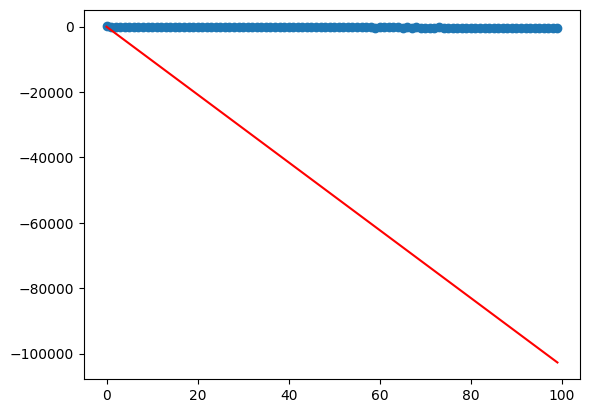

RMS is:  [3.03503456e+10]
Epoch 5 Complete. 

Stats 
slope: 3035.7010732998006 
y-intercept: 46.103865215489066



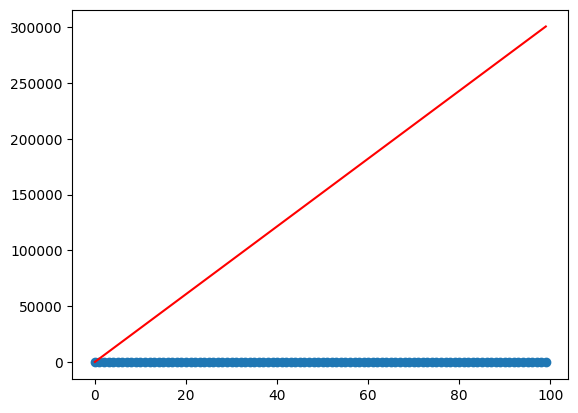

RMS is:  [2.62531788e+11]
Epoch 6 Complete. 

Stats 
slope: -8943.602447447822 
y-intercept: -134.49888331006136



KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [ ]:
houdini_v3(x, y, 100, 500, 0.0006, 1)

#Parabolic Regression

Save for later..

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [ ]:
#Parabolic Regression
def yhat(xPadded, weights, start, end):
  return np.dot(xPadded[start:end, :], weights)

def rmsFunc(yTrue, yHat, n):
  return sum((yTrue - yHat) ** 2)/n

def houdiniP(x, y, epoch, batch, lr, graphEpoch = 1):

  #Loading preset weights or setting random ones.
  weights = np.random.rand(3,1)


  print(f"Your initial weights are, a: {weights[0][0]}, b: {weights[1][0]}, c: {weights[2][0]}")

  #Padding x for dot products
  xPadded = np.hstack((x ** 2, x, np.ones((len(x),1))))

  #Looping through the dataset for each epoch and batch.
  for epochCount in range(epoch):
    for batchCount in range(math.ceil(len(x)/batch)):
      if batchCount*batch + batch < len(x):
        end = batchCount*batch + batch
      else:
        end = len(x)

      start = batchCount*batch
      rms = rmsFunc(y[start:end], yhat(xPadded, weights, start, end), (end-start))

      aUpd = sum((y[start:end]-yhat(xPadded, weights, start, end)) * (x[start:end] ** 2) * 2)/(end-start)
      bUpd = sum((y[start:end]-yhat(xPadded, weights, start, end)) * x[start:end] * 2)/(end-start)
      cUpd = sum((y[start:end]-yhat(xPadded, weights, start, end)) * 2)/(end-start)

      weights[0] = weights[0] + lr * aUpd
      weights[1] = weights[1] + lr * bUpd
      weights[2] = weights[2] + lr * cUpd

    if epochCount % graphEpoch == 0:
      start, end =  0, len(x)
      print("RMS is: ",rmsFunc(y[start:end], yhat(xPadded, weights, start, end), (end-start)))
      print(f"Epoch {epochCount} Complete. \n")
      print(f"Your initial weights are, a: {weights[0][0]}, b: {weights[1][0]}, c: {weights[2][0]}")
      plt.scatter(x,y)
      xPlot = np.linspace(min(x), max(x), 1000)

      yPlot = weights[0]*xPlot**2 + weights[1]*xPlot + weights[2]
      plt.plot(xPlot, yPlot, color = 'r')
      plt.show()

In [ ]:
x = np.arange(100)

delta = np.random.uniform(-1000,1000, size=(100,))

y = 0.2* x**2 + 5*x +3 + delta

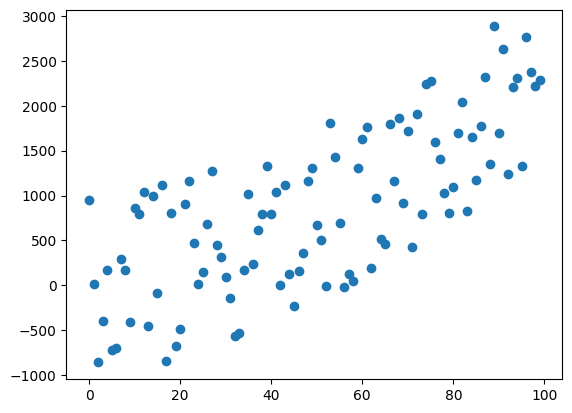

In [ ]:
plt.scatter(x,y)

In [ ]:
x = np.transpose([x],(1,0))
y = np.transpose([y],(1,0))

Your initial weights are, a: 0.09693346705804418, b: 0.7670335840038821, c: 0.5770586675918252
RMS is:  [497623.30025986]
Epoch 0 Complete. 

Your initial weights are, a: 0.1504629680384278, b: 0.7677272664291271, c: 0.5770686909965446


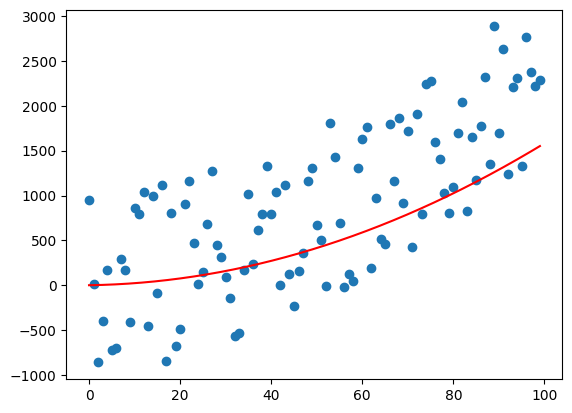

RMS is:  [411821.2199013]
Epoch 1 Complete. 

Your initial weights are, a: 0.18310899498978755, b: 0.7681585819707697, c: 0.5770751984319884


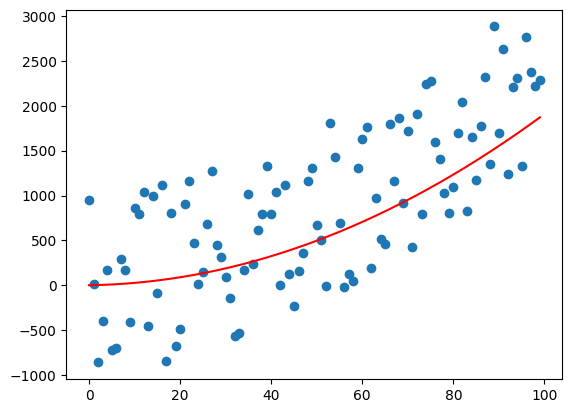

RMS is:  [379907.66055649]
Epoch 2 Complete. 

Your initial weights are, a: 0.20301878096092918, b: 0.7684298873264032, c: 0.5770795615757098


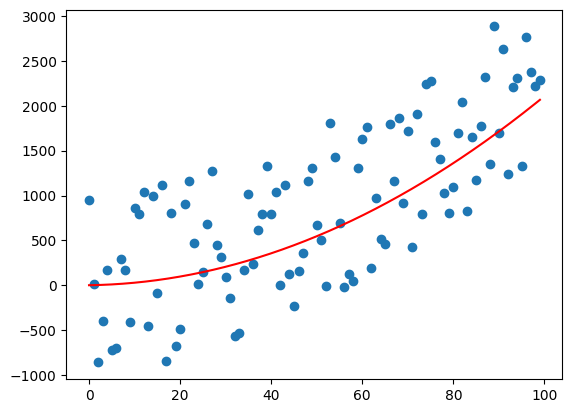

RMS is:  [368037.58950445]
Epoch 3 Complete. 

Your initial weights are, a: 0.21516109327911107, b: 0.7686036069549428, c: 0.577082616975107


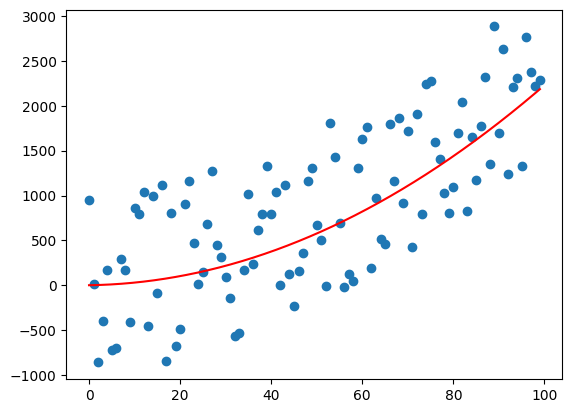

RMS is:  [363622.56482208]
Epoch 4 Complete. 

Your initial weights are, a: 0.22256624280012127, b: 0.7687178117707744, c: 0.5770848748168106


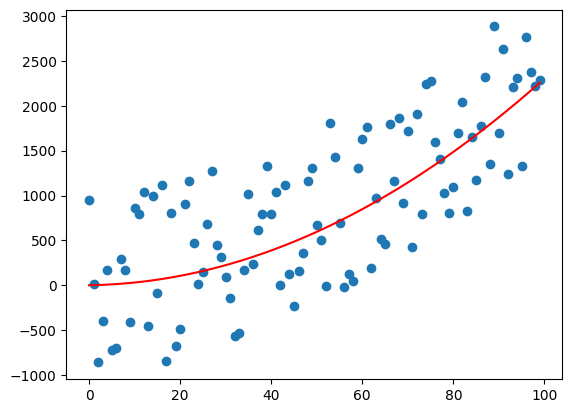

RMS is:  [361980.39661883]
Epoch 5 Complete. 

Your initial weights are, a: 0.2270823305272671, b: 0.7687957201493127, c: 0.5770866462492372


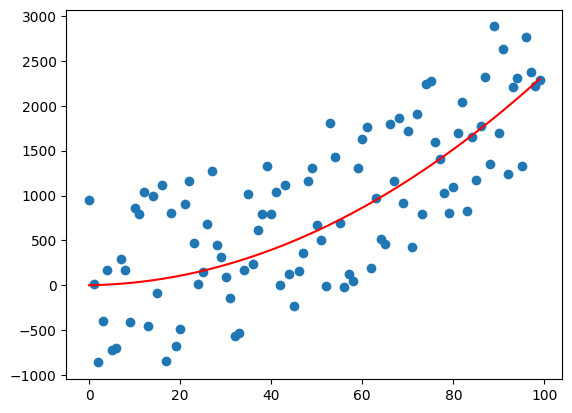

RMS is:  [361369.57452311]
Epoch 6 Complete. 

Your initial weights are, a: 0.22983646106498262, b: 0.7688514923219473, c: 0.5770881210330181


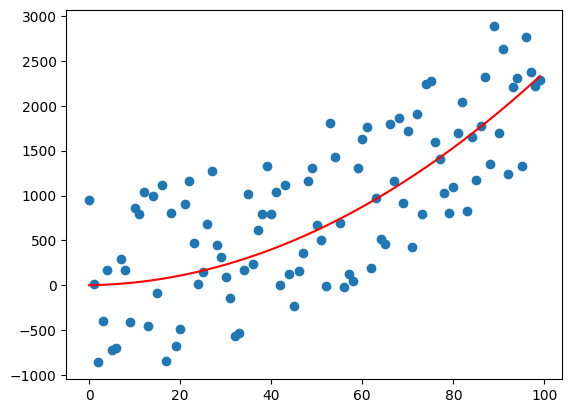

RMS is:  [361142.35496938]
Epoch 7 Complete. 

Your initial weights are, a: 0.23151602367774163, b: 0.7688937642138631, c: 0.5770894148978026


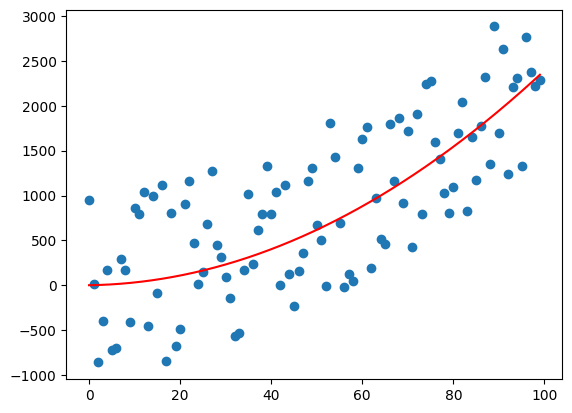

RMS is:  [361057.81391058]
Epoch 8 Complete. 

Your initial weights are, a: 0.23254023766342904, b: 0.7689278026319191, c: 0.5770905984238354


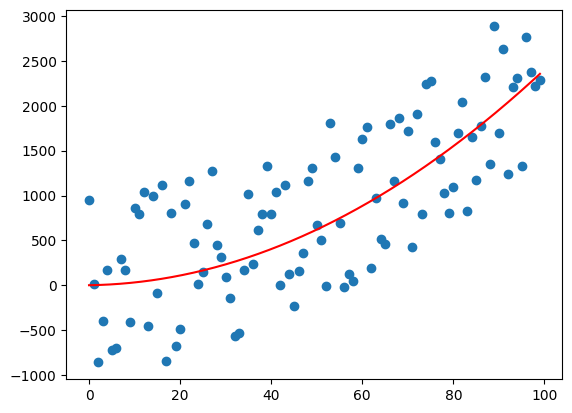

RMS is:  [361026.34119918]
Epoch 9 Complete. 

Your initial weights are, a: 0.23316477303145897, b: 0.7689568196528636, c: 0.5770917146560139


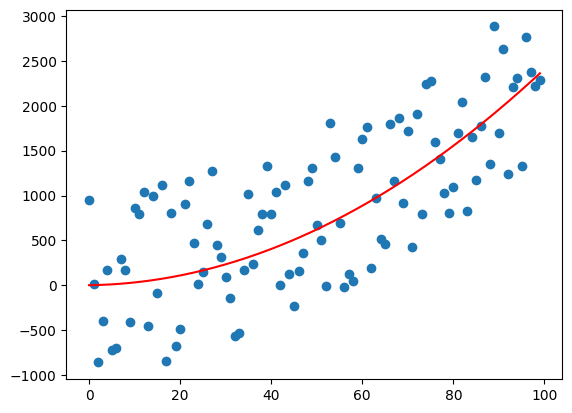

RMS is:  [361014.60691803]
Epoch 10 Complete. 

Your initial weights are, a: 0.23354555569946825, b: 0.7689827742315841, c: 0.5770927898462057


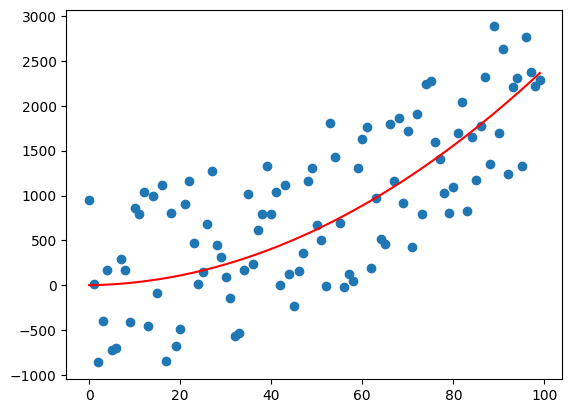

RMS is:  [361010.2142191]
Epoch 11 Complete. 

Your initial weights are, a: 0.23377768048067582, b: 0.7690068610793386, c: 0.5770938400046831


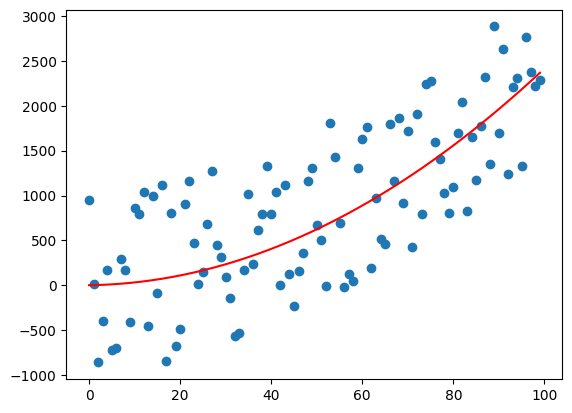

RMS is:  [361008.55217462]
Epoch 12 Complete. 

Your initial weights are, a: 0.23391914301582045, b: 0.7690298088167797, c: 0.5770948748956591


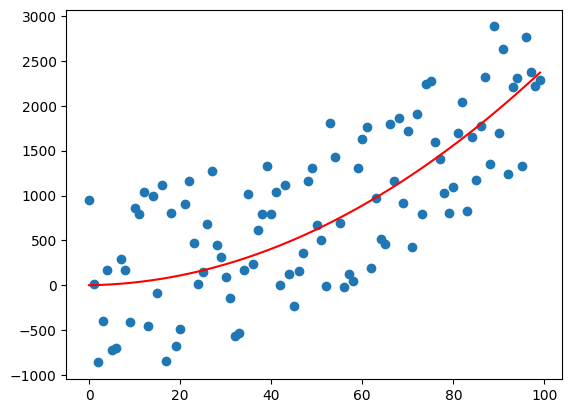

RMS is:  [361007.90577971]
Epoch 13 Complete. 

Your initial weights are, a: 0.23400531320816867, b: 0.7690520618090649, c: 0.5770959004740516


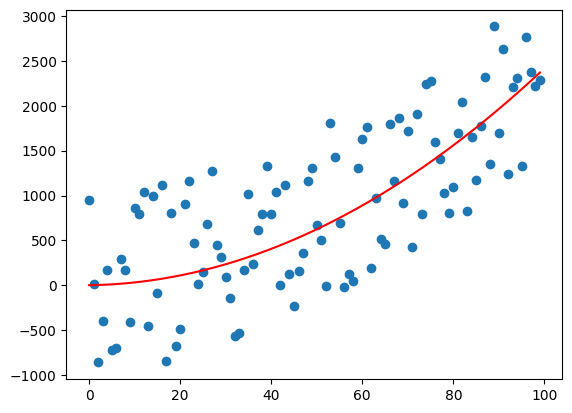

RMS is:  [361007.63714935]
Epoch 14 Complete. 

Your initial weights are, a: 0.23405776216274063, b: 0.7690738910619532, c: 0.5770969203715965


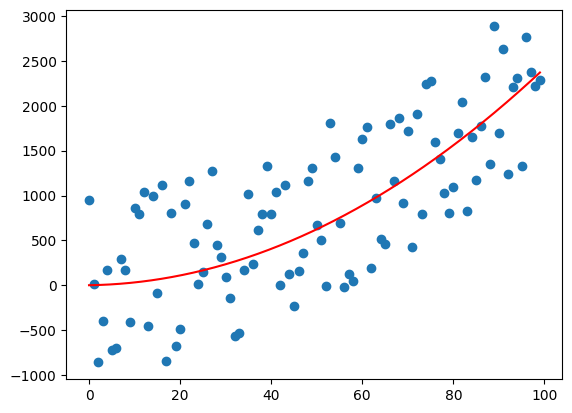

RMS is:  [361007.50902631]
Epoch 15 Complete. 

Your initial weights are, a: 0.23408964548723707, b: 0.7690954618542029, c: 0.5770979368031872


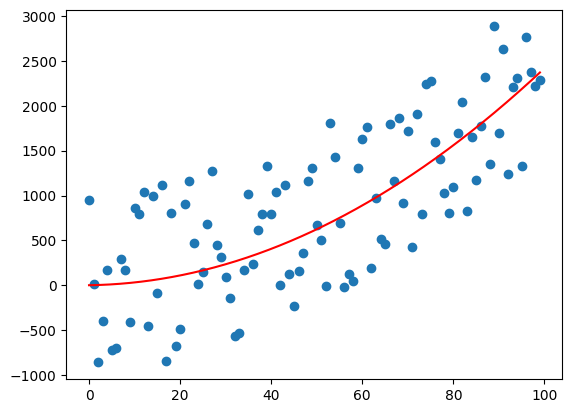

RMS is:  [361007.43316429]
Epoch 16 Complete. 

Your initial weights are, a: 0.2341089864152297, b: 0.7691168749846606, c: 0.5770989511196246


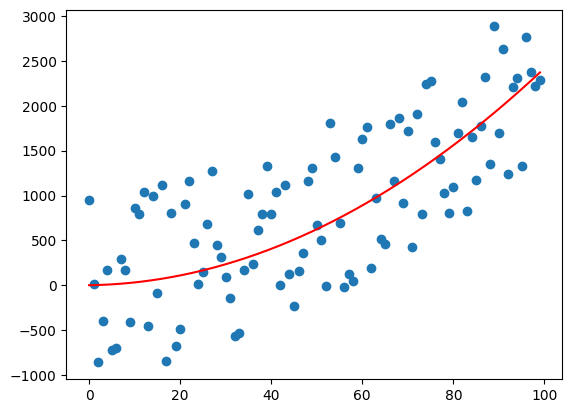

RMS is:  [361007.37674066]
Epoch 17 Complete. 

Your initial weights are, a: 0.23412067809026693, b: 0.7691381919276964, c: 0.577099964144724


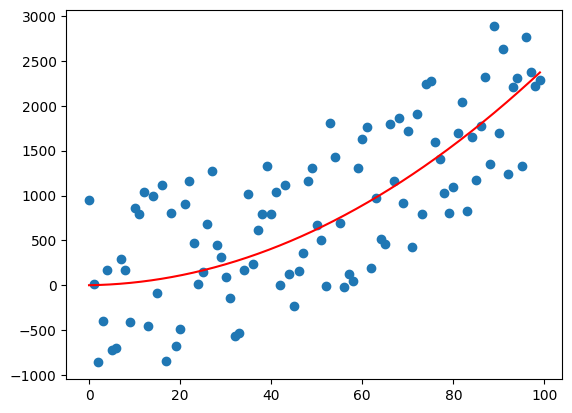

RMS is:  [361007.32754724]
Epoch 18 Complete. 

Your initial weights are, a: 0.23412770470239772, b: 0.769159450174792, c: 0.577100976380907


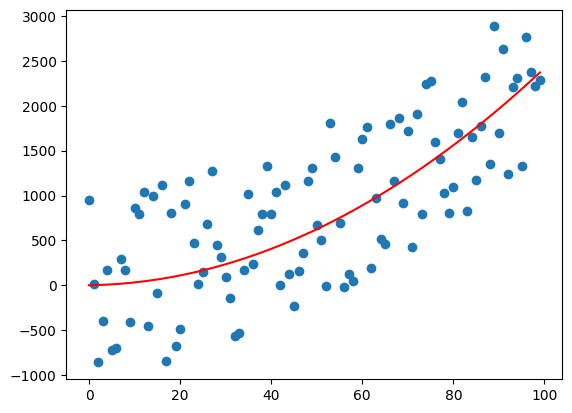

RMS is:  [361007.28104328]
Epoch 19 Complete. 

Your initial weights are, a: 0.23413188622484793, b: 0.7691806725909437, c: 0.5771019881345865


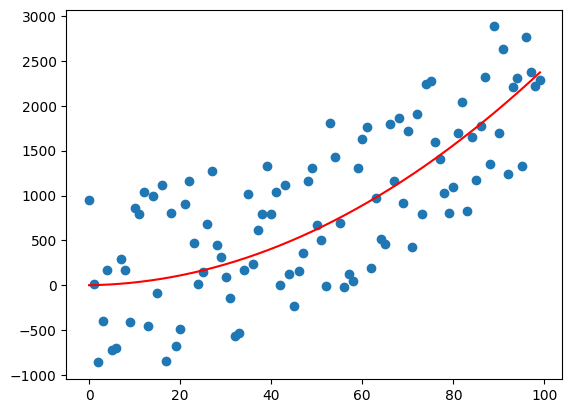

RMS is:  [361007.23553988]
Epoch 20 Complete. 

Your initial weights are, a: 0.23413433260788497, b: 0.769201873120867, c: 0.577102999592635


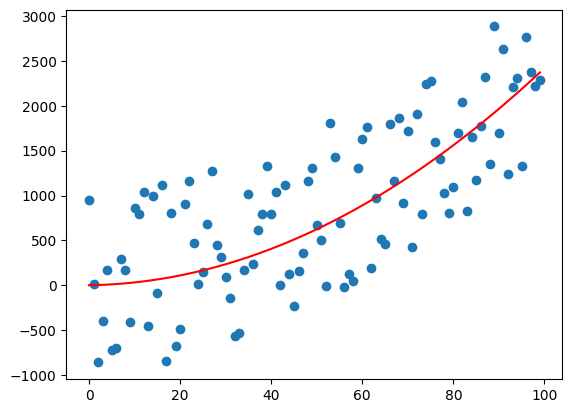

RMS is:  [361007.19040887]
Epoch 21 Complete. 

Your initial weights are, a: 0.23413572077882766, b: 0.76922306026905, c: 0.5771040108690207


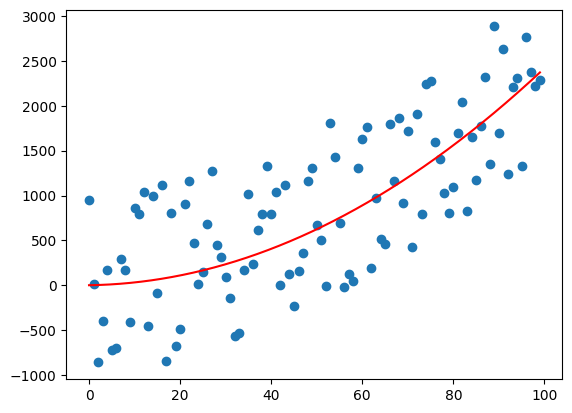

RMS is:  [361007.14541659]
Epoch 22 Complete. 

Your initial weights are, a: 0.2341364635765287, b: 0.76924423922214, c: 0.5771050220332499


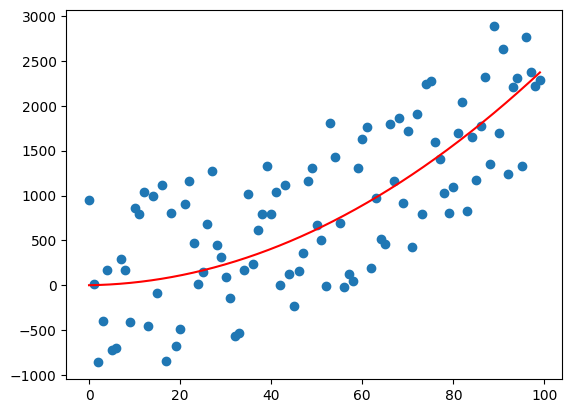

RMS is:  [361007.10047615]
Epoch 23 Complete. 

Your initial weights are, a: 0.2341368127797442, b: 0.7692654131433271, c: 0.577106033127712


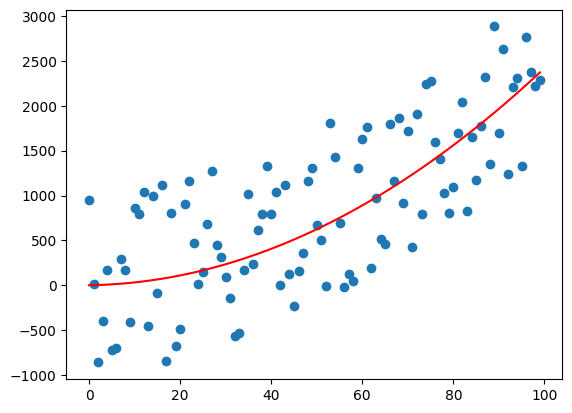

RMS is:  [361007.05555522]
Epoch 24 Complete. 

Your initial weights are, a: 0.23413692194122634, b: 0.7692865839617514, c: 0.5771070441782596


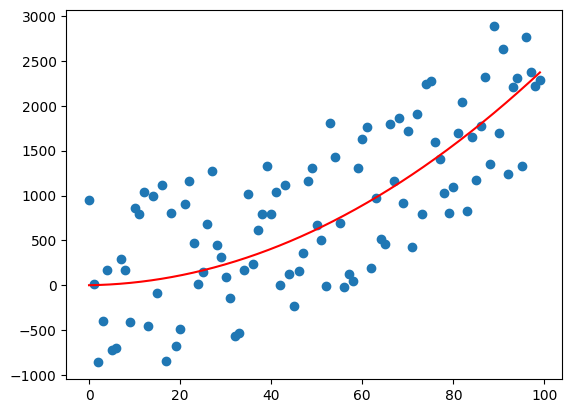

RMS is:  [361007.01064178]
Epoch 25 Complete. 

Your initial weights are, a: 0.2341368847084617, b: 0.7693077528539414, c: 0.5771080552006592


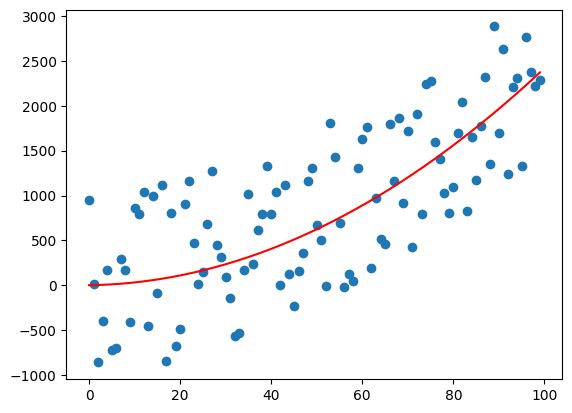

RMS is:  [361006.96573136]
Epoch 26 Complete. 

Your initial weights are, a: 0.2341367581944074, b: 0.7693289205374284, c: 0.5771090662045265


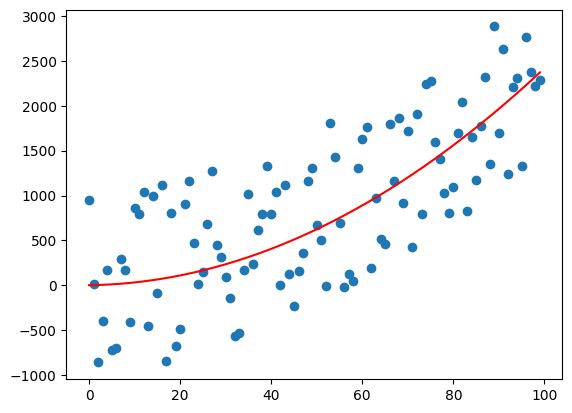

RMS is:  [361006.92082229]
Epoch 27 Complete. 

Your initial weights are, a: 0.23413657723064293, b: 0.7693500874498148, c: 0.5771100771957257


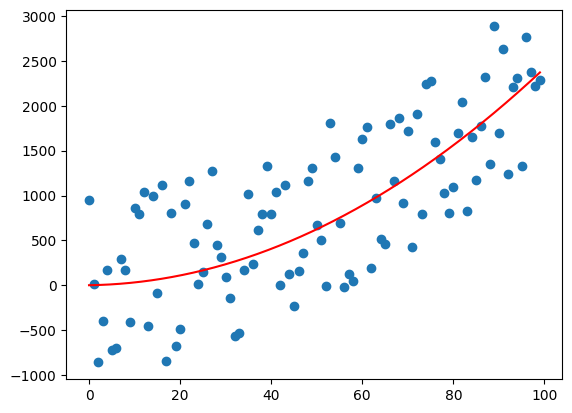

RMS is:  [361006.87591395]
Epoch 28 Complete. 

Your initial weights are, a: 0.2341363630599648, b: 0.7693712538579822, c: 0.5771110881778334


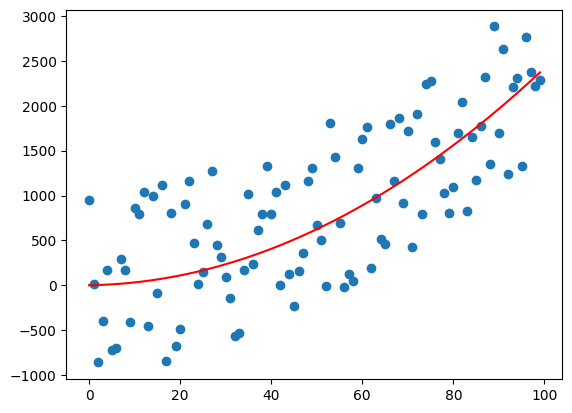

RMS is:  [361006.83100613]
Epoch 29 Complete. 

Your initial weights are, a: 0.2341361286377546, b: 0.7693924199246941, c: 0.5771120991530306


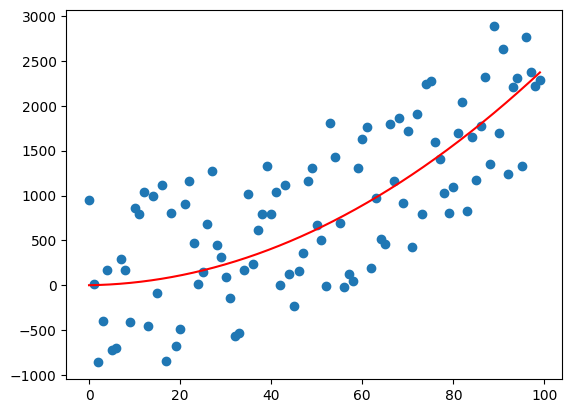

RMS is:  [361006.78609872]
Epoch 30 Complete. 

Your initial weights are, a: 0.2341358818651337, b: 0.7694135857492156, c: 0.5771131101226478


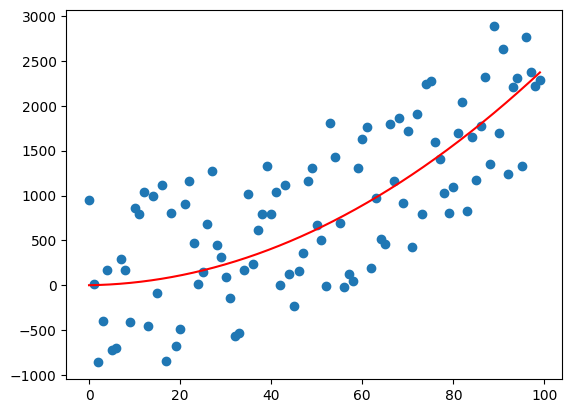

RMS is:  [361006.7411917]
Epoch 31 Complete. 

Your initial weights are, a: 0.23413562756077289, b: 0.7694347513920857, c: 0.577114121087496


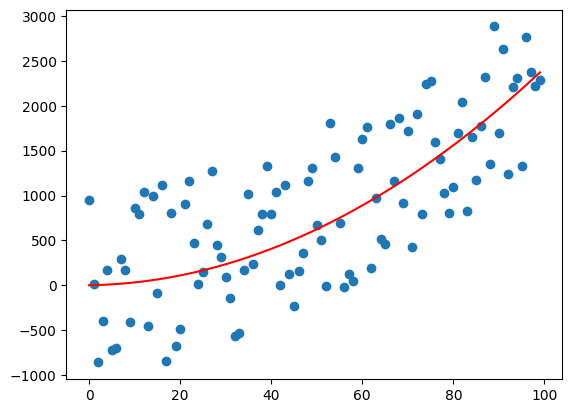

RMS is:  [361006.69628505]
Epoch 32 Complete. 

Your initial weights are, a: 0.23413536866344328, b: 0.7694559168902257, c: 0.5771151320480703


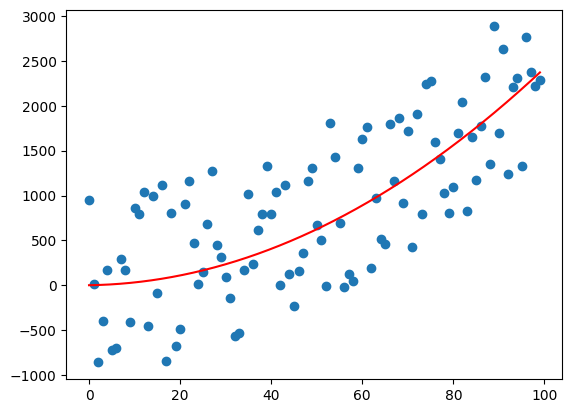

RMS is:  [361006.65137878]
Epoch 33 Complete. 

Your initial weights are, a: 0.23413510696541845, b: 0.769477082266153, c: 0.5771161430046723


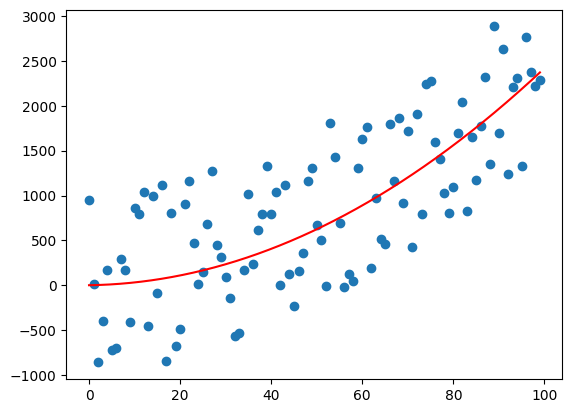

RMS is:  [361006.60647288]
Epoch 34 Complete. 

Your initial weights are, a: 0.23413484355975542, b: 0.7694982475336003, c: 0.5771171539574861


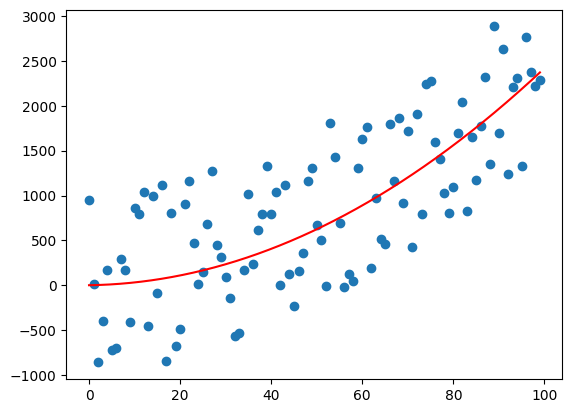

RMS is:  [361006.56156734]
Epoch 35 Complete. 

Your initial weights are, a: 0.23413457911307878, b: 0.7695194127009432, c: 0.5771181649066239


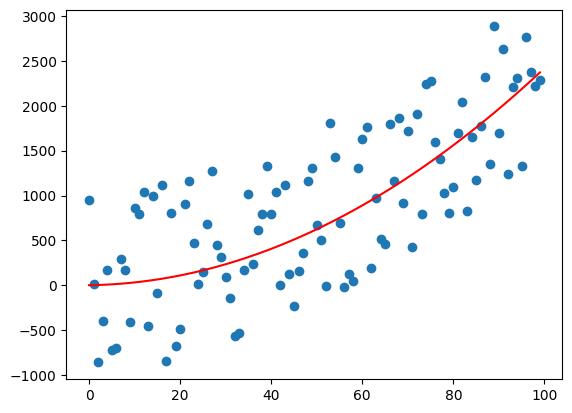

RMS is:  [361006.51666218]
Epoch 36 Complete. 

Your initial weights are, a: 0.23413431403194404, b: 0.7695405777732895, c: 0.5771191758521542


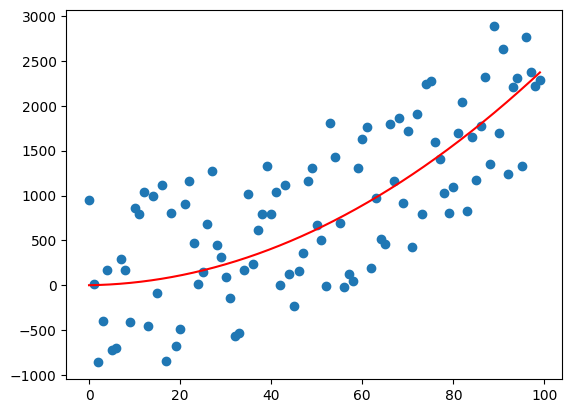

RMS is:  [361006.47175738]
Epoch 37 Complete. 

Your initial weights are, a: 0.23413404856429793, b: 0.7695617427537549, c: 0.5771201867941187


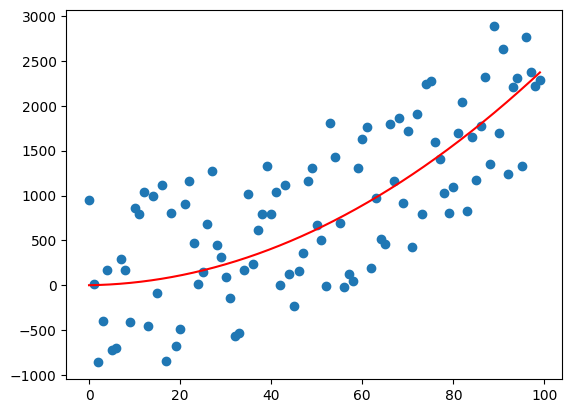

RMS is:  [361006.42685296]
Epoch 38 Complete. 

Your initial weights are, a: 0.2341337828613561, b: 0.7695829076442393, c: 0.5771211977325429


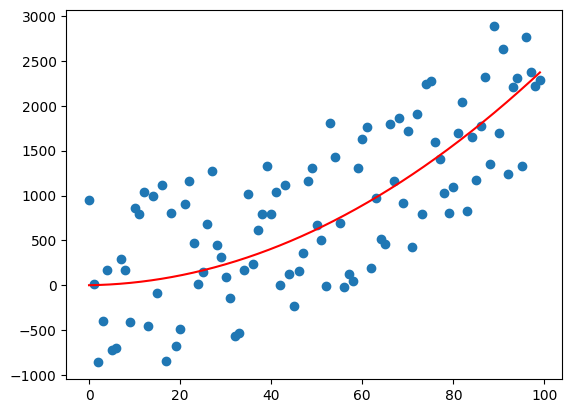

RMS is:  [361006.3819489]
Epoch 39 Complete. 

Your initial weights are, a: 0.23413351701534083, b: 0.7696040724459019, c: 0.5771222086674423


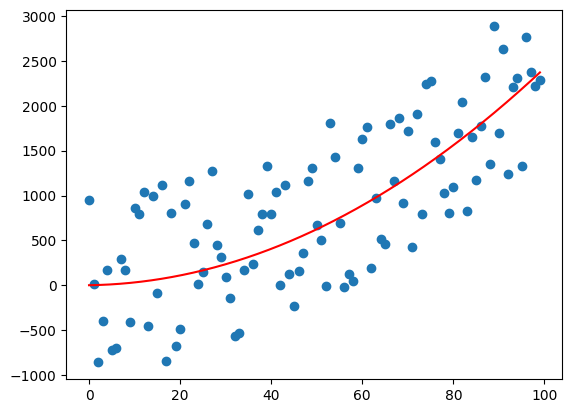

RMS is:  [361006.33704521]
Epoch 40 Complete. 

Your initial weights are, a: 0.23413325108249575, b: 0.7696252371594495, c: 0.5771232195988265


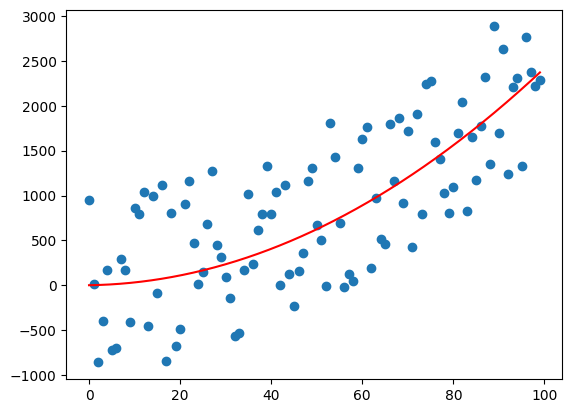

RMS is:  [361006.29214189]
Epoch 41 Complete. 

Your initial weights are, a: 0.23413298509712233, b: 0.7696464017853135, c: 0.5771242305267013


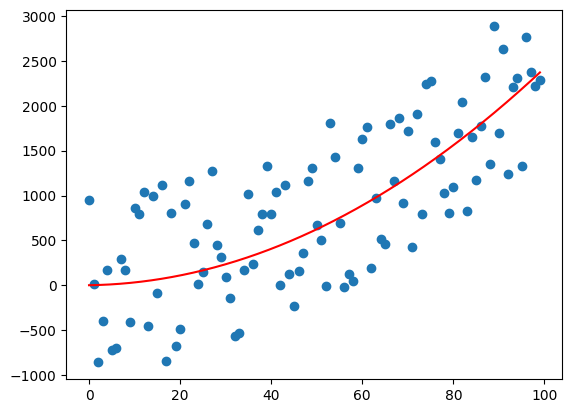

RMS is:  [361006.24723894]
Epoch 42 Complete. 

Your initial weights are, a: 0.23413271908014002, b: 0.769667566323757, c: 0.57712524145107


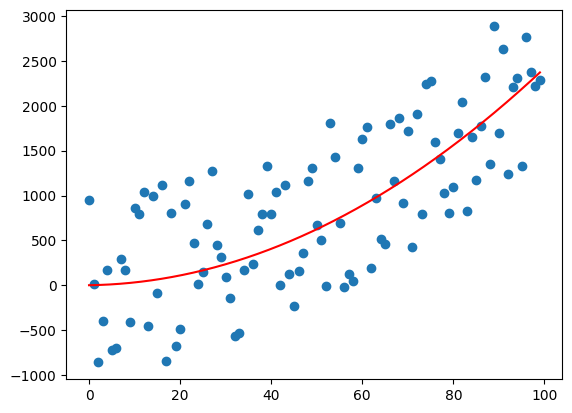

RMS is:  [361006.20233636]
Epoch 43 Complete. 

Your initial weights are, a: 0.23413245304430708, b: 0.7696887307749406, c: 0.577126252371935


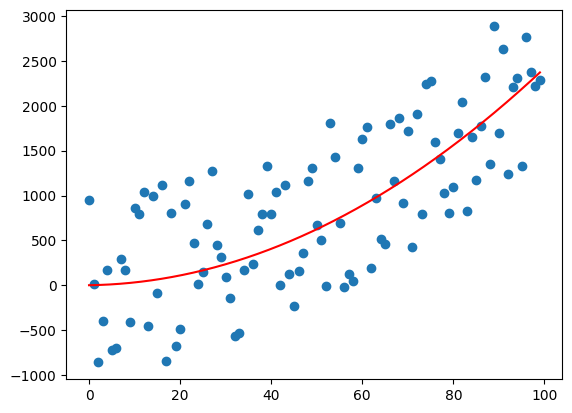

RMS is:  [361006.15743415]
Epoch 44 Complete. 

Your initial weights are, a: 0.23413218699740432, b: 0.7697098951389625, c: 0.5771272632892976


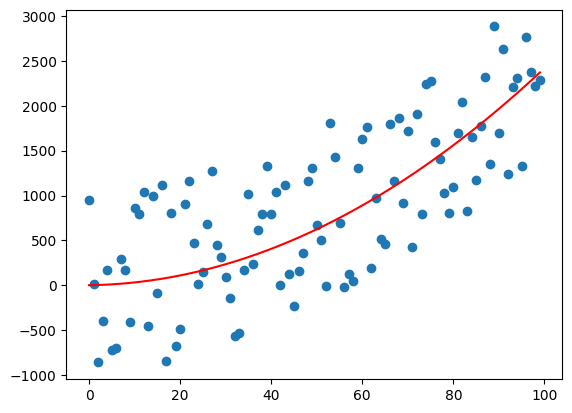

RMS is:  [361006.11253231]
Epoch 45 Complete. 

Your initial weights are, a: 0.2341319209441771, b: 0.7697310594158827, c: 0.5771282742031586


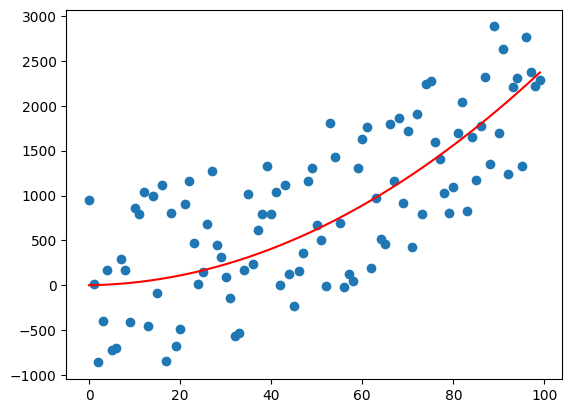

RMS is:  [361006.06763083]
Epoch 46 Complete. 

Your initial weights are, a: 0.23413165488751944, b: 0.7697522236057378, c: 0.5771292851135184


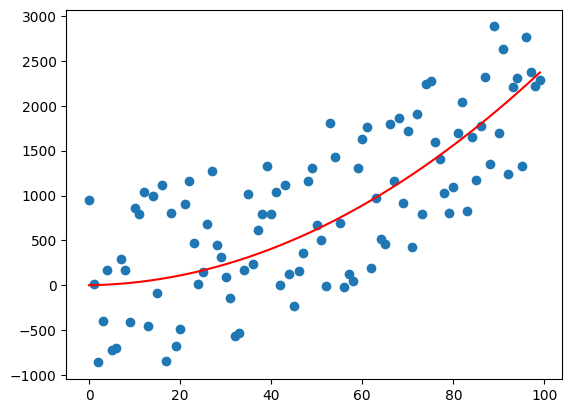

RMS is:  [361006.02272973]
Epoch 47 Complete. 

Your initial weights are, a: 0.23413138882919632, b: 0.7697733877085504, c: 0.5771302960203774


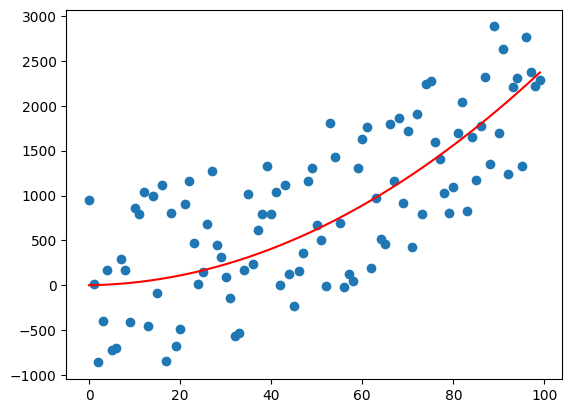

RMS is:  [361005.97782899]
Epoch 48 Complete. 

Your initial weights are, a: 0.2341311227702842, b: 0.7697945517243344, c: 0.5771313069237357


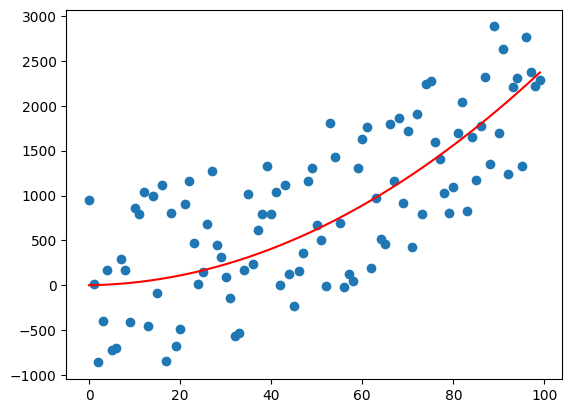

RMS is:  [361005.93292863]
Epoch 49 Complete. 

Your initial weights are, a: 0.2341308567114395, b: 0.7698157156530985, c: 0.5771323178235935


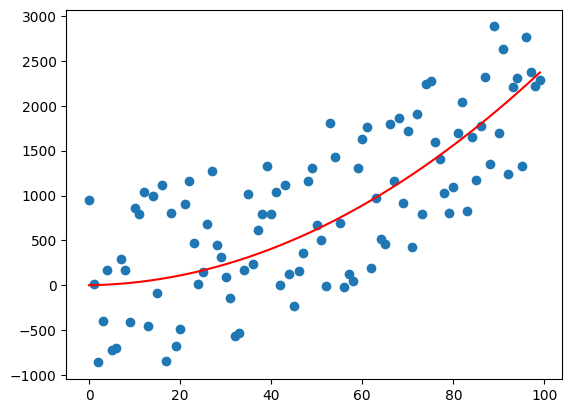

In [ ]:
houdiniP(x, y, 50, 1000, 0.00000001, graphEpoch = 1)